In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import nibabel as nib
from time import time
from xml.etree import ElementTree as ET
import os
import pandas as pd
import sys
import scipy
from scipy.interpolate import interp1d
from scipy.ndimage.filters import gaussian_filter
from scipy import signal
from scipy.ndimage.interpolation import shift
from numpy.linalg import *
from scipy.linalg import toeplitz
import scipy.linalg as sl
from sklearn.cluster import KMeans
import skimage
from sklearn.linear_model import LassoLarsIC
import smtplib
from email.mime.text import MIMEText
import re
import traceback
from IPython.core.magic import register_cell_magic
from functools import wraps

sys.path.insert(0, '/home/users/brezovec/.local/lib/python3.6/site-packages/lib/python/')
import ants

sys.path.insert(0, '/home/users/brezovec/projects/lysis/')
from bruker import *

%matplotlib inline

In [2]:
def load_numpy_brain(file, channel=None, flip=False):
    # If no channel specified, load all channels, else load specified channel
    brain = nib.load(file).get_data()
    if channel == 'red':
        brain = brain[:,:,:,:,0] # for red brain.
    if channel  == 'green':
        brain = brain[:,:,:,:,1] # for green brain.
    #brain = np.swapaxes(brain, 0, 1)
    if flip is True:
        brain = np.flip(brain, 2)
    brain = np.squeeze(brain)
    brain = np.asarray(brain, 'float64')
    #brain = ants.from_numpy(brain)
    return brain

def load_brains_from_dir(folder):
    brain_files = sorted(os.listdir(folder))
    full_brain_files = [folder+brain_file for brain_file in brain_files]
    brains = [load_brain(brain) for brain in full_brain_files]
    return brains

def rotate_brain(brain):
    try:
        if type(brain) is not np.ndarray:
            brain = brain.numpy()
        brain = np.swapaxes(brain, 0, 1)
        brain = ants.from_numpy(brain)
    except:
        brain = None
    return brain

In [3]:
def set_resolution(brain, xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    statevalues = root.findall('PVStateShard')[0].findall('PVStateValue')
    for statevalue in statevalues:
        key = statevalue.get('key')
        if key == 'micronsPerPixel':
            indices = statevalue.findall('IndexedValue')
            for index in indices:
                axis = index.get('index')
                if axis == 'XAxis':
                    x = float(index.get('value'))
                elif axis == 'YAxis':
                    y = float(index.get('value'))
                elif axis == 'ZAxis':
                    z = float(index.get('value'))
                else:
                    print('Error')
    try:
        brain.set_spacing([x,y,z])
    except:
        print('Failed')
        
def get_resolution(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    statevalues = root.findall('PVStateShard')[0].findall('PVStateValue')
    for statevalue in statevalues:
        key = statevalue.get('key')
        if key == 'micronsPerPixel':
            indices = statevalue.findall('IndexedValue')
            for index in indices:
                axis = index.get('index')
                if axis == 'XAxis':
                    x = float(index.get('value'))
                elif axis == 'YAxis':
                    y = float(index.get('value'))
                elif axis == 'ZAxis':
                    z = float(index.get('value'))
                else:
                    print('Error')
    return x, y, z

In [4]:
def correlate_brain(brain, to_cor):
    try:
        brain_array = brain.numpy()
        y = np.shape(brain_array)[0]
        x = np.shape(brain_array)[1]
        z = np.shape(brain_array)[2]
        t = np.shape(brain_array)[3]
        print('y: {}, x: {}, z: {}, t: {}'.format(y, x, z, t))

        # first, flatten x and y
        print('flattening...')
        brain_for_cor = np.reshape(brain_array,(y*x,z,t))
        print('done flattening.')
        print('correlating...')
        cors = []
        print('Z-slice: ', end='')
        for z_slice in range(z):
            if z_slice == z:
                print(z_slice, '.')
            else:
                print('{}, '.format(z_slice), end='')
            cors.append(np.corrcoef(brain_for_cor[:,z_slice,:], to_cor[:,z_slice])[-1,:])
        print('done correlating.')
        print('final touches...')
        cors = np.asarray(cors)

        # remove very last cor entry since this is self correlation
        cors = cors[:,:-1]

        #reshape back to correct brain shape
        cor_brain = np.reshape(cors,((z,y,x)))
        print('done.')
    except:
        print('try failed')
        cor_brain = None
    return cor_brain

In [5]:
def calc_event_triggered_delays(numpy_brain,
                                movement_times,
                                timestamps,
                                search_before=2000,
                                search_after=2000):
    
    useful_frames = []

    # For each movement time, find brain slices that occur near in time
    for i, movement_time in enumerate(movement_times):
        print('{} of {}. '.format(i+1, len(movement_times)), end='')
        # Define what time range to look across
        search_start = movement_time - search_before
        search_end = movement_time + search_after

        # Look at each z-slice
        for z in range(len(numpy_brain[0,0,:,0])):

            # Get times of the current slice
            slice_times = timestamps[:,z]

            # Find slices near current movement time
            for f, slice_time in enumerate(slice_times):
                if search_start <= slice_time <= search_end:

                    # Calculate delay
                    delay = slice_time - movement_time

                    # Save the index of the found slice, along with it's delay relative to movement
                    useful_frames.append({'slice': z, 'frame': f, 'delay': delay})
    return useful_frames

In [6]:
def slice_moving_avg(voxel_slices, delays, start=-4000, stop=4000, step=100):
    
    means = []
    centers = []
    
    for window in range(int((stop - start) / step)):
        
        window_start = start + window * step
        window_end = window_start + step

        above = np.asarray([delay > window_start for delay in delays])
        below = np.asarray([delay < window_end for delay in delays])
        indicies = np.where(above & below)[0]
        
        values = [voxel_slices[index,:,:] for index in indicies]
        mean = np.mean(values, axis = 0)
        means.append(mean)
        
    return means

In [7]:
def signal_metric(numpy_brain, useful_frames, metric='variance'):

    brain_triggered = []
    mean_signal = []
    
    mean_brain = np.mean(numpy_brain, axis = 3)

    for z in range(len(numpy_brain[0,0,:,0])):
        print(z)

        voxel_slices = []
        delays = []

        for frame in useful_frames:
            if frame['slice'] == z:

                voxel_slice = numpy_brain[:,:,z,frame['frame']]
                voxel_slices.append(voxel_slice)

                delay = frame['delay']
                delays.append(delay)

        means = slice_moving_avg(np.asarray(voxel_slices), delays)
        means_smoothed = scipy.ndimage.filters.gaussian_filter1d(means, sigma=1, axis=0)
        mean_signal.append(means_smoothed)

        if metric == 'df':
            minimums = np.amin(means_smoothed, axis=0)
            maximums = np.amax(means_smoothed, axis=0)
            value = (maximums - minimums) #/ minimums
        elif metric == 'variance':
            value = np.var(means_smoothed, axis=0)
        elif metric == 'd_from_mean':
            minimums = np.amin(means, axis=0) # note, not using smoothed
            minimums = mean_brain[:,:,z] - minimums
            maximums = np.amax(means, axis=0) # note, not using smoothed
            maximums = maximums - mean_brain[:,:,z]
            value = np.maximum(minimums, maximums)
        elif metric == 'integrated_f':
            value = np.sum(np.abs(means), axis = 0)
            
        brain_triggered.append(value)
    
    brain_triggered = np.asarray(brain_triggered)
    
    return brain_triggered, mean_signal

In [8]:
def single_moving_avg(voxels, delays, start=-2000, stop=2000, step=100):
    means = []
    centers = []
    for window in range(int((stop - start) / step)):
        window_start = start + window * step
        window_end = window_start + step
        center = window_start + (step / 2)
        centers.append(center)
        above = np.asarray([delay > window_start for delay in delays])
        below = np.asarray([delay < window_end for delay in delays])
        indicies = np.where(above & below)[0]
        mean = np.mean([voxels[index] for index in indicies])
        means.append(mean)
    return means, centers

In [9]:
def send_email(subject='', message=''):
    server = smtplib.SMTP('smtp.gmail.com', 587)
    server.starttls()
    server.login("python.notific@gmail.com", "9!tTT77x!ma8cGy")

    msg = MIMEText(message)
    msg['Subject'] = subject

    to = "brezovec@stanford.edu"
    server.sendmail(to, to, msg.as_string())
    server.quit()

In [10]:
@register_cell_magic
def error_handler(line, cell):
    try:
        exec(cell)
    except:
        var = traceback.format_exc()
        send_email('ERROR',var)
        raise # if you want the full trace-back in the notebook

In [11]:
def timing(f):
    @wraps(f)
    def wrapper(*args, **kwargs):
        start = time()
        result = f(*args, **kwargs)
        end = time()
        duration = (end-start)/60
        save_duration(name=f.__name__, duration=duration)
        print('Elapsed time: {}{}'.format(duration,'min'))
        return result
    return wrapper

def save_duration(name, duration):
    function_durations.append({'name': name, 'duration': duration})

In [12]:
def alphanum_key(s):
    return [tryint(c) for c in re.split('([0-9]+)', s)]

def sort_nicely(x):
    x.sort(key=alphanum_key)
    
def tryint(s):
    try:
        return int(s)
    except:
        return s

In [62]:
@timing
def load_fictrac(root_path, fly_folder):
    print('Loading fictrac.')
    with open(os.path.join(root_path, fly_folder, 'fictrac.dat'),'r') as f:
                df = pd.DataFrame(l.rstrip().split() for l in f)

                # Name columns
                df = df.rename(index=str, columns={0: 'frameCounter',
                                               1: 'dRotCamX',
                                               2: 'dRotCamY',
                                               3: 'dRotCamZ',
                                               4: 'dRotScore',
                                               5: 'dRotLabX',
                                               6: 'dRotLabY',
                                               7: 'dRotLabZ',
                                               8: 'AbsRotCamX',
                                               9: 'AbsRotCamY',
                                               10: 'AbsRotCamZ',
                                               11: 'AbsRotLabX',
                                               12: 'AbsRotLabY',
                                               13: 'AbsRotLabZ',
                                               14: 'positionX',
                                               15: 'positionY',
                                               16: 'heading',
                                               17: 'runningDir',
                                               18: 'speed',
                                               19: 'integratedX',
                                               20: 'integratedY',
                                               21: 'timeStamp',
                                               22: 'sequence'})

                # Remove commas
                for column in df.columns.values[:-1]:
                    df[column] = [float(x[:-1]) for x in df[column]]

                fictrac_data = df
                
    # sanity check for extremely high speed (fictrac failure)
    speed = np.asarray(fictrac_data['speed'])
    max_speed = np.max(speed)
    if max_speed > 10:
        raise Exception('Fictrac ball tracking failed (reporting impossibly high speed).')
    return fictrac_data

In [61]:
np.max(speed)

0.17716667612765

In [14]:
@timing
def motion_correction(numpy_brain, folder):

    # Make mean brain
    print('Creating meanbrain...', end='')
    t = time()
    meanbrain = ants.from_numpy(np.mean(numpy_brain, axis=-1))
    print('Done. Duration: {:.1f}s'.format(time()-t))

    # Align each time volume to the meanbrain
    motCorr_brain = []
    transforms = []

    print('Performing motion correction...')
    for i in range(np.shape(numpy_brain)[3]):
        print('Aligning brain volume {} of {}...'.format(i+1, np.shape(numpy_brain)[3]), end='')
        t0 = time()
        brain_vol = ants.from_numpy(numpy_brain[:,:,:,i])
        motCorr_vol = ants.registration(meanbrain, brain_vol, type_of_transform='SyN') #was Rigid
        motCorr_brain.append(motCorr_vol['warpedmovout'].numpy())
        transforms.append(motCorr_vol['fwdtransforms'])
        print('Done. Duration: {:.1f}s'.format(time()-t0))

    # Save motcorr brain
    print('Saving brain...', end='')
    t = time()
    motCorr_brain = np.moveaxis(np.asarray(motCorr_brain),0,3)
    motCorr_brain_ants = ants.from_numpy(motCorr_brain)
    save_file = os.path.join(root_path, folder, 'motcorr.nii') # was motcorr_rigid
    ants.image_write(motCorr_brain_ants, save_file)
    print('Done. Duration: {:.1f}s'.format(time()-t))

    # Organize transform file
    print('Organizing transform file.')
    transform_matrix = []
    for i, transform in enumerate(transforms):
        for x in transform:
            if '.mat' in x:
                temp = ants.read_transform(x)
                transform_matrix.append(temp.parameters)
    transform_matrix = np.array(transform_matrix)

    # Save transform file
    print('Saving transform file.')
    save_file = os.path.join(root_path, folder, 'motcorr_params')
    np.save(save_file,transform_matrix)

    # Get voxel resolution for figure
    print('Getting voxel resolution.')
    file = os.path.join(root_path, folder, 'functional.xml')
    x_res, y_res, z_res = get_resolution(file)

    # Save figure of motion over time
    print('Saving motion correction figure.')
    save_file = os.path.join(root_path, folder, 'motion_correction.png')
    plt.figure(figsize=(10,10))
    plt.plot(transform_matrix[:,9]*x_res, label = 'y') # note, resolutions are switched since axes are switched
    plt.plot(transform_matrix[:,10]*y_res, label = 'x')
    plt.plot(transform_matrix[:,11]*z_res, label = 'z')
    plt.ylabel('Motion Correction, um')
    plt.xlabel('Time')
    plt.title(folder)
    plt.legend()
    plt.savefig(save_file, bbox_inches='tight', dpi=300)
    
    return motCorr_brain

# Create fly objects and import data

In [15]:
class Fly:
    def __init__(self):
        pass
    
root_path = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20190101_walking_dataset/'


fly_folders = sorted(os.listdir(root_path))
fly_folders = [x for x in fly_folders if 'fly' in x]
sort_nicely(fly_folders)

flies = [Fly() for i in range(len(fly_folders))]

print('Created flies from folders {}'.format(fly_folders))

Created flies from folders ['fly_1', 'fly_2', 'fly_3', 'fly_4', 'fly_5', 'fly_6', 'fly_7', 'fly_8', 'fly_9', 'fly_10', 'fly_11', 'fly_12', 'fly_13', 'fly_14', 'fly_15', 'fly_16']


### Can select subset of flies if desired

In [16]:
desired_flies = [16] # 1 index
fly_folders = [fly_folders[i-1] for i in desired_flies]
flies = [flies[i-1] for i in desired_flies]
print(fly_folders)

['fly_16']


### Load motcorr brains

In [53]:
for i, fly in enumerate(flies):
    print('\nLoading brain {} of {}. '.format(i+1, len(flies)), end = '')
    brain_file = root_path+fly_folders[i]+'/motcorr.nii'
    fly.motcorr = load_brain(brain_file)


Loading brain 1 of 1. 

### Check that the brains look correct

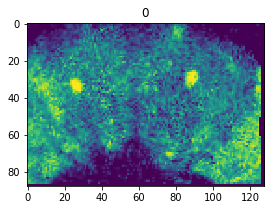

In [11]:
fig = plt.figure(figsize=[20,3])
for i in range(len(flies)):
    plt.subplot(1,len(flies),i+1)
    try:
        plt.imshow(flies[i].motcorr[:,:,20,0])
    except:
        pass
    plt.title(i)

### Add axis information

In [12]:
np.shape(flies[0].motcorr)

(88, 128, 55, 4006)

In [13]:
flies[0].x = np.shape(flies[0].motcorr)[1]
flies[0].y = np.shape(flies[0].motcorr)[0]
flies[0].z = np.shape(flies[0].motcorr)[2]
flies[0].t = np.shape(flies[0].motcorr)[3]

### Load imaging timestamps

In [9]:
for i, fly in enumerate(flies):
    print('Fly {} of {}. '.format(i+1, len(flies)))
    file = root_path+fly_folders[i]
    fly.timestamps = bruker_timestamps_import(file, 'functional.xml', False)

Fly 1 of 8. 
loading timestamp data from hdf5 file... done
Fly 2 of 8. 
loading timestamp data from hdf5 file... done
Fly 3 of 8. 
loading timestamp data from hdf5 file... done
Fly 4 of 8. 
loading timestamp data from hdf5 file... done
Fly 5 of 8. 
loading timestamp data from hdf5 file... done
Fly 6 of 8. 
loading timestamp data from hdf5 file... done
Fly 7 of 8. 
loading timestamp data from hdf5 file... done
Fly 8 of 8. 
loading timestamp data from hdf5 file... done


### Load fictrac data

In [29]:
for i, fly in enumerate(flies):
    print('Loading fictrac data from fly {} of {}'.format(i+1, len(flies)))
    with open(os.path.join(root_path,fly_folders[i],'fictrac.dat'),'r') as f:
        df = pd.DataFrame(l.rstrip().split() for l in f)
        
    # Name columns
    df = df.rename(index=str, columns={0: 'frameCounter',
                                   1: 'dRotCamX',
                                   2: 'dRotCamY',
                                   3: 'dRotCamZ',
                                   4: 'dRotScore',
                                   5: 'dRotLabX',
                                   6: 'dRotLabY',
                                   7: 'dRotLabZ',
                                   8: 'AbsRotCamX',
                                   9: 'AbsRotCamY',
                                   10: 'AbsRotCamZ',
                                   11: 'AbsRotLabX',
                                   12: 'AbsRotLabY',
                                   13: 'AbsRotLabZ',
                                   14: 'positionX',
                                   15: 'positionY',
                                   16: 'heading',
                                   17: 'runningDir',
                                   18: 'speed',
                                   19: 'integratedX',
                                   20: 'integratedY',
                                   21: 'timeStamp',
                                   22: 'sequence'})
    
    # Remove commas
    for column in df.columns.values[:-1]:
        df[column] = [float(x[:-1]) for x in df[column]]
        
    fly.fictrac = df

Loading fictrac data from fly 1 of 12
Loading fictrac data from fly 2 of 12
Loading fictrac data from fly 3 of 12
Loading fictrac data from fly 4 of 12
Loading fictrac data from fly 5 of 12
Loading fictrac data from fly 6 of 12
Loading fictrac data from fly 7 of 12
Loading fictrac data from fly 8 of 12
Loading fictrac data from fly 9 of 12
Loading fictrac data from fly 10 of 12
Loading fictrac data from fly 11 of 12
Loading fictrac data from fly 12 of 12


# Perform any preprocessing on data (bleaching correction, z-score, etc.)

### Note: remove accidental extra frames from brain_4

In [15]:
flies[3].fictrac = flies[3].fictrac[:90000]

### Remove slow trends voxel-wise (bleaching, etc)

In [16]:
brain_file = root_path+fly_folders[0]+'/smoothed_brain_over_time.nii'
smooth_brain = load_brain(brain_file).numpy()
smooth_brain = np.swapaxes(smooth_brain, 0, 1)

numpy_brain = flies[0].motcorr.numpy()
numpy_brain = numpy_brain - smooth_brain

In [17]:
numpy_brain = numpy_brain[:,:,:,200:]

### Remove first chunk of imaging data (always has some strangeness - ie large incease in f)

##### For now, lets just remove 200 frames

In [15]:
flies[0].motcorr = ants.from_numpy(flies[0].motcorr.numpy()[:,:,:,200:])

##### Remove from timestamps as well

In [18]:
flies[0].timestamps = flies[0].timestamps[200:,:]

##### Update axis info

In [17]:
flies[0].t = np.shape(flies[0].motcorr)[3]

In [90]:
flies[0].motcorr

ANTsImage
	 Pixel Type : float
	 Components : 1
	 Dimensions : (88, 128, 55, 3806)
	 Spacing    : (1.0, 1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]

### Perform bleaching correction

In [91]:
numpy_brain = flies[0].motcorr.numpy()

In [92]:
f_over_t = np.reshape(numpy_brain,(flies[0].x*flies[0].y*flies[0].z, flies[0].t)).mean(axis=0)

In [93]:
smoothed = scipy.ndimage.filters.gaussian_filter(f_over_t,200)

Text(0.5, 1.0, 'Bleaching correection, and first 200 frames removed')

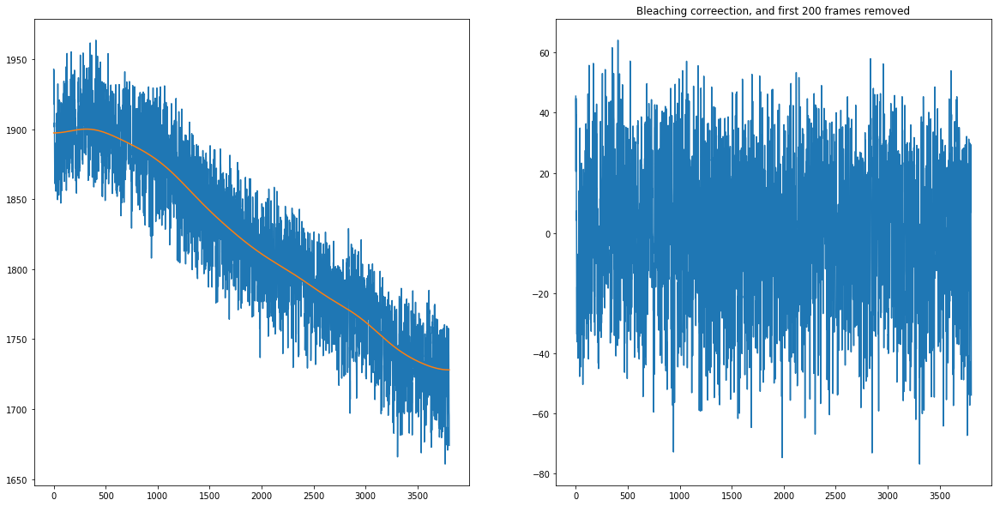

In [94]:
fig= plt.figure(figsize=(20,10))
plt.subplot(121)
plt.plot(f_over_t)
plt.plot(smoothed)
plt.subplot(122)
plt.plot(f_over_t-smoothed)
plt.title('Bleaching correection, and first 200 frames removed')

In [95]:
flies[0].motcorr = ants.from_numpy(flies[0].motcorr.numpy()-smoothed)

### For each voxel, subtract baseline and divide by stddev (sort of like z-scoring)

##### Define baseline based on average of all time points when fly was not walking. First find these times.

In [19]:
fictrac_sampling_rate = 20 # in ms
fps = 50
camera_rate = 1/fps * 1000 # camera frame rate in ms
dur = 30 * 60 * 1000 # experiment duration in ms
desired_fictrac_times = np.arange(0,dur,camera_rate)

In [20]:
# Smooth fictrac data
fictrac_smoothed = scipy.ndimage.filters.gaussian_filter(np.asarray(flies[0].fictrac['speed']),sigma=3)

# Find ball movement background
thresh = skimage.filters.threshold_triangle(fictrac_smoothed, nbins=256)

# Find movement onsets
min_walking_bout_duration = 1
under_thresh = np.where(fictrac_smoothed <= thresh)[0]
num_points = min_walking_bout_duration * 1000 / fictrac_sampling_rate
movement_onsets = under_thresh[np.where(np.diff(under_thresh) > num_points)[0]]
# Add 1 since needs to be first frame above thresh, and not the frame right before
movement_onsets = movement_onsets + 1 
movement_onset_times = desired_fictrac_times[movement_onsets]

# Find movement offsets
# For each movement onset, start at that time point looking for
# when movement drops below threshold
movement_offsets = []
for movement_onset in movement_onsets:
    #arg max will return index of first "True" after movement_onset index.
    movement_offset = np.argmax(fictrac_smoothed[movement_onset:] < thresh)
    movement_offset = movement_offset + movement_onset
    movement_offsets.append(movement_offset)
    
movement_offset_times = desired_fictrac_times[movement_offsets]

# Now we have the times when a walking bout starts and stops
# Next, for each imaging frame, need to check if it's timestamp falls within a walking bout
walking = []
for z in range(len(numpy_brain[0,0,:,0])):    
    walking_z = []
    for t in range(len(numpy_brain[0,0,0,:])):

        # Grab this timepoint and check if it is within a walking window
        timepoint = flies[0].timestamps[t,z]
        walking_bool = False # Default to false
        for i in range(len(movement_onset_times)):
            
            # Can only get in this if-statement if in walking window
            if movement_onset_times[i] <= timepoint <=movement_offset_times[i]:
                walking_bool = True
                break
        
        walking_z.append(walking_bool)
    walking.append(walking_z)
        
walking = np.asarray(walking)

Text(0.5, 1.0, 'Movement periods')

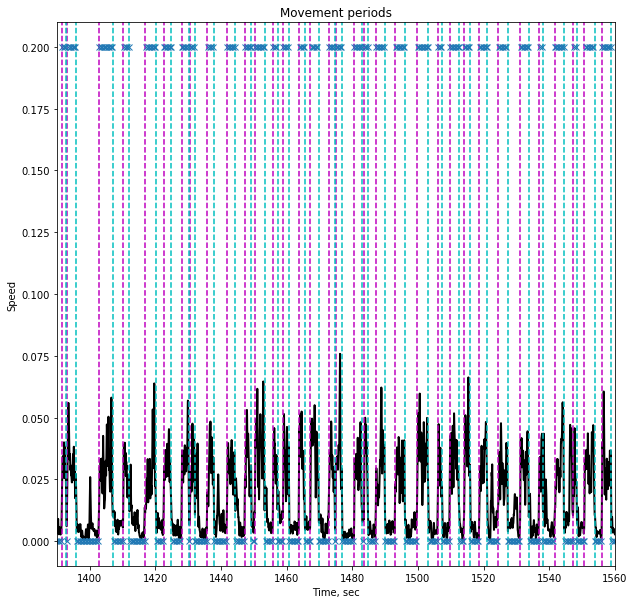

In [21]:
start = 1390
end = 1560
z = 31
plt.figure(figsize=(10,10))

plt.plot(desired_fictrac_times/1000, fictrac_smoothed, linewidth=2, color='k')

for movement_onset in movement_onset_times:
    plt.axvline(movement_onset/1000, color='m', linestyle='--')
    
for movement_offset in movement_offset_times:
    plt.axvline(movement_offset/1000, color='c', linestyle='--')

plt.plot(flies[0].timestamps[:,z]/1000, walking[z,:]/5, 'x')    

#plt.axhline(thresh, color='b', linestyle='--')
plt.xlabel('Time, sec')
plt.ylabel('Speed')
plt.xlim(start, end)
plt.title('Movement periods')

##### Calculate means during walking and during stationary

In [22]:
stationary_mean = []
stationary_data = []
for z in range(len(numpy_brain[0,0,:,0])):
    not_walking_frames = np.where(np.invert(walking[z,:]))
    frames = np.squeeze(numpy_brain[:,:,z,not_walking_frames])
    stationary_mean.append(np.mean(frames, 2))
    stationary_data.append(frames)
    
stationary_mean = np.asarray(stationary_mean)

walking_mean = []
for z in range(len(numpy_brain[0,0,:,0])):
    walking_frames = np.where((walking[z,:]))
    frames = np.squeeze(numpy_brain[:,:,z,walking_frames])
    walking_mean.append(np.mean(frames, 2))
    
walking_mean = np.asarray(walking_mean)

##### Calculate stddev of stationary brain

In [23]:
stationary_stddev = []
for z in range(len(numpy_brain[0,0,:,0])):
    stationary_stddev.append(np.std(stationary_data[z], axis = 2))
    
stationary_stddev = np.swapaxes(stationary_stddev, 0, 2)
stationary_stddev = np.swapaxes(stationary_stddev, 0, 1)

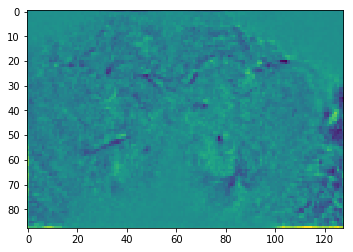

In [101]:
plt.imshow(walking_mean[31,:,:] - stationary_mean[31,:,:])

In [102]:
# Can save difference between the two states if desired.
# save_file = os.path.join(root_path, fly_folders[0], 'walkingMean_minus_stationaryMean.nii')
# brain_to_save = np.swapaxes(walking_mean - stationary_mean, 0, 2)
# ants.image_write(ants.from_numpy(brain_to_save), save_file)

##### Subtract this stationary baseline and divide by stddev

In [24]:
stationary_mean = np.swapaxes(stationary_mean, 0, 2)
stationary_mean = np.swapaxes(stationary_mean, 0, 1)

In [25]:
brain_sub = np.subtract(numpy_brain, stationary_mean[:,:,:,None])

In [26]:
brain_z = brain_sub / stationary_stddev[:,:,:,None]

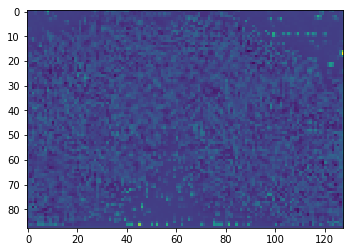

In [27]:
plt.imshow(brain_z[:,:,31,0])

In [29]:
brain_z.shape

(88, 128, 55, 3806)

In [30]:
# Can save brain_z if desired.
save_file = os.path.join(root_path, fly_folders[0], 'zscore_brain_movie.nii')
brain_to_save = np.swapaxes(brain_z, 0, 1)
ants.image_write(ants.from_numpy(brain_to_save), save_file)

### Can correct for long time-scale changes of each voxel

In [203]:
brain_z.shape

(88, 128, 55, 3806)

In [ ]:
smoothed = scipy.ndimage.gaussian_filter1d(brain_z,sigma=200,axis=3)

In [207]:
smoothed.shape

(88, 128, 55, 3806)

In [208]:
brain_z_s = brain_z - smoothed

In [209]:
plt.plot(brain_z_s[]

(88, 128, 55, 3806)

### Do spatial smoothing on raw data in x and y

In [ ]:
scipy.ndimage.gaussian_filter(input, sigma, mode='reflect', cval=0.0, truncate=4.0)

In [329]:
z_brain_smo = np.zeros(brain_z.shape)
for z in range(len(numpy_brain[0,0,:,0])):
    print(z)
    for t in range(len(numpy_brain[0,0,0,:])):
        z_brain_smo[:,:,z,t] = gaussian_filter(brain_z[:,:,z,t],sigma=1,mode='constant',cval=np.nan,truncate=1)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54


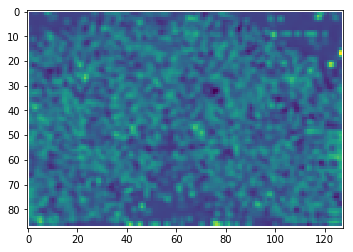

In [330]:
plt.imshow(z_brain_smo[:,:,31,0])

# Analysis type 1: Correlate voxel activity to fictrac outputs

##### Interpolate fictrac data to match imaging times

In [16]:
fps = 50
camera_rate = 1/fps * 1000 # camera frame rate in ms
dur = 30 * 60 * 1000 # experiment duration in ms
desired_fictrac_times = np.arange(0,dur,camera_rate)
# Warning: interp1d set to fill in out of bounds times

for i, fly in enumerate(flies):
    print('Interpolating fictrac data from fly {} of {}.'.format(i+1, len(flies)))
    #try:
    print(len(desired_fictrac_times), ' Should match next line.')
    print(len(fly.fictrac['speed']))
    fictrac_interp_temp = interp1d(desired_fictrac_times, fly.fictrac['speed'], bounds_error = False)
    fictrac_interp = fictrac_interp_temp(fly.timestamps)

    # Replace Nans with zeros (for later code)
    np.nan_to_num(fictrac_interp, copy=False);
    #except:
        #print('Try clause failed')
        #fictrac_interp = None
        
    fly.fictrac_interp = fictrac_interp

Interpolating fictrac data from fly 1 of 8
90000  Should match next line.
90000
Interpolating fictrac data from fly 2 of 8
90000  Should match next line.
90000
Interpolating fictrac data from fly 3 of 8
90000  Should match next line.
90000
Interpolating fictrac data from fly 4 of 8
90000  Should match next line.
90000
Interpolating fictrac data from fly 5 of 8
90000  Should match next line.
90000
Interpolating fictrac data from fly 6 of 8
90000  Should match next line.
90000
Interpolating fictrac data from fly 7 of 8
90000  Should match next line.
90000
Interpolating fictrac data from fly 8 of 8
90000  Should match next line.
90000


### Smooth fictrac data if desired

In [23]:
sigma = 3

for fly in flies:
    fly.fictrac_smooth = scipy.ndimage.filters.gaussian_filter(np.asarray(fly.fictrac_interp),sigma)

### Correlate each voxel

In [26]:
for i, fly in enumerate(flies):
    print('----- Running analysis on fly {} of {} -----'.format(i+1, len(flies)))
    fly.cor_brain = correlate_brain(fly.motcorr, fly.fictrac_smooth)

----- Running analysis on fly 1 of 8 -----
y: 88, x: 128, z: 55, t: 4006
flattening...
done flattening.
correlating...
Z-slice:  0
Shape of slice:  (11264, 4006)
Shape of fictrac data:  (4006,)
Z-slice:  1
Shape of slice:  (11264, 4006)
Shape of fictrac data:  (4006,)
Z-slice:  2
Shape of slice:  (11264, 4006)
Shape of fictrac data:  (4006,)
Z-slice:  3
Shape of slice:  (11264, 4006)
Shape of fictrac data:  (4006,)
Z-slice:  4
Shape of slice:  (11264, 4006)
Shape of fictrac data:  (4006,)
Z-slice:  5
Shape of slice:  (11264, 4006)
Shape of fictrac data:  (4006,)
Z-slice:  6
Shape of slice:  (11264, 4006)
Shape of fictrac data:  (4006,)
Z-slice:  7
Shape of slice:  (11264, 4006)
Shape of fictrac data:  (4006,)
Z-slice:  8
Shape of slice:  (11264, 4006)
Shape of fictrac data:  (4006,)
Z-slice:  9
Shape of slice:  (11264, 4006)
Shape of fictrac data:  (4006,)
Z-slice:  10
Shape of slice:  (11264, 4006)
Shape of fictrac data:  (4006,)
Z-slice:  11
Shape of slice:  (11264, 4006)
Shape of fi

Z-slice:  1
Shape of slice:  (11844, 3932)
Shape of fictrac data:  (3932,)
Z-slice:  2
Shape of slice:  (11844, 3932)
Shape of fictrac data:  (3932,)
Z-slice:  3
Shape of slice:  (11844, 3932)
Shape of fictrac data:  (3932,)
Z-slice:  4
Shape of slice:  (11844, 3932)
Shape of fictrac data:  (3932,)
Z-slice:  5
Shape of slice:  (11844, 3932)
Shape of fictrac data:  (3932,)
Z-slice:  6
Shape of slice:  (11844, 3932)
Shape of fictrac data:  (3932,)
Z-slice:  7
Shape of slice:  (11844, 3932)
Shape of fictrac data:  (3932,)
Z-slice:  8
Shape of slice:  (11844, 3932)
Shape of fictrac data:  (3932,)
Z-slice:  9
Shape of slice:  (11844, 3932)
Shape of fictrac data:  (3932,)
Z-slice:  10
Shape of slice:  (11844, 3932)
Shape of fictrac data:  (3932,)
Z-slice:  11
Shape of slice:  (11844, 3932)
Shape of fictrac data:  (3932,)
Z-slice:  12
Shape of slice:  (11844, 3932)
Shape of fictrac data:  (3932,)
Z-slice:  13
Shape of slice:  (11844, 3932)
Shape of fictrac data:  (3932,)
Z-slice:  14
Shape of

Z-slice:  7
Shape of slice:  (8385, 5805)
Shape of fictrac data:  (5805,)
Z-slice:  8
Shape of slice:  (8385, 5805)
Shape of fictrac data:  (5805,)
Z-slice:  9
Shape of slice:  (8385, 5805)
Shape of fictrac data:  (5805,)
Z-slice:  10
Shape of slice:  (8385, 5805)
Shape of fictrac data:  (5805,)
Z-slice:  11
Shape of slice:  (8385, 5805)
Shape of fictrac data:  (5805,)
Z-slice:  12
Shape of slice:  (8385, 5805)
Shape of fictrac data:  (5805,)
Z-slice:  13
Shape of slice:  (8385, 5805)
Shape of fictrac data:  (5805,)
Z-slice:  14
Shape of slice:  (8385, 5805)
Shape of fictrac data:  (5805,)
Z-slice:  15
Shape of slice:  (8385, 5805)
Shape of fictrac data:  (5805,)
Z-slice:  16
Shape of slice:  (8385, 5805)
Shape of fictrac data:  (5805,)
Z-slice:  17
Shape of slice:  (8385, 5805)
Shape of fictrac data:  (5805,)
Z-slice:  18
Shape of slice:  (8385, 5805)
Shape of fictrac data:  (5805,)
Z-slice:  19
Shape of slice:  (8385, 5805)
Shape of fictrac data:  (5805,)
Z-slice:  20
Shape of slice:

Z-slice:  16
Shape of slice:  (10578, 4159)
Shape of fictrac data:  (4159,)
Z-slice:  17
Shape of slice:  (10578, 4159)
Shape of fictrac data:  (4159,)
Z-slice:  18
Shape of slice:  (10578, 4159)
Shape of fictrac data:  (4159,)
Z-slice:  19
Shape of slice:  (10578, 4159)
Shape of fictrac data:  (4159,)
Z-slice:  20
Shape of slice:  (10578, 4159)
Shape of fictrac data:  (4159,)
Z-slice:  21
Shape of slice:  (10578, 4159)
Shape of fictrac data:  (4159,)
Z-slice:  22
Shape of slice:  (10578, 4159)
Shape of fictrac data:  (4159,)
Z-slice:  23
Shape of slice:  (10578, 4159)
Shape of fictrac data:  (4159,)
Z-slice:  24
Shape of slice:  (10578, 4159)
Shape of fictrac data:  (4159,)
Z-slice:  25
Shape of slice:  (10578, 4159)
Shape of fictrac data:  (4159,)
Z-slice:  26
Shape of slice:  (10578, 4159)
Shape of fictrac data:  (4159,)
Z-slice:  27
Shape of slice:  (10578, 4159)
Shape of fictrac data:  (4159,)
Z-slice:  28
Shape of slice:  (10578, 4159)
Shape of fictrac data:  (4159,)
Z-slice:  29

In [28]:
flies[0].cor_brain.shape

(55, 88, 128)

### May need to swap axes? Z should be last axis

In [29]:
for i, fly in enumerate(flies):
    print(i)
    try:
        fly.cor_brain = np.swapaxes(fly.cor_brain, 0, 2)
    except:
        print('Try clause failed')

0
1
2
3
4
Try clause failed
5
6
7


### Save correlation brains

In [30]:
for i, fly in enumerate(flies):
    print('Saving file {} of {}'.format(i+1, len(flies)))
    try:
        save_file = os.path.join(root_path, fly_folders[i], 'speed_correlation_smooth.nii')
        ants.image_write(ants.from_numpy(fly.cor_brain), save_file)
    except:
        print('Try clause failed')

Saving file 1 of 8
Saving file 2 of 8
Saving file 3 of 8
Saving file 4 of 8
Saving file 5 of 8
Try clause failed
Saving file 6 of 8
Saving file 7 of 8
Saving file 8 of 8


# Bonus section - check out fictrac data

### Can look at all the trajectories separately, scaled to themselves

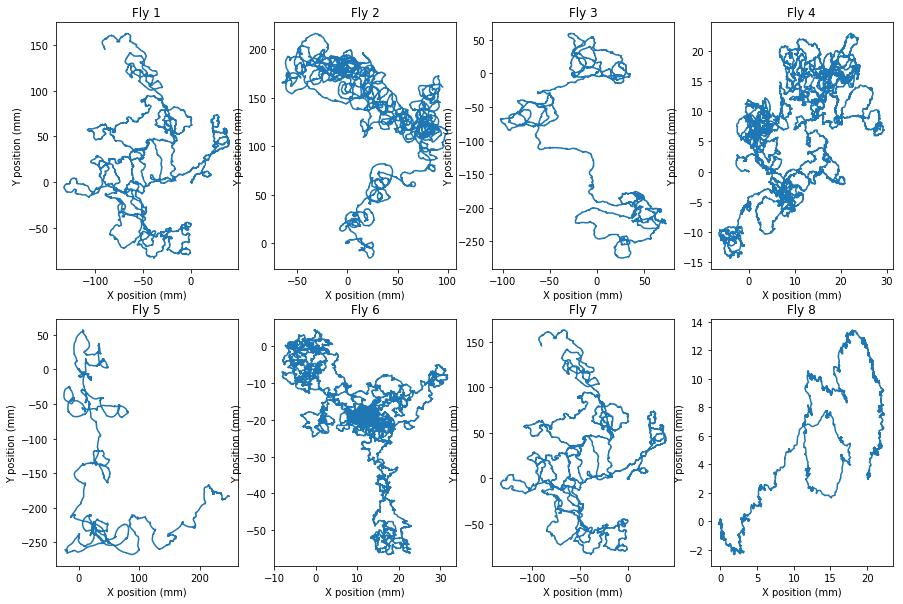

In [11]:
sphere_radius = 4.5e-3
plt.figure(figsize=(15,15))

for i in range(len(flies)):
    plt.subplot(3,4,i+1)
    plt.plot(flies[i].fictrac['positionX']*sphere_radius*1000, flies[i].fictrac['positionY']*sphere_radius*1000)
    #plt.xlim(-10,45)
    #plt.ylim(-40,15)
    plt.xlabel('X position (mm)')
    plt.ylabel('Y position (mm)')
    plt.title('Fly {}'.format(i+1))
    #plt.savefig('myimage300.png', format='png', dpi=300)

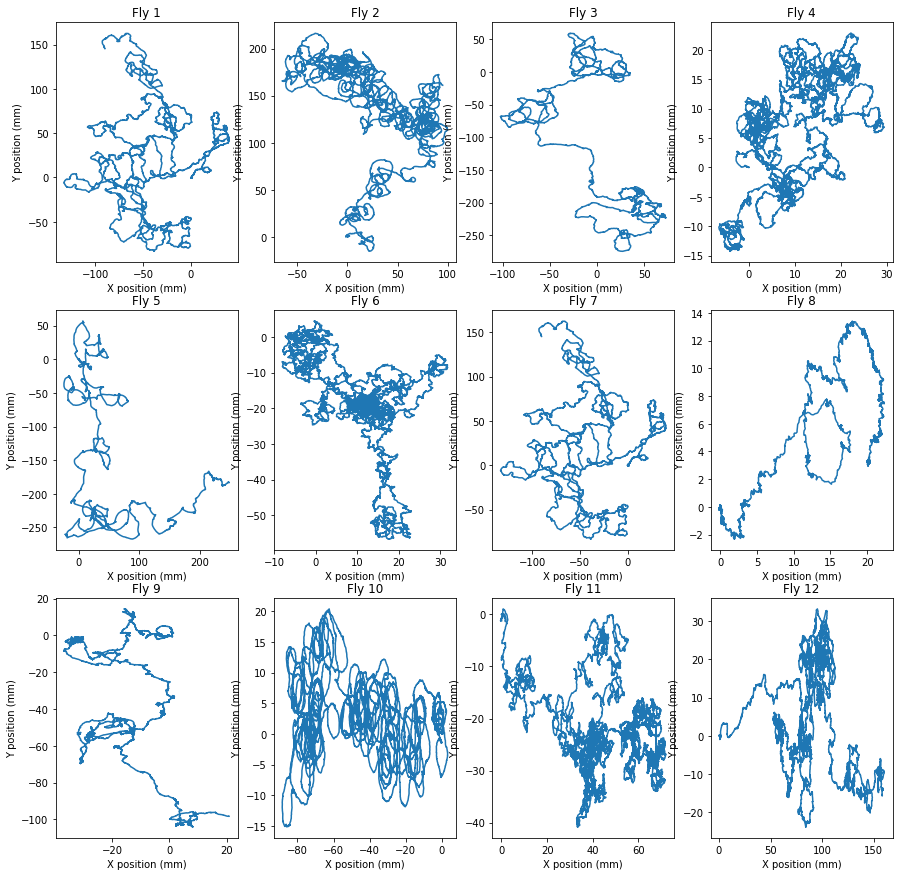

In [30]:
sphere_radius = 4.5e-3
plt.figure(figsize=(15,15))

for i in range(len(flies)):
    plt.subplot(3,4,i+1)
    plt.plot(flies[i].fictrac['positionX']*sphere_radius*1000, flies[i].fictrac['positionY']*sphere_radius*1000)
    #plt.xlim(-10,45)
    #plt.ylim(-40,15)
    plt.xlabel('X position (mm)')
    plt.ylabel('Y position (mm)')
    plt.title('Fly {}'.format(i+1))
    #plt.savefig('myimage300.png', format='png', dpi=300)

### Can look at all the trajectories separately, scaled to largest

In [ ]:
sphere_radius = 4.5e-3
plt.figure(figsize=(15,10))

for i in range(len(flies)):
    plt.subplot(2,4,i+1)
    plt.plot(flies[i].fictrac['positionX']*sphere_radius*1000, flies[i].fictrac['positionY']*sphere_radius*1000)
    plt.xlim(-150,250)
    plt.ylim(-300,200)
    plt.xlabel('X position (mm)')
    plt.ylabel('Y position (mm)')
    plt.title('Fly {}'.format(i+1))
    #plt.savefig('myimage300.png', format='png', dpi=300)

### Can look at all the trajectories together

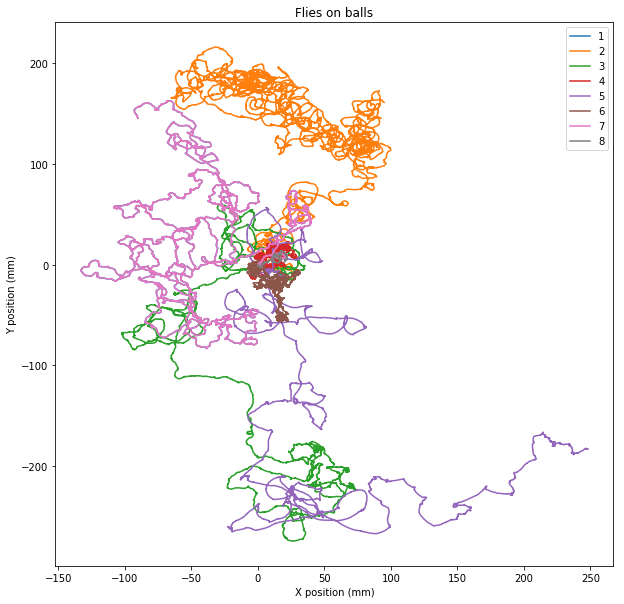

In [19]:
sphere_radius = 4.5e-3
plt.figure(figsize=(10,10))

for i in range(len(flies)):
    plt.plot(flies[i].fictrac['positionX']*sphere_radius*1000, flies[i].fictrac['positionY']*sphere_radius*1000, label = i+1)
    #plt.xlim(-10,45)
    #plt.ylim(-40,15)
    plt.xlabel('X position (mm)')
    plt.ylabel('Y position (mm)')
    plt.legend()
    plt.title('Flies on balls')
    #plt.savefig('myimage300.png', format='png', dpi=300)

### Get useful fictrac parameters

In [55]:
for fly in flies:
    fly.dist_traveled = np.sum(np.abs(np.diff(fly.fictrac['positionX']))) + np.sum(np.abs(np.diff(fly.fictrac['positionY'])))
    fly.integrated_rot = np.sum(np.abs(fly.fictrac['dRotLabZ']))

In [56]:
distances = []
for fly in flies:
    distances.append(fly.dist_traveled)
    
rotations = []
for fly in flies:
    rotations.append(fly.integrated_rot)

<BarContainer object of 8 artists>

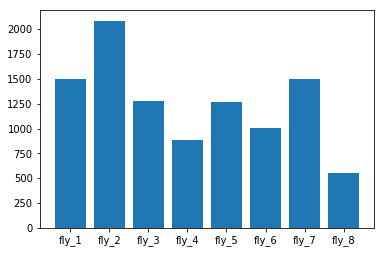

In [57]:
plt.bar(fly_folders, distances)

<BarContainer object of 8 artists>

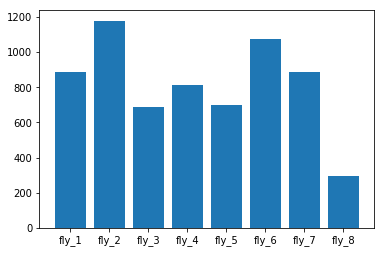

In [54]:
plt.bar(fly_folders, rotations)

# Analysis type 2: Behavior-triggered neural alignment

### Fictrac - defining movement onsets

In [ ]:
# note: speed is in radians per frame
# to convert to mm per second, 0.020sec/frame
sphere_radius = 4.5e-3

flies[0].fictrac['speed']

In [24]:
smoothed = scipy.ndimage.filters.gaussian_filter(np.asarray(flies[0].fictrac['speed']),sigma=3)

##### What is an easy first metric to try? Transition from stopped to start.

In [25]:
thresh = skimage.filters.threshold_triangle(smoothed, nbins=256)

Text(0.5, 0, 'Ball Velocity')

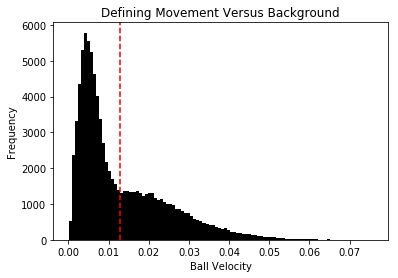

In [166]:
plt.hist(smoothed, bins=100, color='k');
plt.axvline(thresh, color='r', linestyle='--')
plt.title('Defining Movement Versus Background')
plt.ylabel('Frequency')
plt.xlabel('Ball Velocity')

In [27]:
fps = 50
camera_rate = 1/fps * 1000 # camera frame rate in ms
dur = 30 * 60 * 1000 # experiment duration in ms
desired_fictrac_times = np.arange(0,dur,camera_rate)

In [28]:
min_walking_bout_duration = 1 #in sec
sampling_rate = 20 # in ms

under_thresh = np.where(smoothed<thresh)[0]
num_points = min_walking_bout_duration*1000/sampling_rate
movement_onset = under_thresh[np.where(np.diff(under_thresh)>num_points)[0]]
movement_times = desired_fictrac_times[movement_onset]

### Now that we have timepoints of walking initiation - use as alignment for neural activity

In [109]:
brain_file = root_path+fly_folders[0]+'/motcorr.nii'
vol = load_brain(brain_file)

In [110]:
for i, fly in enumerate(flies):
    file = root_path+fly_folders[i]
    fly.timestamps = bruker_timestamps_import(file, 'functional.xml', True)

extracting frame timestamps from bruker xml file... done
saving timestamp data as hdf5 file... done
extracting frame timestamps from bruker xml file... done
saving timestamp data as hdf5 file... done
extracting frame timestamps from bruker xml file... done
saving timestamp data as hdf5 file... done
extracting frame timestamps from bruker xml file... done
saving timestamp data as hdf5 file... done
extracting frame timestamps from bruker xml file... done
saving timestamp data as hdf5 file... done
extracting frame timestamps from bruker xml file... done
saving timestamp data as hdf5 file... done
extracting frame timestamps from bruker xml file... done
saving timestamp data as hdf5 file... done
extracting frame timestamps from bruker xml file... done
saving timestamp data as hdf5 file... done


In [115]:
timestamps = flies[0].timestamps
np.shape(timestamps)

(4006, 55)

##### For each z-slice, I have a list of timepoints. I also have a list of times of walking initiation. For each walking initiation time, take the z timepoints within some time range before and after

In [116]:
numpy_brain = vol.numpy()

In [59]:
3

3

##### Let's look at a voxel that should have activity (based on correlation analysis)

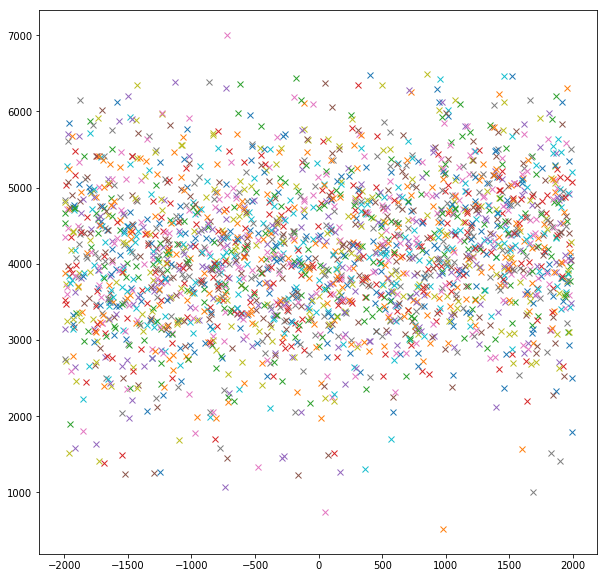

In [125]:
x = 49
y = 30
z = 24
plt.figure(figsize=(10,10))

for frame in useful_frames:
    if frame['slice'] == z:
        voxel = numpy_brain[y,x,z,frame['frame']]
        delay = frame['delay']
        plt.plot(delay, voxel, 'x')

In [108]:
numpy_brain.shape

(88, 128, 55, 3806)

In [118]:
useful_frames

[{'delay': 810.7468800000061, 'frame': 0, 'slice': 0},
 {'delay': 1260.1465600000083, 'frame': 1, 'slice': 0},
 {'delay': 1709.546239999996, 'frame': 2, 'slice': 0},
 {'delay': 816.9030400000047, 'frame': 0, 'slice': 1},
 {'delay': 1266.302720000007, 'frame': 1, 'slice': 1},
 {'delay': 1715.7024000000092, 'frame': 2, 'slice': 1},
 {'delay': 823.0591999999888, 'frame': 0, 'slice': 2},
 {'delay': 1272.458879999991, 'frame': 1, 'slice': 2},
 {'delay': 1721.8585599999933, 'frame': 2, 'slice': 2},
 {'delay': 829.215360000002, 'frame': 0, 'slice': 3},
 {'delay': 1278.6150400000042, 'frame': 1, 'slice': 3},
 {'delay': 1728.014719999992, 'frame': 2, 'slice': 3},
 {'delay': 835.3715200000006, 'frame': 0, 'slice': 4},
 {'delay': 1284.7712000000029, 'frame': 1, 'slice': 4},
 {'delay': 1734.1708800000051, 'frame': 2, 'slice': 4},
 {'delay': 841.5276799999992, 'frame': 0, 'slice': 5},
 {'delay': 1290.9273600000015, 'frame': 1, 'slice': 5},
 {'delay': 1740.3270400000038, 'frame': 2, 'slice': 5},
 {'

In [ ]:
x = 71
y = 42
z = 11
plt.figure(figsize=(10,10))
voxels = []
delays = []

for frame in useful_frames:
    if frame['slice'] == z:
        voxel = numpy_brain[y,x,z,frame['frame']]
        voxels.append(voxel)
        delay = frame['delay']
        delays.append(delay)
        plt.plot(delay, voxel, color='k', marker='x')
        
means, centers = single_moving_avg(voxels, delays)
#means_smoothed = scipy.ndimage.filters.gaussian_filter1d(means, sigma=1)
plt.plot(centers, means, color='r', linewidth=2)

In [125]:
means, centers = single_moving_avg(voxels[:100], delays[:100])

/share/software/user/open/py-numpy/1.14.3_py36/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning:

Mean of empty slice.

/share/software/user/open/py-numpy/1.14.3_py36/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning:

invalid value encountered in double_scalars



In [182]:
def calc_event_triggered_delays(numpy_brain,
                                movement_times,
                                timestamps,
                                search_before=10000,
                                search_after=10000):
    
    useful_frames = []

    # For each movement time, find brain slices that occur near in time
    for i, movement_time in enumerate(movement_times):
        events = []
        print('{} of {}. '.format(i+1, len(movement_times)), end='')
        # Define what time range to look across
        search_start = movement_time - search_before
        search_end = movement_time + search_after

        # Look at each z-slice
        for z in range(len(numpy_brain[0,0,:,0])):

            # Get times of the current slice
            slice_times = timestamps[:,z]

            # Find slices near current movement time
            for f, slice_time in enumerate(slice_times):
                if search_start <= slice_time <= search_end:

                    # Calculate delay
                    delay = slice_time - movement_time

                    # Save the index of the found slice, along with it's delay relative to movement
                    events.append({'slice': z, 'frame': f, 'delay': delay})
        useful_frames.append(events)
    return useful_frames

In [183]:
useful_frames_per_movement = calc_event_triggered_delays(numpy_brain, movement_times, fly.timestamps)

1 of 248. 2 of 248. 3 of 248. 4 of 248. 5 of 248. 6 of 248. 7 of 248. 8 of 248. 9 of 248. 10 of 248. 11 of 248. 12 of 248. 13 of 248. 14 of 248. 15 of 248. 16 of 248. 17 of 248. 18 of 248. 19 of 248. 20 of 248. 21 of 248. 22 of 248. 23 of 248. 24 of 248. 25 of 248. 26 of 248. 27 of 248. 28 of 248. 29 of 248. 30 of 248. 31 of 248. 32 of 248. 33 of 248. 34 of 248. 35 of 248. 36 of 248. 37 of 248. 38 of 248. 39 of 248. 40 of 248. 41 of 248. 42 of 248. 43 of 248. 44 of 248. 45 of 248. 46 of 248. 47 of 248. 48 of 248. 49 of 248. 50 of 248. 51 of 248. 52 of 248. 53 of 248. 54 of 248. 55 of 248. 56 of 248. 57 of 248. 58 of 248. 59 of 248. 60 of 248. 61 of 248. 62 of 248. 63 of 248. 64 of 248. 65 of 248. 66 of 248. 67 of 248. 68 of 248. 69 of 248. 70 of 248. 71 of 248. 72 of 248. 73 of 248. 74 of 248. 75 of 248. 76 of 248. 77 of 248. 78 of 248. 79 of 248. 80 of 248. 81 of 248. 82 of 248. 83 of 248. 84 of 248. 85 of 248. 86 of 248. 87 of 248. 88 of 248. 89 of 248. 90 of 248. 91 of 248. 92 of 24

In [187]:
useful_frames_per_movement[10]

[{'delay': -9804.19968000002, 'frame': 458, 'slice': 0},
 {'delay': -9354.799999999988, 'frame': 459, 'slice': 0},
 {'delay': -8905.400320000015, 'frame': 460, 'slice': 0},
 {'delay': -8456.000639999984, 'frame': 461, 'slice': 0},
 {'delay': -8006.600960000011, 'frame': 462, 'slice': 0},
 {'delay': -7557.2012800000375, 'frame': 463, 'slice': 0},
 {'delay': -7107.801600000006, 'frame': 464, 'slice': 0},
 {'delay': -6658.401920000033, 'frame': 465, 'slice': 0},
 {'delay': -6209.002240000002, 'frame': 466, 'slice': 0},
 {'delay': -5759.6025600000285, 'frame': 467, 'slice': 0},
 {'delay': -5310.202879999997, 'frame': 468, 'slice': 0},
 {'delay': -4860.803200000024, 'frame': 469, 'slice': 0},
 {'delay': -4411.403519999993, 'frame': 470, 'slice': 0},
 {'delay': -3962.0038400000194, 'frame': 471, 'slice': 0},
 {'delay': -3512.6041600000462, 'frame': 472, 'slice': 0},
 {'delay': -3063.204480000015, 'frame': 473, 'slice': 0},
 {'delay': -2613.8048000000417, 'frame': 474, 'slice': 0},
 {'delay':

In [ ]:
# Try subtracting mean of every single movement event individually
# Next, could also try diving by stddev of each event

In [188]:
z

11

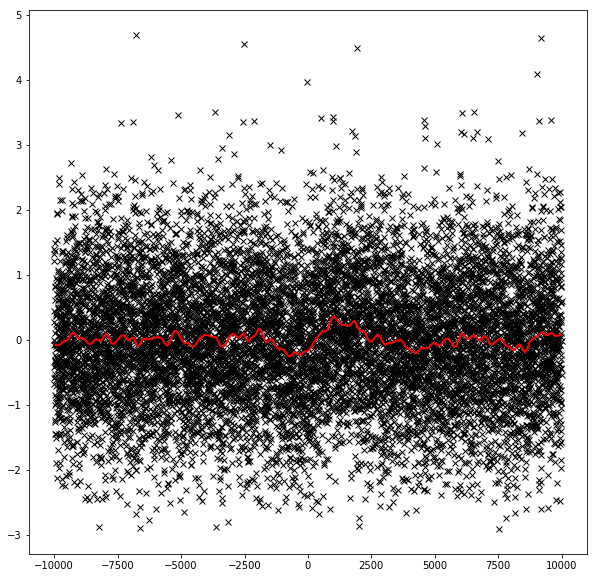

In [222]:
plt.figure(figsize=(10,10))
voxels_all = []
delays_all = []
for i in range(248):
    current_frames = useful_frames_per_movement[i]
    voxels = []
    delays = []
    for frame in current_frames:
        if frame['slice'] == z:
            voxel = brain_z_s[y,x,z,frame['frame']]
            voxels.append(voxel)
            delay = frame['delay']
            delays.append(delay)
    voxels_corrected = voxels - np.mean(voxels)
    plt.plot(delays, voxels_corrected, color='k',marker='x',linewidth=0)
    voxels_all.append(voxels_corrected)
    delays_all.append(delays)

voxels_all = [item for sublist in voxels_all for item in sublist]
delays_all = [item for sublist in delays_all for item in sublist]
means, centers = single_moving_avg(voxels_all, delays_all)
means_smoothed = scipy.ndimage.filters.gaussian_filter1d(means, sigma=1)
plt.plot(centers, means_smoothed, color='r', linewidth=2)

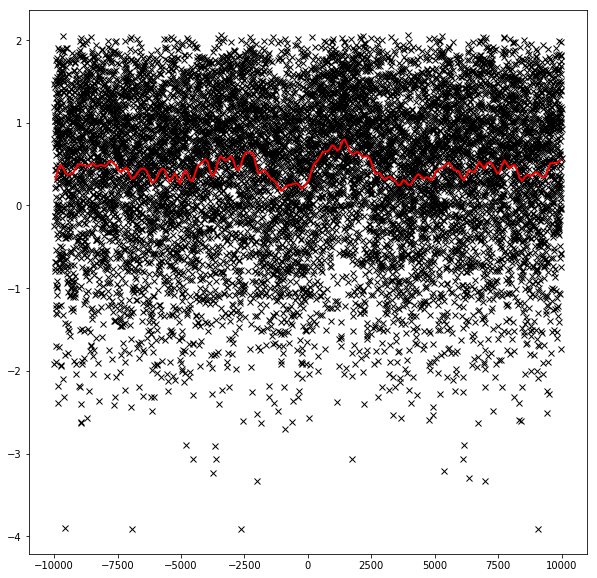

In [194]:
plt.figure(figsize=(10,10))
voxels_all = []
delays_all = []
for i in range(248):
    current_frames = useful_frames_per_movement[i]
    voxels = []
    delays = []
    for frame in current_frames:
        if frame['slice'] == z:
            voxel = numpy_brain[y,x,z,frame['frame']]
            voxels.append(voxel)
            delay = frame['delay']
            delays.append(delay)
    plt.plot(delays, voxels, color='k',marker='x',linewidth=0)
    voxels_all.append(voxels)
    delays_all.append(delays)

voxels_all = [item for sublist in voxels_all for item in sublist]
delays_all = [item for sublist in delays_all for item in sublist]
means, centers = single_moving_avg(voxels_all, delays_all)
means_smoothed = scipy.ndimage.filters.gaussian_filter1d(means, sigma=1)
plt.plot(centers, means_smoothed, color='r', linewidth=2)

In [18]:
3

3

In [19]:
numpy_brain = flies[0].motcorr.numpy()

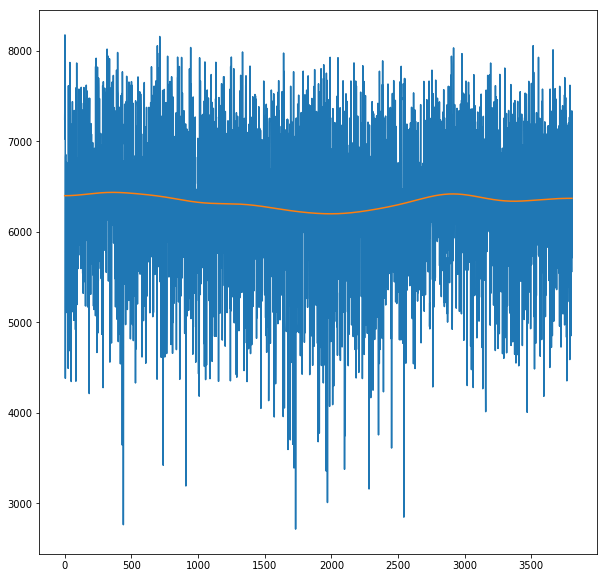

In [71]:
x = 62
y = 34
z = 13
smo2 = gaussian_filter(numpy_brain[y,x,z,:],200)

plt.figure(figsize=(10,10))
plt.plot(numpy_brain[y,x,z,:])
plt.plot(smo2)

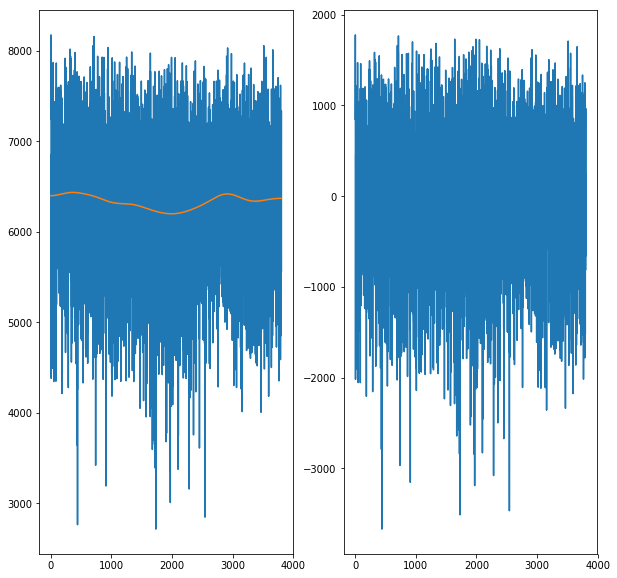

In [75]:
x = 62
y = 34
z = 13
smo2 = gaussian_filter(numpy_brain[y,x,z,:],200)

plt.figure(figsize=(10,10))
plt.subplot(121)
plt.plot(numpy_brain[y,x,z,:])
plt.plot(smo2)

plt.subplot(122)
plt.plot(numpy_brain[y,x,z,:]-smo2)

In [34]:
means = []
for z in range(np.shape(numpy_brain)[2]):
    for t in range(np.shape(numpy_brain)[3]):
        means.append(np.mean(numpy_brain[:,:,z,t]))

In [37]:
means2 = np.reshape(means, (np.shape(numpy_brain)[2], np.shape(numpy_brain)[3]))

In [38]:
np.shape(means2)

(55, 3806)

No handles with labels found to put in legend.


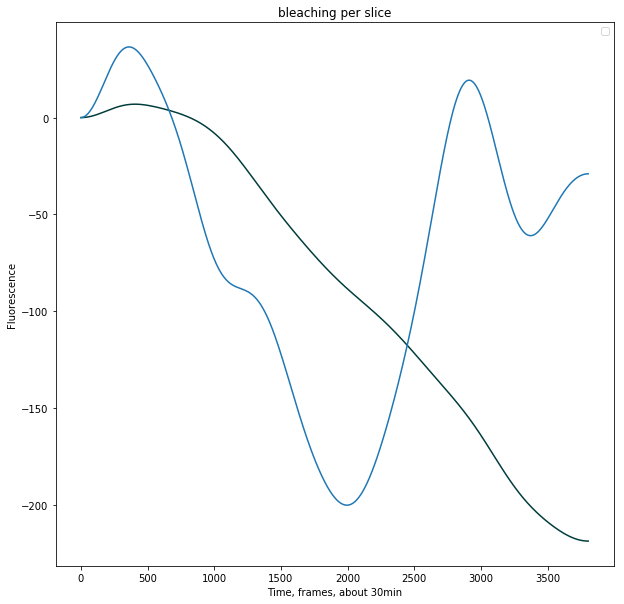

In [73]:
plt.figure(figsize=(10,10))
zs = 55
for i in [13]:
    smo = gaussian_filter(means2[i,:],200)
    if i%5 == 0:
        plt.plot(smo-smo[0], color = [0,i/zs,i/zs], label='slice {}'.format(i))
    else:
        plt.plot(smo-smo[0], color = [0,i/zs,i/zs])
    #plt.ylim(-300,300)
    plt.plot(smo2-smo2[0])
    plt.title('bleaching per slice')
    plt.xlabel('Time, frames, about 30min')
    plt.ylabel('Fluorescence')
    plt.legend()

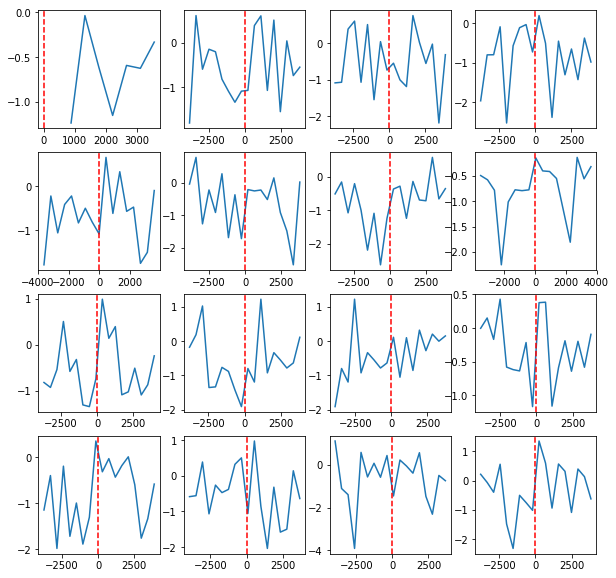

In [153]:
plt.figure(figsize=(10,10))
for i in range(16):
    plt.subplot(4,4,i+1)
    current_frames = useful_frames_per_movement[i]
    voxels = []
    delays = []
    for frame in current_frames:
        if frame['slice'] == z:
            voxel = numpy_brain[y,x,z,frame['frame']]
            voxels.append(voxel)
            delay = frame['delay']
            delays.append(delay)
    plt.plot(delays, voxels)
    plt.axvline(0, color='r', linestyle='--')

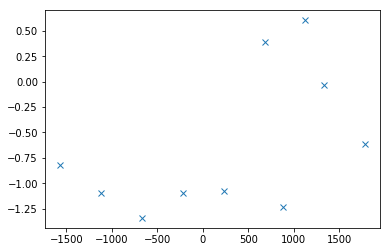

In [132]:
plt.plot(delays[:10], voxels[:10], 'x')
#plt.plot(centers, means)

/share/software/user/open/py-numpy/1.14.3_py36/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning:

Mean of empty slice.

/share/software/user/open/py-numpy/1.14.3_py36/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning:

invalid value encountered in double_scalars



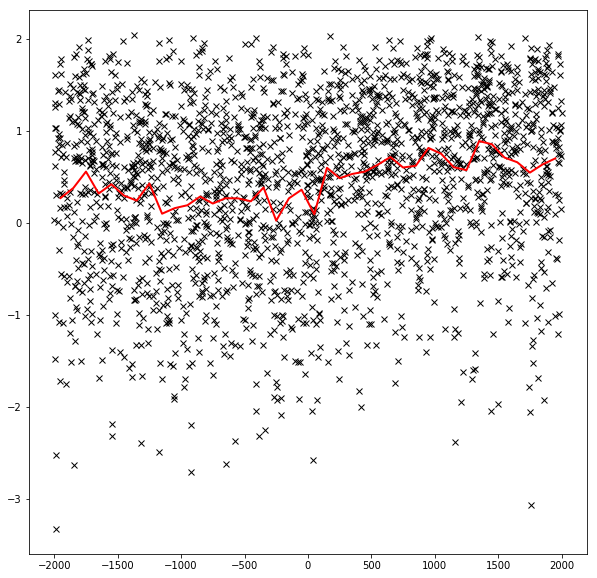

In [173]:
x = 71
y = 42
z = 11
plt.figure(figsize=(10,10))
voxels = []
delays = []

for frame in useful_frames:
    if frame['slice'] == z:
        voxel = numpy_brain[y,x,z,frame['frame']]
        voxels.append(voxel)
        delay = frame['delay']
        delays.append(delay)
        plt.plot(delay, voxel, color='k', marker='x')
        
means, centers = single_moving_avg(voxels, delays)
#means_smoothed = scipy.ndimage.filters.gaussian_filter1d(means, sigma=1)
plt.plot(centers, means, color='r', linewidth=2)

In [46]:
smo = gaussian_filter(numpy_brain[y,x,z,:],200)
voxel_corrected = numpy_brain[y,x,z,:]-smo

In [56]:

voxels = []
delays = []
#voxel_mean = np.mean(numpy_brain[y,x,z,:])
for frame in useful_frames:
    if frame['slice'] == z:
        voxel = voxel_corrected[frame['frame']]
        voxels.append(voxel)
        delay = frame['delay']
        delays.append(delay)
        #plt.plot(delay, voxel, color='k', marker='x')
        
#means, centers = single_moving_avg(voxels, delays, start=-10000, stop=10000, step=100)
#means_smoothed = scipy.ndimage.filters.gaussian_filter1d(means, sigma=1)
#plt.plot(centers, means, color='r', linewidth=2)

In [57]:
means, centers = single_moving_avg(voxels, delays, start=-10000, stop=10000, step=100)

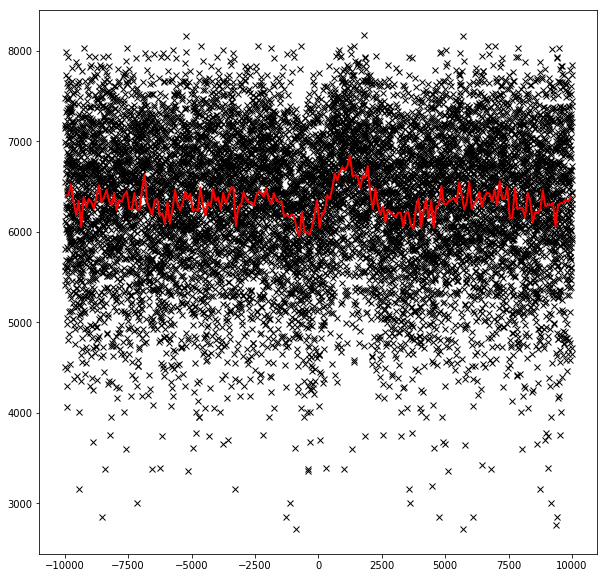

In [32]:
x = 62
y = 34
z = 13
plt.figure(figsize=(10,10))
voxels = []
delays = []
#voxel_mean = np.mean(numpy_brain[y,x,z,:])
for frame in useful_frames:
    if frame['slice'] == z:
        voxel = numpy_brain[y,x,z,frame['frame']]
        voxels.append(voxel)
        delay = frame['delay']
        delays.append(delay)
        #plt.plot(delay, voxel, color='k', marker='x')
        
#means, centers = single_moving_avg(voxels, delays, start=-10000, stop=10000, step=100)
#means_smoothed = scipy.ndimage.filters.gaussian_filter1d(means, sigma=1)
#plt.plot(centers, means, color='r', linewidth=2)

Text(0, 0.5, 'df/f')

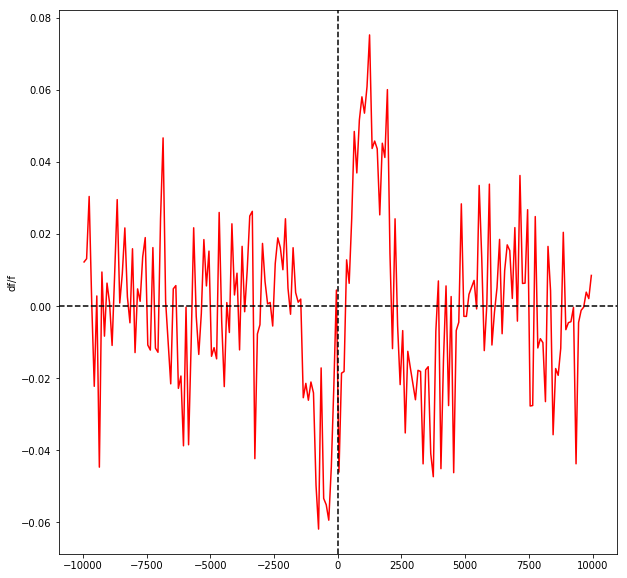

In [45]:
plt.figure(figsize=(10,10))
plt.plot(centers,dff,color='r')
plt.axhline(0, color='k', linestyle='--')
plt.axvline(0, color='k', linestyle='--')
plt.ylabel('df/f')

In [53]:
dff = (means-voxel_mean)/means

In [43]:
np.mean(dff[:50])

0.00061662635

In [41]:
len(dff)

200

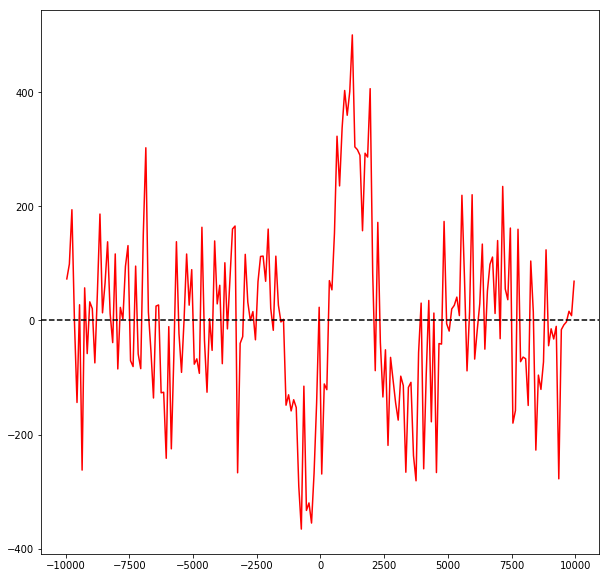

In [58]:
plt.figure(figsize=(10,10))
plt.plot(centers,means,color='r')
plt.axhline(0, color='k', linestyle='--')

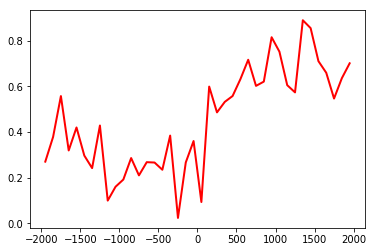

In [117]:
plt.plot(centers, means, color='r', linewidth=2)

/share/software/user/open/py-numpy/1.14.3_py36/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning:

Mean of empty slice.

/share/software/user/open/py-numpy/1.14.3_py36/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning:

invalid value encountered in double_scalars



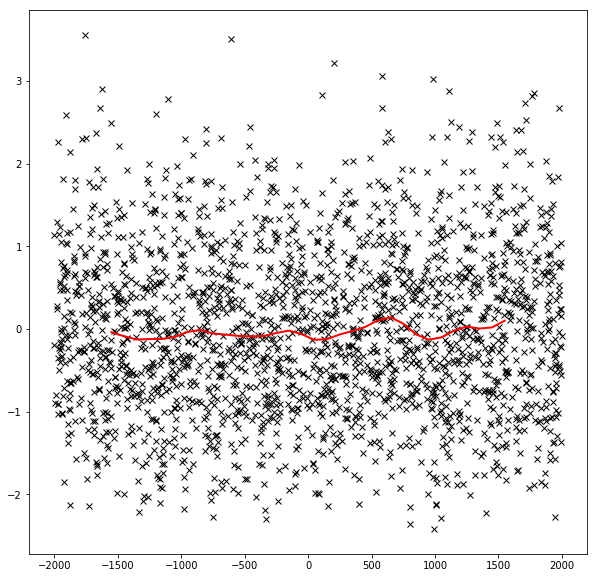

In [633]:
x=35
y=44
z=30
plt.figure(figsize=(10,10))
voxels = []
delays = []

for frame in useful_frames:
    if frame['slice'] == z:
        voxel = numpy_brain[y,x,z,frame['frame']]
        voxels.append(voxel)
        delay = frame['delay']
        delays.append(delay)
        plt.plot(delay, voxel, color='k', marker='x')
        
means, centers = single_moving_avg(voxels, delays)
means_smoothed = scipy.ndimage.filters.gaussian_filter1d(means, sigma=1)
plt.plot(centers, means_smoothed, color='r', linewidth=2)

In [193]:
def single_moving_avg(voxels, delays, start=-10000, stop=10000, step=100):
    means = []
    centers = []
    for window in range(int((stop - start) / step)):
        window_start = start + window * step
        window_end = window_start + step
        center = window_start + (step / 2)
        centers.append(center)
        above = np.asarray([delay > window_start for delay in delays])
        below = np.asarray([delay < window_end for delay in delays])
        indicies = np.where(above & below)[0]
        mean = np.mean([voxels[index] for index in indicies])
        means.append(mean)
    return means, centers

In [210]:
t = time()
means, centers = single_moving_avg(voxels, delays)
print(time()-t)

0.04215860366821289


In [59]:
numpy_brain.shape

(88, 128, 55, 4006)

In [63]:
slice_31 = numpy_brain[:,:,31,:]

In [64]:
slice_31.shape

(88, 128, 4006)

In [65]:
z=31

slice_smoothed = gaussian_filter(slice_31, axis = 2, sigma =200)

TypeError: gaussian_filter() got an unexpected keyword argument 'axis'

In [86]:
numpy_brain.shape

(88, 128, 55, 4006)

In [87]:
smoothed_brain = scipy.ndimage.filters.gaussian_filter1d(numpy_brain, sigma=200, axis=3)

In [89]:
smoothed_brain.shape

(88, 128, 55, 4006)

In [90]:
save_file = os.path.join(root_path, fly_folders[0], 'smoothed_brain_over_time.nii')
brain_to_save = np.swapaxes(smoothed_brain, 0, 1)
ants.image_write(ants.from_numpy(brain_to_save), save_file)

In [69]:
slice_smoothed_zero = slice_smoothed - np.tile(slice_smoothed[:,:,0,None], (1,1,4006))

In [71]:
slice_smoothed_zero.shape

(88, 128, 4006)

IndexError: list index out of range

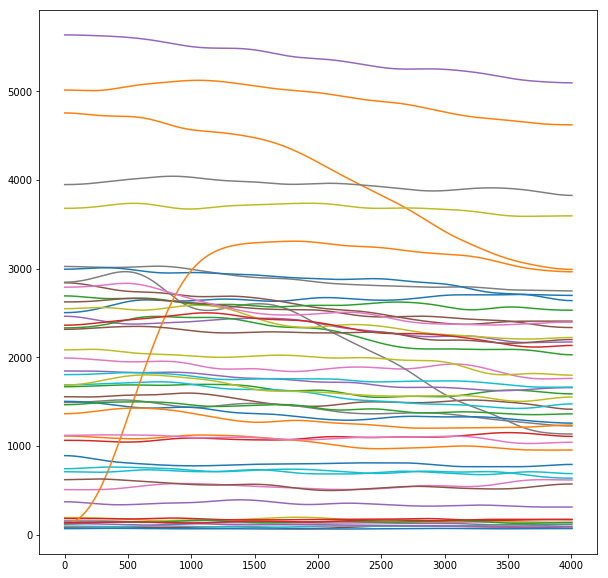

In [82]:
plt.figure(figsize=(10,10))
xs = random.sample(range(1, 128), 50)
ys = random.sample(range(1, 88), 50)

for i in range(100):
    plt.plot(slice_smoothed[ys[i],xs[i],:])

In [75]:
import random

In [77]:
xs

[26, 70, 74]

##### Ok, now that we have some sense of a single voxel, lets do them all

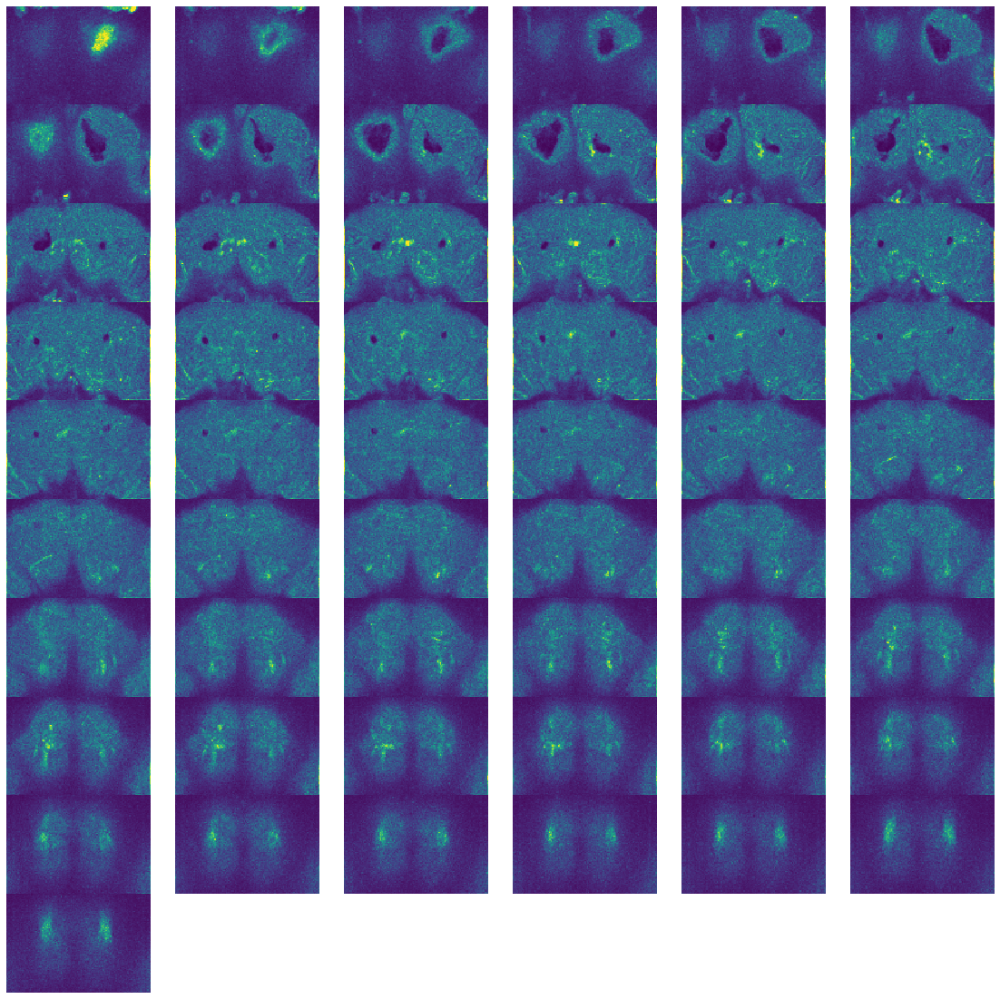

In [238]:
fig = plt.figure(figsize=(20,20))
#threshold_high = 0.04
#threshold_low = -0.04
#plt.set_cmap('RdBu')
for z in range(55):
    plt.subplot(10,6,z+1)
    #data = np.copy(brain_triggered[z,:,:])
    #data[np.where((data<threshold_high) & (data>threshold_low))]=0

    plt.imshow(brain_triggered[z,:,:], vmin = 0, vmax = 800)
    
    cur_axes = plt.gca()
    cur_axes.axes.get_xaxis().set_visible(False)
    cur_axes.axes.get_yaxis().set_visible(False)
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.axis('off')

In [240]:
save_file = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20190101_walking_dataset/fly_1/movement_triggered.nii'
brain_to_save = np.swapaxes(brain_triggered, 0, 2)
ants.image_write(ants.from_numpy(brain_to_save), save_file)

### OK, seems to work! Final all-brain loop:

##### At top of code, first load frame timestamps and fictrac data

In [61]:
flies

In [79]:
min_walking_bout_duration = 1 #in sec
fictrac_sampling_rate = 20 # in ms
dur = 30 * 60 * 1000 # experiment duration in ms
desired_fictrac_times = np.arange(0,dur,fictrac_sampling_rate)

for i, fly in enumerate(flies):
    
    #try:
    print('Fly {} of {}'.format(i+1, len(flies)))

    # Load brain if needed
    #print('Loading brain.')
    #brain_file = root_path+fly_folders[i]+'/motcorr.nii'
    #brain = load_brain(brain_file)
    #numpy_brain = brain.numpy()

    # Set brain if already loaded above
    #print('Numpifying brain.')
    #numpy_brain = fly.motcorr.numpy()
    #print(np.shape(numpy_brain))
    
    #Using psudo-z-scored-brain instead
    numpy_brain = flies[0].motcorr

    # Smooth fictrac data
    print('Preping fictrac data.')
    fictrac_smoothed = scipy.ndimage.filters.gaussian_filter(np.asarray(fly.fictrac['speed']),sigma=3)

    # Find ball movement background
    thresh = skimage.filters.threshold_triangle(fictrac_smoothed, nbins=256)

    # Find time points of motion onset
    print('Finding movement times.')
    under_thresh = np.where(fictrac_smoothed < thresh)[0]
    num_points = min_walking_bout_duration * 1000 / fictrac_sampling_rate
    movement_onset = under_thresh[np.where(np.diff(under_thresh) > num_points)[0]]
    movement_times = desired_fictrac_times[movement_onset]

    # Calculate delays of frames nearby the event
    print('Calculating event-triggered delays.')
    useful_frames = calc_event_triggered_delays(numpy_brain, movement_times, fly.timestamps)

    # Calculate moving average, and calculate difference metric
    print('Calculating difference metric.')
    brain_triggered, mean_signal = signal_metric(numpy_brain, useful_frames, metric='variance')

    # Save brain
    print('Saving brain.')
    save_file = os.path.join(root_path, fly_folders[i], 'zbrain_each_voxel_timecorrected.nii')
    brain_to_save = np.swapaxes(brain_triggered, 0, 2)
    #ants.image_write(ants.from_numpy(brain_to_save), save_file)
    #except:
    #    print('try failed')

Fly 1 of 1
Preping fictrac data.
Finding movement times.
Calculating event-triggered delays.
1 of 248. 2 of 248. 3 of 248. 4 of 248. 5 of 248. 6 of 248. 7 of 248. 8 of 248. 9 of 248. 10 of 248. 11 of 248. 12 of 248. 13 of 248. 14 of 248. 15 of 248. 

KeyboardInterrupt: 

In [19]:
min_walking_bout_duration = 1 #in sec
fictrac_sampling_rate = 20 # in ms
dur = 30 * 60 * 1000 # experiment duration in ms
desired_fictrac_times = np.arange(0,dur,fictrac_sampling_rate)

numpy_brain = flies[0].motcorr.numpy()

# Smooth fictrac data
print('Preping fictrac data.')
fictrac_smoothed = scipy.ndimage.filters.gaussian_filter(np.asarray(fly.fictrac['speed']),sigma=3)

# Find ball movement background
thresh = skimage.filters.threshold_triangle(fictrac_smoothed, nbins=256)

# Find time points of motion onset
print('Finding movement times.')
under_thresh = np.where(fictrac_smoothed < thresh)[0]
num_points = min_walking_bout_duration * 1000 / fictrac_sampling_rate
movement_onset = under_thresh[np.where(np.diff(under_thresh) > num_points)[0]]
movement_times = desired_fictrac_times[movement_onset]

Preping fictrac data.
Finding movement times.


In [25]:
useful_frames = calc_event_triggered_delays(numpy_brain,
                                            movement_times,
                                            fly.timestamps,
                                            search_before=10000,
                                            search_after=10000)

1 of 248. 2 of 248. 3 of 248. 4 of 248. 5 of 248. 6 of 248. 7 of 248. 8 of 248. 9 of 248. 10 of 248. 11 of 248. 12 of 248. 13 of 248. 14 of 248. 15 of 248. 16 of 248. 17 of 248. 18 of 248. 19 of 248. 20 of 248. 21 of 248. 22 of 248. 23 of 248. 24 of 248. 25 of 248. 26 of 248. 27 of 248. 28 of 248. 29 of 248. 30 of 248. 31 of 248. 32 of 248. 33 of 248. 34 of 248. 35 of 248. 36 of 248. 37 of 248. 38 of 248. 39 of 248. 40 of 248. 41 of 248. 42 of 248. 43 of 248. 44 of 248. 45 of 248. 46 of 248. 47 of 248. 48 of 248. 49 of 248. 50 of 248. 51 of 248. 52 of 248. 53 of 248. 54 of 248. 55 of 248. 56 of 248. 57 of 248. 58 of 248. 59 of 248. 60 of 248. 61 of 248. 62 of 248. 63 of 248. 64 of 248. 65 of 248. 66 of 248. 67 of 248. 68 of 248. 69 of 248. 70 of 248. 71 of 248. 72 of 248. 73 of 248. 74 of 248. 75 of 248. 76 of 248. 77 of 248. 78 of 248. 79 of 248. 80 of 248. 81 of 248. 82 of 248. 83 of 248. 84 of 248. 85 of 248. 86 of 248. 87 of 248. 88 of 248. 89 of 248. 90 of 248. 91 of 248. 92 of 24

# Bonus: make brain video

### Use the mov_avg signal for each voxel. just need to correctly shape! fiji would like x,y,z,t

In [218]:
# Currently z,t,y,x

mean_signal = np.swapaxes(mean_signal, 0, 3)
# Now x,t,y,z
mean_signal = np.swapaxes(mean_signal, 1, 2)
# Noe x,y,t,z
mean_signal = np.swapaxes(mean_signal, 2, 3)
mean_signal.shape

(128, 88, 55, 40)

In [67]:
mean_signal.shape

(128, 88, 47, 40)

In [219]:
save_file = os.path.join(root_path, fly_folders[0], 'whole_brain_video_eachvoxelcorrected.nii')
ants.image_write(ants.from_numpy(mean_signal), save_file)

### Video is cool!. Try to clean up by masking with some metric. Let's try variance over time

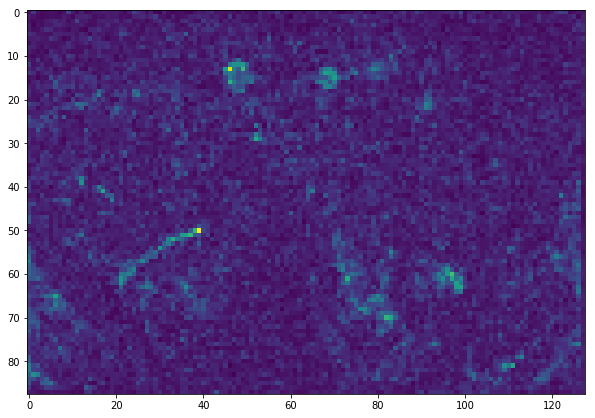

In [499]:
plt.figure(figsize=(10,10))
plt.imshow(brain_triggered[30,:,:])

### Need to use this as a threshold

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(brain_triggered[30,:,:])

In [ ]:
brain_triggered_thresh = [0 if x < .03 for x in brain_triggered]

In [521]:
brain_triggered.shape

(128, 88, 55)

In [520]:
brain_triggered = np.swapaxes(brain_triggered, 0, 2)

In [522]:
brain_triggered_thresh = np.copy(brain_triggered)
below_thresh = brain_triggered < 0.015
brain_triggered_thresh[below_thresh] = 0
brain_triggered_thresh = 

In [525]:
brain_triggered_thresh = np.copy(brain_triggered)
above_thresh = brain_triggered > 0.015


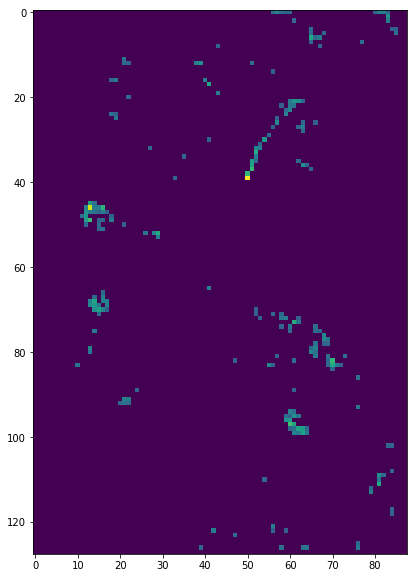

In [523]:
plt.figure(figsize=(10,10))
plt.imshow(brain_triggered_thresh[:,:,30])

In [547]:
mean_signal_thresh = np.copy(mean_signal)
mean_signal_thresh[for_thresholding] = 0

In [546]:
for_thresholding = np.tile(above_thresh[:,:,:,np.newaxis], (1,1,1,40))

In [542]:
for_thresholding.shape

(128, 88, 55, 40)

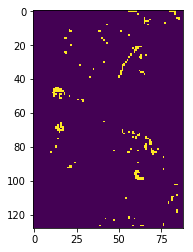

In [544]:
plt.imshow(for_thresholding[:,:,30,20])

In [545]:
for_thresholding

array([[[[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, Fa

In [539]:
mean_signal_thresh.shape

(128, 88, 55, 40)

In [ ]:
ma.make_mask(for_thresholding)

In [549]:
import numpy.ma as ma

In [562]:
test2 = test.filled(fill_value = 0)

In [563]:
test2

array([[[[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],

        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],

        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],

        ...,

        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
    

In [586]:
True in for_thresholding

True

In [587]:
thing = int(for_thresholding)

TypeError: only size-1 arrays can be converted to Python scalars

In [588]:
test

masked_array(
  data=[[[[--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --],
          ...,
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --]],

         [[--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --],
          ...,
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --]],

         [[--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --],
          ...,
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --]],

         ...,

         [[--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --],
          ...,
          [--, --, --, ..., --, --, --],
   

In [ ]:
test = ma.array(mean_signal_thresh, mask = np.invert(for_thresholding), fill_value = 0)

In [589]:
thing = ma.MaskedArray(mean_signal_thresh)

In [591]:
thing.mask = (np.invert(for_thresholding))

In [592]:
ma.set_fill_value(thing, 0)

### Why the fuck is it so hard to mask something???

In [622]:
data = mean_signal
mask = for_thresholding

In [595]:
data.shape

(128, 88, 55, 40)

In [596]:
mask.shape

(128, 88, 55, 40)

In [623]:
test = np.multiply(data, mask*1)

In [610]:
np.where(test==0, )

In [605]:
3*True

3

In [628]:
test2[test2==0] = np.nan

In [627]:
test2 = test.copy()

In [625]:
test

array([[[[ 0.,  0.,  0., ..., -0., -0., -0.],
         [ 0., -0., -0., ..., -0., -0., -0.],
         [ 0.,  0.,  0., ...,  0., -0., -0.],
         ...,
         [ 0.,  0.,  0., ...,  0.,  0.,  0.],
         [ 0.,  0.,  0., ...,  0.,  0.,  0.],
         [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

        [[ 0.,  0.,  0., ..., -0.,  0.,  0.],
         [ 0.,  0.,  0., ..., -0., -0.,  0.],
         [ 0.,  0.,  0., ..., -0.,  0.,  0.],
         ...,
         [ 0.,  0.,  0., ...,  0.,  0.,  0.],
         [ 0.,  0.,  0., ...,  0.,  0.,  0.],
         [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

        [[ 0.,  0.,  0., ...,  0.,  0.,  0.],
         [ 0., -0., -0., ..., -0.,  0.,  0.],
         [-0., -0., -0., ...,  0.,  0.,  0.],
         ...,
         [ 0.,  0.,  0., ...,  0.,  0.,  0.],
         [ 0.,  0.,  0., ...,  0.,  0.,  0.],
         [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

        ...,

        [[ 0.,  0.,  0., ...,  0.,  0.,  0.],
         [ 0., -0.,  0., ...,  0.,  0.,  0.],
         [ 0., -0.

In [583]:
test2 = np.asarray(test.filled())

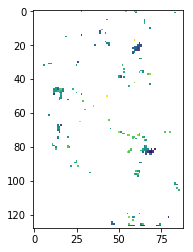

In [629]:
plt.imshow(test2[:,:,31,20])

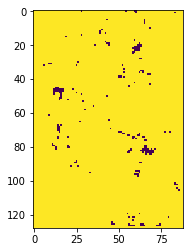

In [621]:
plt.imshow((mask*1)[:,:,31,20])

In [533]:
above_thresh.shape

(128, 88, 55)

In [630]:
save_file = os.path.join(root_path, fly_folders[0], 'whole_brain_video_thrsh_nan.nii')
ants.image_write(ants.from_numpy(test2), save_file)

(0, 100)

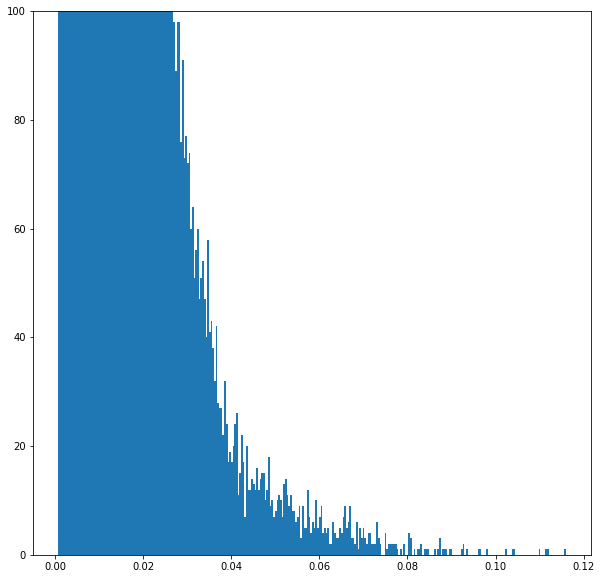

In [508]:
plt.figure(figsize=(10,10))
plt.hist(np.ndarray.flatten(brain_triggered), bins=300);
plt.ylim(0,100)

In [ ]:
thresh = skimage.filters.threshold_triangle(fictrac_smoothed, nbins=256)

# Bonus: plot all movavgs - maybe cluster?

In [634]:
mean_signal.shape

(128, 88, 55, 40)

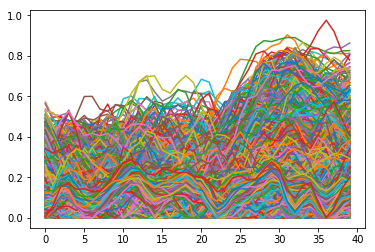

In [645]:
for x in range(128):
    for y in range(88):
        plt.plot(temp[x,y,14,:])

In [644]:
temp = np.subtract(mean_signal, np.tile(np.amin(mean_signal, axis = 3)[:,:,:,np.newaxis], (1,1,1,40)))

In [646]:
from sklearn.cluster import KMeans

ModuleNotFoundError: No module named 'sklearn'

# Analysis type 3: Toeplitz

### Set parameters

In [97]:
x = 50
y = 34
z = 14

In [85]:
resolution = 100 #desired resolution in ms
z = 14
timePointsToShift = -20 # in resolution units
beta_len = 40 # in resolution units

### First, temporally resample brain to 10Hz

In [86]:
interp = interp1d(flies[0].timestamps[:,z],
                  flies[0].motcorr[:,:,z,:],
                  fill_value='extrapolate')

time = np.arange(flies[0].timestamps[0,z],
                 flies[0].timestamps[-1,z],
                 resolution)

brain_resampled = interp(time)

In [87]:
dim_y = len(brain_resampled[:,0,0])
dim_x = len(brain_resampled[0,:,0])
dim_t = len(brain_resampled[0,0,:])

### Create 0/1 vector of behavior times

##### may need to first calculate movement_times above in analysis style 2

Error if not 17100 == 17100 == 17100


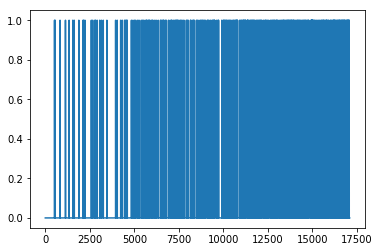

In [88]:
# The challenge is to make this vector match the interpolated brain times

# Create empty zero vector of correct length
movement_times_01s = np.zeros(len(brain_resampled[0,0,:]))

# Find indices where movement times should fit in the new time interpolation of brain data
indices = np.searchsorted(time, movement_times)

# Remove indices that are invalid. Could occur if some brain data is deleted
# and therefore some movement_times occur when there is no brain data.
# Will only cut out indices from tails
time_error = time[indices]-movement_times
indices_valid = []
for i in range(len(indices)):
    if time_error[i] < resolution:
        indices_valid.append(indices[i])
        
movement_times_01s[indices_valid] = 1
plt.plot(movement_times_01s)
print('Error if not {} == {} == {}'.format(len(time), len(brain_resampled[0,0,:]), len(movement_times_01s)))

### Movement_times_01s has a 1 when movement starts, but may want to shift to include the time before movement onset

In [89]:
movement_times_01s = shift(movement_times_01s, timePointsToShift, cval=0)

### Form Toeplitz matrix

In [90]:
X = toeplitz(movement_times_01s,np.zeros(beta_len))

### Solve for b for each voxel in the slice

In [91]:
bs = []

for x in range(dim_x):
    print('{}. '.format(x), end = '')
    for y in range(dim_y):
        Y = brain_resampled[y,x,:]
        b = sl.lstsq(X, Y)[0]
        bs.append(b)

0. 1. 2. 3. 4. 5. 6. 7. 8. 9. 10. 11. 12. 13. 14. 15. 16. 17. 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35. 36. 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50. 51. 52. 53. 54. 55. 56. 57. 58. 59. 60. 61. 62. 63. 64. 65. 66. 67. 68. 69. 70. 71. 72. 73. 74. 75. 76. 77. 78. 79. 80. 81. 82. 83. 84. 85. 86. 87. 88. 89. 90. 91. 92. 93. 94. 95. 96. 97. 98. 99. 100. 101. 102. 103. 104. 105. 106. 107. 108. 109. 110. 111. 112. 113. 114. 115. 116. 117. 118. 119. 120. 121. 122. 123. 124. 125. 126. 127. 

In [92]:
bs = np.asarray(bs)

In [93]:
np.shape(bs)

(11264, 40)

In [94]:
bs_slice = np.reshape(bs, (dim_x, dim_y, beta_len))

In [95]:
np.shape(bs_slice)

(128, 88, 40)

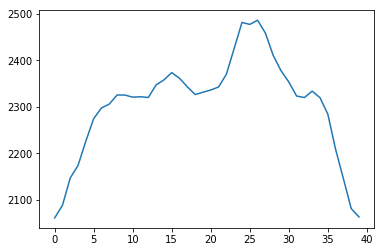

In [98]:
plt.plot(bs_slice[y,x,:])

In [99]:
values = np.var(bs_slice, axis=2)

In [100]:
values = np.swapaxes(values, 0, 1)

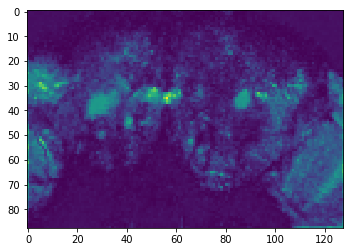

In [101]:
plt.imshow(values)

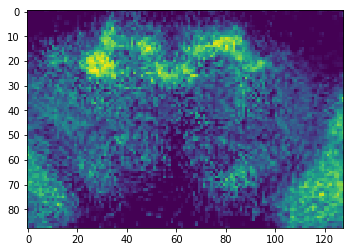

In [103]:
plt.imshow(flies[0].motcorr[:,:,31,1000])

# Analysis style 4: first do mov avg of all voxels, then do prediction error

### 

In [ ]:

#Using psudo-z-scored-brain instead
numpy_brain = brain_z

# Smooth fictrac data
print('Preping fictrac data.')
fictrac_smoothed = scipy.ndimage.filters.gaussian_filter(np.asarray(fly.fictrac['speed']),sigma=3)

# Find ball movement background
thresh = skimage.filters.threshold_triangle(fictrac_smoothed, nbins=256)

# Find time points of motion onset
print('Finding movement times.')
under_thresh = np.where(fictrac_smoothed < thresh)[0]
num_points = min_walking_bout_duration * 1000 / fictrac_sampling_rate
movement_onset = under_thresh[np.where(np.diff(under_thresh) > num_points)[0]]
movement_times = desired_fictrac_times[movement_onset]

# Calculate delays of frames nearby the event
print('Calculating event-triggered delays.')
useful_frames = calc_event_triggered_delays(numpy_brain, movement_times, fly.timestamps)

# Calculate moving average, and calculate difference metric
print('Calculating difference metric.')
brain_triggered, mean_signal = signal_metric(numpy_brain, useful_frames, metric='variance')

# Save brain
print('Saving brain.')
save_file = os.path.join(root_path, fly_folders[i], 'zbrainsmo_triggered_variance.nii')
brain_to_save = np.swapaxes(brain_triggered, 0, 2)
ants.image_write(ants.from_numpy(brain_to_save), save_file)
#except:
#    print('try failed')

In [444]:
x = 50
y = 34
z = 14

In [445]:
num_folds = 5

voxel_slices = []
delays = []

for frame in useful_frames:
    if frame['slice'] == z:

        voxel_slice = brain_z[:,:,z,frame['frame']]
        voxel_slices.append(voxel_slice)

        delay = frame['delay']
        delays.append(delay)

# Now we have a list of delays and corresponding voxel_slices
# I want to do cross validation on the moving_avg of this signal
# First, split the lists into 5 seperate lists. May as well do this randomly

fold_size = int(np.floor(len(delays)/5))
indicies = np.arange(len(delays))
voxel_slice_folds = []
delays_folds = []

for i in range(num_folds):
    fold = np.random.choice(indicies, fold_size, replace = False)
    delays_folds.append([delays[i] for i in fold])
    voxel_slice_folds.append([voxel_slices[i] for i in fold])
    
    # Remove chosen indicies so they aren't chosen again
    indicies = [i for i in indicies if i not in fold]

delays_folds = np.asarray(delays_folds)
voxel_slice_folds = np.asarray(voxel_slice_folds)
    
#means = slice_moving_avg(np.asarray(voxel_slices), delays)

In [466]:
# For each fold, hold it out and calculate mov avg on remaining folds
# Calculate mov avg on held out fold as well.
# Calculate error between both moving averages
brain_mse = []
train_movavgs = []
test_movavgs = []
for i in range(num_folds):
    test_fold = [i]
    train_folds = [x for x in np.arange(num_folds) if x not in test_fold]
    
    voxels_train = voxel_slice_folds[train_folds,:,:,:]
    voxels_train = np.reshape(voxels_train, (-1, *np.shape(voxels_train)[-2:]))
    delays_train = delays_folds[train_folds,:]
    delays_train = np.ndarray.flatten(delays_train)
    
    voxels_test = np.squeeze(voxel_slice_folds[test_fold,:,:,:])
    delays_test = np.squeeze(delays_folds[test_fold,:])

    train_movavg = np.asarray(slice_moving_avg(voxels_train, delays_train))
    test_movavg = np.asarray(slice_moving_avg(voxels_test, delays_test))
    
    train_movavgs.append(train_movavg)
    test_movavgs.append(test_movavg)

    mse = np.mean((train_movavg - test_movavg)**2, axis = 0)
    brain_mse.append(mse)

In [ ]:
train_movavgs_main = np.mean(np.asarray(train_movavgs), axis=0)
test_movavgs_main = np.mean(np.asarray(test_movavgs), axis=0)

In [471]:
mse = np.mean((train_movavgs_main - test_movavgs_main)**2, axis = 0)

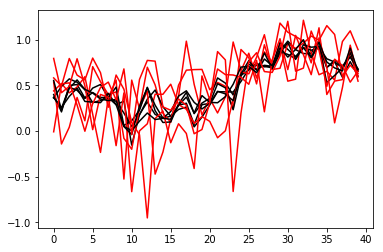

In [467]:
for i in range(5):
    plt.plot(train_movavgs[i][:,y,x], color='k')
    plt.plot(test_movavgs[i][:,y,x], color='r')

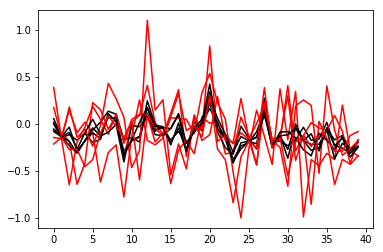

In [475]:
x=60
y=30
for i in range(5):
    plt.plot(train_movavgs[i][:,y,x], color='k')
    plt.plot(test_movavgs[i][:,y,x], color='r')

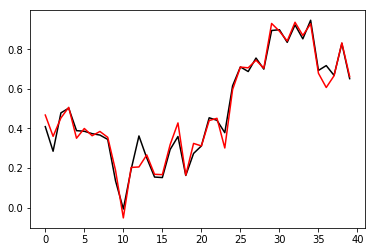

In [469]:
plt.plot(train_movavgs_main[:,y,x], color='k')
plt.plot(test_movavgs_main[:,y,x], color='r')

In [468]:
train_movavgs_main = np.mean(np.asarray(train_movavgs), axis=0)
test_movavgs_main = np.mean(np.asarray(test_movavgs), axis=0)

In [457]:
np.shape(train_movavgs)

(5, 40, 88, 128)

In [458]:
np.shape(test_movavgs)

(5, 40, 88, 128)

In [447]:
brain_mse = np.mean(brain_mse, axis = 0)

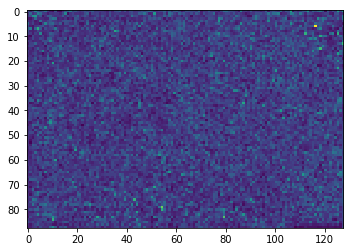

In [472]:
plt.imshow(mse)

# K-means clustering of avg signal

In [90]:
np.shape(mean_signal)

(88, 128, 55, 40)

In [65]:
mean_signal = np.asarray(mean_signal)

In [75]:
mean_signal = np.swapaxes(mean_signal, 0, 2)
mean_signal = np.swapaxes(mean_signal, 1, 2)

In [79]:
mean_signal = np.swapaxes(mean_signal, 2, 3)

In [91]:
mean_signal_flat = np.reshape(mean_signal, (-1, np.shape(mean_signal)[-1]))

In [92]:
mean_signal_flat.shape

(619520, 40)

In [98]:
mean_signal_corrected = mean_signal_flat - np.mean(mean_signal_flat, axis = 1)[:, None]

In [99]:
mean_signal_corrected.shape

(619520, 40)

In [167]:
k = 30

In [168]:
kmeans = KMeans(n_clusters=k)

In [169]:
out = kmeans.fit(mean_signal_corrected)

In [170]:
labels = kmeans.predict(mean_signal_corrected)

In [171]:
centroids = kmeans.cluster_centers_

In [172]:
np.shape(centroids)

(30, 40)

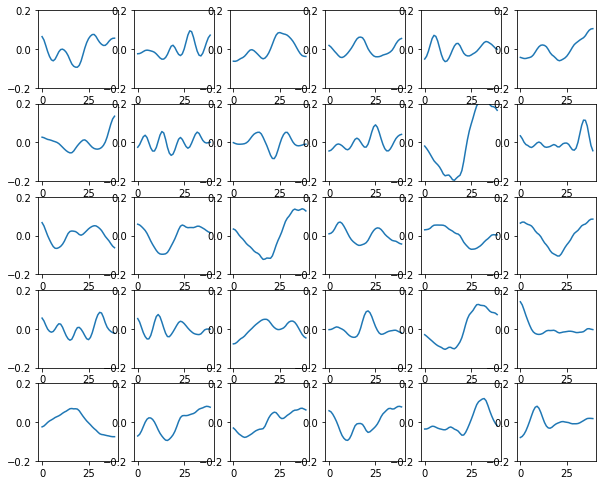

In [174]:
plt.figure(figsize=(10,10))
for i in range(k):
    plt.subplot(6,6,i+1)
    plt.plot(centroids[i,:])
    plt.ylim(-0.2, 0.2)

In [175]:
brain_labeled = np.reshape(labels, (88,128,55))

In [178]:
brain_labeled_to_save = np.swapaxes(brain_labeled, 0, 1)

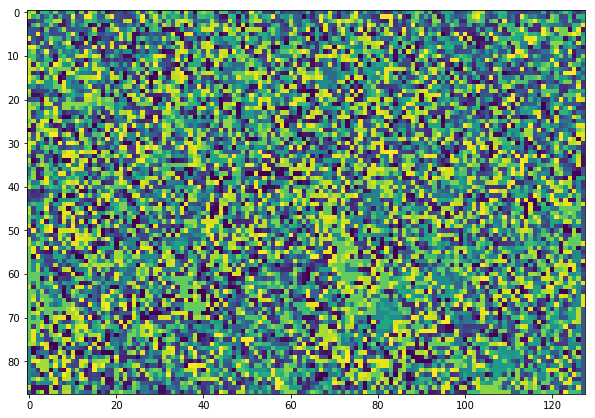

In [177]:
plt.figure(figsize=(10,10))
plt.imshow(brain_labeled[:,:,30])

In [128]:
brain_labeled_one_cluster = brain_labeled == 6

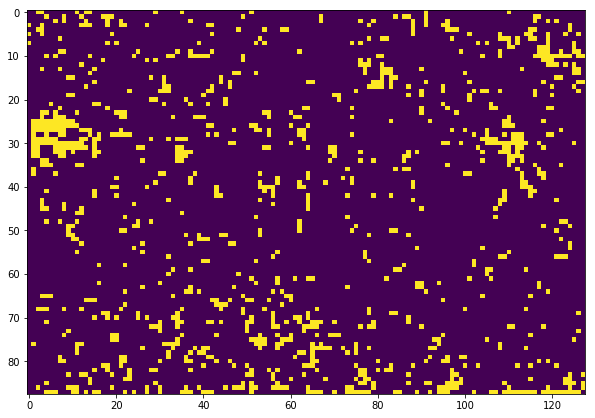

In [129]:
plt.figure(figsize=(10,10))
plt.imshow(brain_labeled_one_cluster[:,:,13])

In [179]:
save_file = os.path.join(root_path, fly_folders[0], 'zbrain_30clusters.nii')
brain_to_save = np.swapaxes(brain_labeled,0,1)
ants.image_write(ants.from_numpy(brain_to_save), save_file)

# Multivariate linear regression

### Multiple linear regression with behavior at time points prev and upcoming as response
Multivariate multiple regression.
I think actually I don't need multiple regression, just multivariate.
For t100, use window of neural activity t80 to t120, and use this to predict behavior at t100.
For Y=Xb:
		a. Y is 4000 by 1
		b. X is 4000 by 40. Each column is a time shifted voxel activity.
b is 40 by 1

### Smooth fictrac data

In [31]:
fictrac_smoothed = scipy.ndimage.filters.gaussian_filter(np.asarray(flies[0].fictrac['speed']),sigma=3)

(0, 0.06)

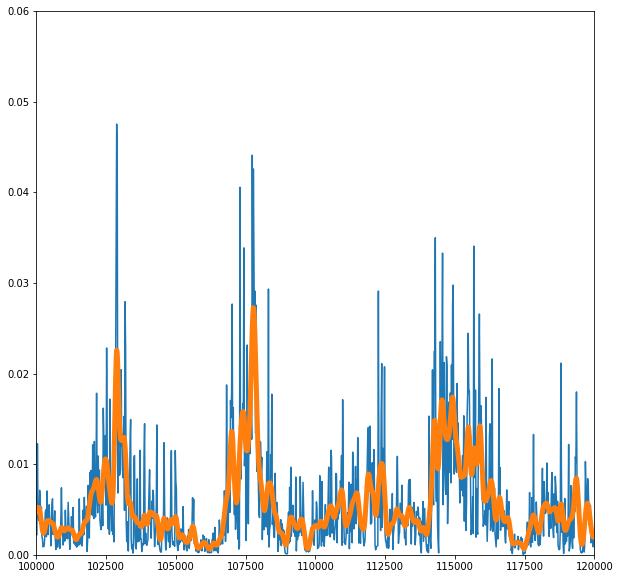

In [34]:
plt.figure(figsize=(10,10))
plt.plot(raw_fictrac_times, flies[0].fictrac['speed'])
plt.plot(raw_fictrac_times, fictrac_smoothed, linewidth=5)
plt.xlim(100000,120000)
plt.ylim(0,.06)

### Interpolate fictrac data to match imaging times ###

In [33]:
fps = 50
camera_rate = 1/fps * 1000 # camera frame rate in ms
dur = 30 * 60 * 1000 # experiment duration in ms

raw_fictrac_times = np.arange(0,dur,camera_rate)
# Warning: interp1d set to fill in out of bounds times
fictrac_interp_temp = interp1d(raw_fictrac_times, fictrac_smoothed, bounds_error = False)
fictrac_interp = fictrac_interp_temp(flies[0].timestamps)

# Replace Nans with zeros (for later code)
np.nan_to_num(fictrac_interp, copy=False);

### Verify interpolation

Text(0.5, 1.0, 'zoomin')

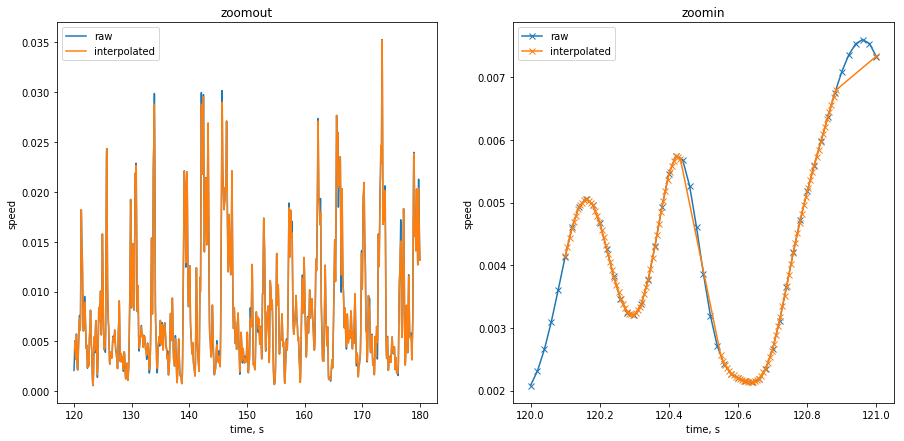

In [35]:
# Verify interpolation is working well, and visualize if "kind" is optimal:
fictrac_interp_flat = np.ndarray.flatten(fictrac_interp)
timestamps_flat = np.ndarray.flatten(flies[0].timestamps)

fig = plt.figure(figsize=(15,7))

# Time range to plot, in sec
start = 120
end = 180

start = start*1000
end = end*1000

### Plot full view ###
plt.subplot(1,2,1)
#plot raw values
plt.plot([value/1000 for value in raw_fictrac_times if start <= value <= end],
         [fictrac_smoothed[ind] for ind, value in enumerate(raw_fictrac_times) if start <= value <= end],
         label = 'raw')

#plot interpolated values
plt.plot([value/1000 for value in timestamps_flat if start <= value <= end],
         [fictrac_interp_flat[ind] for ind, value in enumerate(timestamps_flat) if start <= value <= end],
         label = 'interpolated')
plt.legend()
plt.title('zoomout')
plt.xlabel('time, s')
plt.ylabel('speed')

### Plot zoom-in view ###
plt.subplot(1,2,2)

#plot raw values
plt.plot([value/1000 for value in raw_fictrac_times if start <= value <= start+1000],
         [fictrac_smoothed[ind] for ind, value in enumerate(raw_fictrac_times) if start <= value <= start+1000],
         label = 'raw', marker='x')

#plot interpolated values
plt.plot([value/1000 for value in timestamps_flat if start <= value <= start+1000],
         [fictrac_interp_flat[ind] for ind, value in enumerate(timestamps_flat) if start <= value <= start+1000],
         label = 'interpolated', marker='x')
plt.legend()
plt.xlabel('time, s')
plt.ylabel('speed')
plt.title('zoomin')

### Creat response vector (behavior)

In [29]:
np.shape(fictrac_interp)

(3806, 55)

In [36]:
z_slice = 13
Y = fictrac_interp[:,z_slice]

In [270]:
Yd = np.gradient(Y)

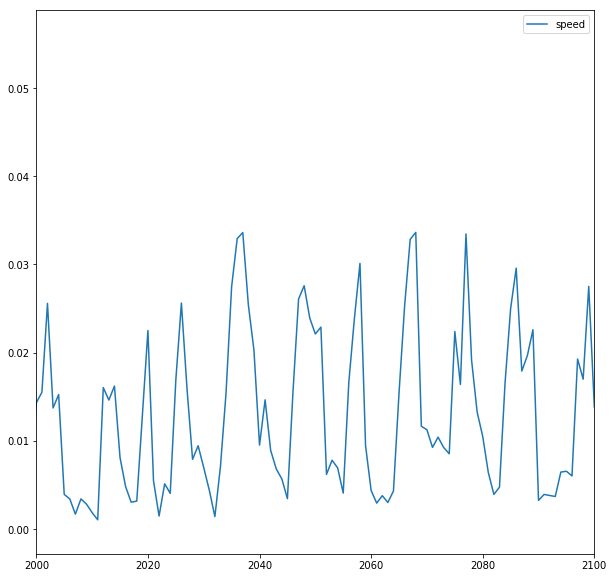

In [37]:
fig = plt.figure(figsize=(10,10))
plt.plot(Y, label = 'speed')
#plt.plot(Yd, label = 'acceleration')
plt.xlim(2000,2100)
plt.legend()

### Create X matrix (neural activity)

In [108]:
#x = 61 #PB
#y = 33 #PB
x=34
y=42

voxel_activity = brain_z[y,x,z_slice,:]

# Sanity check that lengths match
len(voxel_activity) == len(Y)

True

##### Each time point is ~400ms apart, so to look at 4sec before and after, need a range of 20 for the time-shifted columns

In [109]:
beta_len = 41 #MUST BE ODD
middle = int((beta_len - 1) / 2)

In [110]:
sample_rate = 0.44939968
start = middle * sample_rate * -1
stop = (start * -1)
timepoints = np.linspace(start,stop,num=beta_len)

In [111]:
X = toeplitz(voxel_activity,np.zeros(beta_len))

In [112]:
# Roll X by half beta_len so we look at voxel times before and after the behavior
X = np.roll(X, middle)

In [113]:
# Flip X so time before behavior is on left, and time after behavior is on right
X = np.flip(X, axis=1)

In [114]:
# Remove last 10 entries from X and Y
#X = X[:-10,:]
#Y = Y[:-10]

In [115]:
len(X), len(Y)

(3806, 3806)

In [116]:
t = time()
b = sl.lstsq(X, Y)[0]
print(time() - t)

0.005005598068237305


In [117]:
0.00536799430847168*128*88

60.465087890625

Text(0, 0.5, 'beta value')

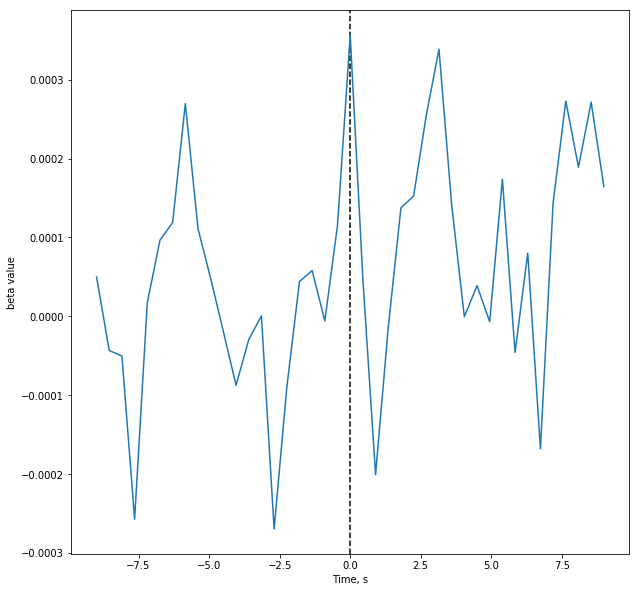

In [118]:
fig = plt.figure(figsize=(10,10))
plt.axvline(0, linestyle='--',color='k')
plt.plot(timepoints, b)
plt.xlabel('Time, s')
plt.ylabel('beta value')

In [50]:
from sklearn.linear_model import Lasso

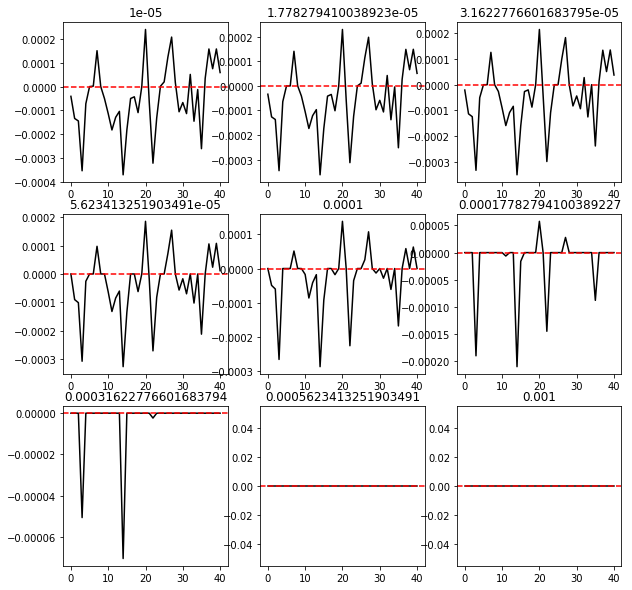

In [119]:
fig = plt.figure(figsize=(10,10))

alphas = np.logspace(-5, -3, 9)

for i, alpha in enumerate(alphas):
    plt.subplot(3,3,i+1)
    lasso = Lasso(alpha=alpha)
    lasso.fit(X, Y) 
    plt.plot(lasso.coef_,color='k')
    plt.axhline(0,color='r',linestyle='--')
    plt.title('{}'.format(alpha))
    #plt.axis('off')

In [ ]:
fig = plt.figure(figsize=(10,10))

alphas = np.logspace(-5, -3, 9)

for i, alpha in enumerate(alphas):
    lasso = Lasso(alpha=alpha)
    lasso.fit(X, Y) 
    plt.plot(lasso.coef_,color='k')
    plt.axhline(0,color='r',linestyle='--')
    plt.title('{}'.format(alpha))
    plt.axis('off')

In [53]:
alpha = 1e-5
lasso = Lasso(alpha=alpha)
lasso.fit(X, Y)

Lasso(alpha=1e-05, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)

(3000, 3100)

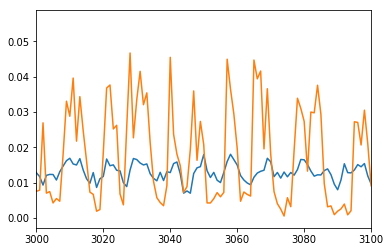

In [91]:
plt.plot(lasso.predict(X))
plt.plot(Y)
plt.xlim(3000,3100)

In [46]:
flies[0].timestamps.shape

(3806, 55)

In [47]:
timestamps = flies[0].timestamps[:,13]

Text(0.5, 1.0, 'Period of high movement')

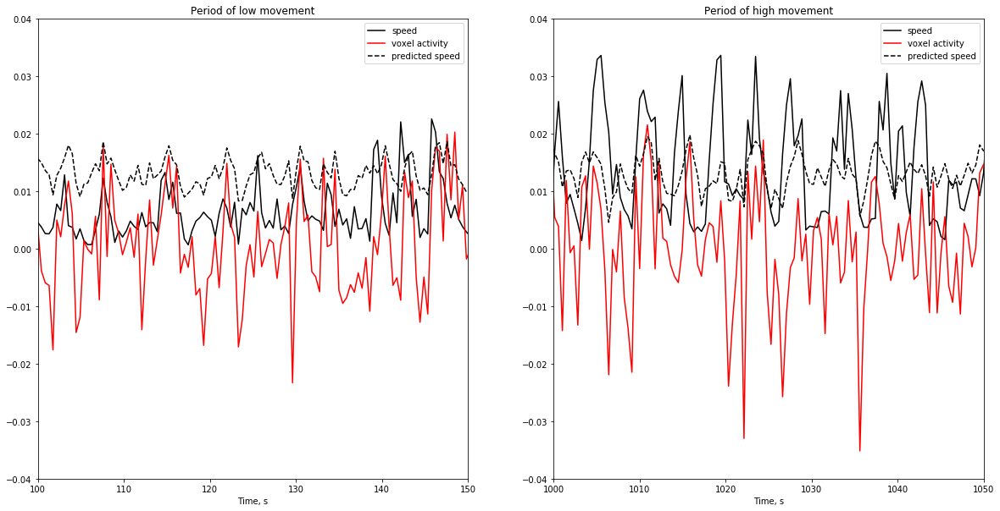

In [64]:
fig = plt.figure(figsize=(20,10))

plt.subplot(121)
plt.plot(timestamps/1000, Y, color = 'k', label = 'speed')
plt.plot(timestamps/1000, voxel_activity/100, color = 'r', label = 'voxel activity')
plt.plot(timestamps/1000, lasso.predict(X), color = 'k', linestyle='--', label = 'predicted speed')
plt.xlim(100,150)
plt.ylim(-0.04,.04)
plt.legend()
plt.xlabel('Time, s')
plt.title('Period of low movement')

plt.subplot(122)
plt.plot(timestamps/1000, Y, color = 'k', label = 'speed')
plt.plot(timestamps/1000, voxel_activity/100, color = 'r', label = 'voxel activity')
plt.plot(timestamps/1000, lasso.predict(X), color = 'k', linestyle='--', label = 'predicted speed')
plt.xlim(1000,1050)
plt.ylim(-0.04,.04)
plt.legend()
plt.xlabel('Time, s')
plt.title('Period of high movement')

In [67]:
from sklearn.linear_model import LassoCV

##### https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LassoCV.html

##### The coefficient R^2 is defined as (1 - u/v), where u is the residual sum of squares ((y_true - y_pred) ** 2).sum() and v is the total sum of squares ((y_true - y_true.mean()) ** 2).sum().

In [120]:
reg = LassoCV(cv=5, random_state=0).fit(X, Y)
#>>> reg.score(X, y) 

In [108]:
Y.mean()

0.012957493381306938

In [120]:
v = ((Y-Y.mean())**2).sum()
print(v)

0.39635489828172754


In [119]:
RSS = ((Y-reg.predict(X))**2).sum()
print(RSS)

0.36150508123672453


In [121]:
RSS/v

0.9120742112786205

In [118]:
1 - (RSS/v)

0.08792578872137946

In [ ]:
# So, as RSS gets small, RSS/v gets small, and score gets large.
# as v gets small, RSS/v gets big, and score gets small. So, it helps if v is large.
# Basically, the dividing by v corrects for the variance in Y. if Y has high variance values, higher RSS is acceptable. 

In [124]:
1/2

0.5

In [154]:
X.shape

(3806, 21)

In [122]:
reg.score(X,Y)

0.0012575847730291745

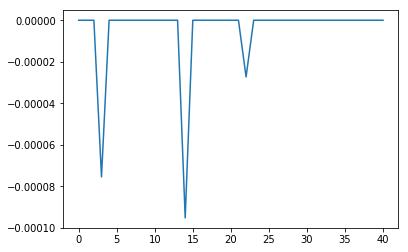

In [121]:
plt.plot(reg.coef_)

Computing regularization path using the coordinate descent lasso...
0.059793949127197266


(2.4567594859075177,
 5.7567594859075175,
 5.687951218322169e-05,
 0.0002212433393683112)

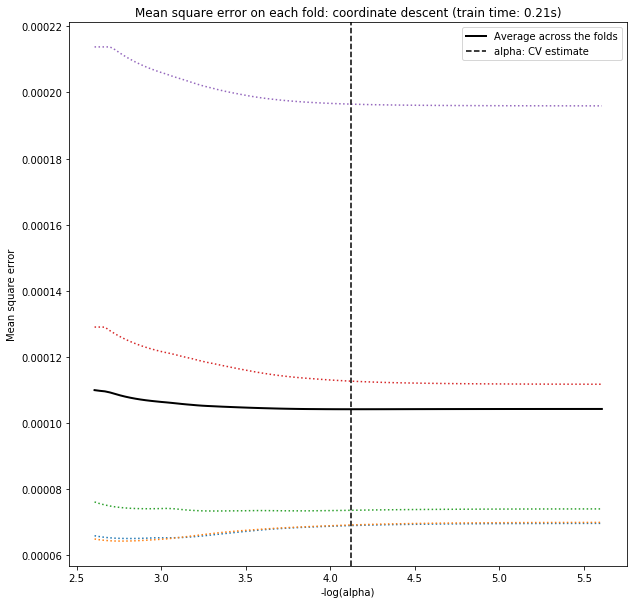

In [163]:
# Compute paths
print("Computing regularization path using the coordinate descent lasso...")
t0 = time()
model = LassoCV(cv=5).fit(X, Y)
print(time()-t0)

# Display results
m_log_alphas = -np.log10(model.alphas_)

fig = plt.figure(figsize=(10,10))
plt.plot(m_log_alphas, model.mse_path_, ':')
plt.plot(m_log_alphas, model.mse_path_.mean(axis=-1), 'k',label='Average across the folds', linewidth=2)
plt.axvline(-np.log10(model.alpha_), linestyle='--', color='k', label='alpha: CV estimate')

plt.legend()
plt.xlabel('-log(alpha)')
plt.ylabel('Mean square error')
plt.title('Mean square error on each fold: coordinate descent ' '(train time: %.2fs)' % t_lasso_cv)
plt.axis('tight')

In [180]:
0.059793949127197266*128*88

673.51904296875

In [86]:
from sklearn.linear_model import LassoLarsIC

In [158]:
model_bic.score(X,Y)

0.07376871701927201

In [167]:
model_bic.alpha_

6.4951880193225696e-06

In [168]:
model.alpha_

7.552469827859366e-05

In [170]:
-np.log(.1)

2.3025850929940455

In [171]:
-np.log(.01)

4.605170185988091

In [ ]:
# CV version picked a bigger alpha, which should result in a simpler model...

In [178]:
np.abs(model_bic.coef_).sum()

0.0034199567442252253

In [179]:
np.abs(model.coef_).sum()

0.006391359492496529

In [ ]:
# we can see that CV is larg

BIC:  0.0011072576300312242
CV:  0.00022386839382556337


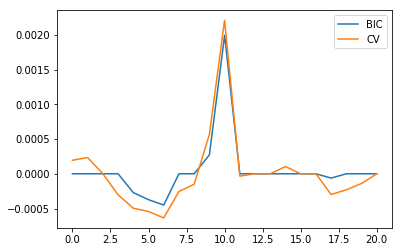

In [176]:
plt.plot(model_bic.coef_, label = 'BIC')
print('BIC: ', model_bic.coef_.sum())
plt.plot(model.coef_, label = 'CV')
print('CV: ', model.coef_.sum())
plt.legend()

/share/software/user/open/py-jupyter/1.0.0_py36/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning:

divide by zero encountered in log10



Text(0.5, 1.0, 'Information-criterion for model selection (training time 0.008s)')

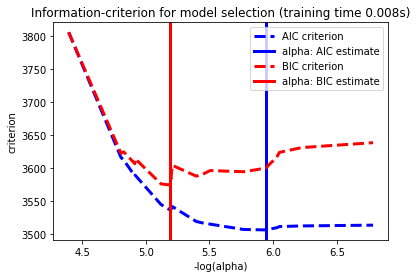

In [155]:
model_bic = LassoLarsIC(criterion='bic')
t1 = time()
model_bic.fit(X, Y)
t_bic = time() - t1
alpha_bic_ = model_bic.alpha_

model_aic = LassoLarsIC(criterion='aic')
model_aic.fit(X, Y)
alpha_aic_ = model_aic.alpha_


def plot_ic_criterion(model, name, color):
    alpha_ = model.alpha_
    alphas_ = model.alphas_
    criterion_ = model.criterion_
    plt.plot(-np.log10(alphas_), criterion_, '--', color=color,
             linewidth=3, label='%s criterion' % name)
    plt.axvline(-np.log10(alpha_), color=color, linewidth=3,
                label='alpha: %s estimate' % name)
    plt.xlabel('-log(alpha)')
    plt.ylabel('criterion')

plt.figure()
plot_ic_criterion(model_aic, 'AIC', 'b')
plot_ic_criterion(model_bic, 'BIC', 'r')
plt.legend()
plt.title('Information-criterion for model selection (training time %.3fs)'
          % t_bic)

### Looks great, lets make a loop for a slice

##### It loooks like BIC is much faster than CV, but CV is better. Lets start with BIC or else will take forever during testing. Should later use CV for final

In [ ]:
beta_len = 21 #MUST BE ODD
middle = int((beta_len - 1) / 2)

models = []
scores = []
for z in range(55):
    print('~~ z:{} ~~ '.format(z), end = '')
    Y = fictrac_interp[:,z]
    for x in range(128):
        print('{}. '.format(x), end = '')
        for y in range(88):
            voxel_activity = brain_z[y,x,z,:]
            X = toeplitz(voxel_activity,np.zeros(beta_len))
            X = np.roll(X, middle)
            model = LassoLarsIC(criterion='bic')
            model.fit(X, Y)
            models.append(model)
            scores.append(model.score(X,Y))

~~ z:0 ~~ 0. 1. 2. 3. 4. 5. 6. 7. 8. 9. 10. 11. 12. 13. 14. 15. 16. 17. 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35. 36. 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50. 51. 52. 53. 54. 55. 56. 57. 58. 59. 60. 61. 62. 63. 64. 65. 66. 67. 68. 69. 70. 71. 72. 73. 74. 75. 76. 77. 78. 79. 80. 81. 82. 83. 84. 85. 86. 87. 88. 89. 90. 91. 92. 93. 94. 95. 96. 97. 98. 99. 100. 101. 102. 103. 104. 105. 106. 107. 108. 109. 110. 111. 112. 113. 114. 115. 116. 117. 118. 119. 120. 121. 122. 123. 124. 125. 126. 127. ~~ z:1 ~~ 0. 1. 2. 3. 4. 5. 6. 7. 8. 9. 10. 11. 12. 13. 14. 15. 16. 17. 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35. 36. 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50. 51. 52. 53. 54. 55. 56. 57. 58. 59. 60. 61. 62. 63. 64. 65. 66. 67. 68. 69. 70. 71. 72. 73. 74. 75. 76. 77. 78. 79. 80. 81. 82. 83. 84. 85. 86. 87. 88. 89. 90. 91. 92. 93. 94. 95. 96. 97. 98. 99. 100. 101. 102. 103. 104. 105. 106. 107. 108. 109. 110. 111. 

### Loop for all brains

In [21]:
@timing
def load_timestamps(folder, file='functional.xml'):
    print('Loading timestamps.')
    # load from h5py if it exists, otherwise load from xml and create h5py
    try:
        timestamps = bruker_timestamps_import(folder, file, False)
    except:
        timestamps = bruker_timestamps_import(folder, file, True)
    return timestamps
        
@timing
def prep_fictrac(fictrac, timestamps, fps, dur):
    print('Preping fictrac.')
    camera_rate = 1/fps * 1000 # camera frame rate in ms
    raw_fictrac_times = np.arange(0,dur,camera_rate)
    
    # Cut off any extra frames (only happened with brain 4)
    fictrac = fictrac[:90000]
    
    # Smooth
    fictrac_smoothed = scipy.ndimage.filters.gaussian_filter(np.asarray(fictrac['speed']),sigma=3)
    
    # Interpolate
    # Warning: interp1d set to fill in out of bounds times
    fictrac_interp_temp = interp1d(raw_fictrac_times, fictrac_smoothed, bounds_error = False)
    fictrac_interp = fictrac_interp_temp(timestamps)
    
    # Replace Nans with zeros (for later code)
    np.nan_to_num(fictrac_interp, copy=False);
    
    return fictrac_interp

@timing
def get_motcorr_brain(folder):
    # If it exists, load motion correction brain
    try:
        print('Trying to load motion-corrected brain.')
        brain_file = folder + '/motcorr.nii'
        numpy_brain = load_numpy_brain(brain_file)
        print('Loaded motion-corrected brain.')
    except:
        # next, try loading the functional brain and perform motion correction
        print('Failed to load motion-corrected brain.')
        print('Trying to load functional brain.')
        brain_file = folder + '/functional.nii'
        numpy_brain = load_numpy_brain(brain_file, channel='green')
        print('Loaded functional brain.')
        
        ### Perform motion correction ###
        print('Performing motion-correction.')
        numpy_brain = motion_correction(numpy_brain, folder)
        
    dims = get_dims(numpy_brain)
    return numpy_brain, dims

def get_dims(brain):
    y = brain.shape[0]
    x = brain.shape[1]
    z = brain.shape[2]
    t = brain.shape[3]
    return {'x': x, 'y': y, 'z': z, 't': t}

@timing
def bleaching_correction(brain):
    print('Bleaching correction.')
    smoothed = scipy.ndimage.gaussian_filter1d(brain,sigma=200,axis=3,truncate=1)
    brain = brain - smoothed
    return brain

@timing
def z_score_brain(brain):
    print('Z-score brain.')
    brain_mean  = np.mean(brain, axis=3)
    brain_std = np.std(brain, axis=3)
    brain = (brain - brain_mean[:,:,:,None]) / brain_std[:,:,:,None]
    return brain

@timing
def fit_glm(brain, dims, fictrac, beta_len):
    print('Fit GLM.')
    middle = int((beta_len - 1) / 2)
    models = []
    scores = []
    for z in range(dims['z']):
        print('~~ z:{} ~~ '.format(z), end = '')
        Y = fictrac[:,z]
        for x in range(dims['x']):
            for y in range(dims['y']):
                voxel_activity = brain[y,x,z,:]
                X = toeplitz(voxel_activity, np.zeros(beta_len))
                X = np.roll(X, middle)
                model = LassoLarsIC(criterion='bic')
                model.fit(X, Y)
                #models.append(model)
                scores.append(model.score(X,Y))
    scores = np.reshape(scores, (dims['z'], dims['x'], dims['y']))
    return scores

def save_glm_map(vol, folder, file='multivariate_analysis_fixed_feb23.nii'):
    print('Saving glm vol.')
    save_file = os.path.join(folder, file)
    brain_to_save = np.swapaxes(vol, 0, 2)
    ants.image_write(ants.from_numpy(brain_to_save), save_file)

In [ ]:
beta_len = 21 #MUST BE ODD
fps = 50 #of fictrac camera
dur = 30 * 60 * 1000 # experiment duration in ms

for fly_idx, fly in enumerate(flies):
    
    ### Send email and define folder path ###
    function_durations = []
    print('Starting analysis of {}.'.format(fly_folders[fly_idx]))
    send_email('Starting {} ({} of {}).'.format(fly_folders[fly_idx], fly_idx+1, len(flies)), 'wow')
    folder = root_path + fly_folders[fly_idx]

    ### Load timestamps ###
    timestamps = load_timestamps(folder)
    
    ### Load fictrac (and prep) ###
    # add sanity check for failed frames. Simply check if and speed measurements are over 10
    fictrac = load_fictrac(root_path, fly_folders[fly_idx])
    fictrac_interp = prep_fictrac(fictrac, timestamps, fps, dur)

    ### Load brain ###
    brain, dims = get_motcorr_brain(folder)

    # remove first bit of data since it often has some weirdness
    brain = brain[:,:,:,200:]
    timestamps = timestamps[200:,:]
    fictrac_interp = fictrac_interp[200:,:]
    dims['t'] = brain.shape[3]

    ### Bleaching correction (per voxel) ###
    brain_bleach = bleaching_correction(brain)
    
    ### Z-score brain ###
    brain_z = z_score_brain(brain_bleach)
    
    ### Fit GLM ###
    scores = fit_glm(brain_z, dims, fictrac_interp, beta_len)
    
    ### Save brain ###
    save_glm_map(scores, folder)
    
    ### Send email ###
    
    # Prep timing string
    func_str = ''
    for func in function_durations:
        func_str += '{} ===== {:.2f} min\n'.format(func['name'], func['duration'])
        
    send_email('Success {} ({} of {}).'.format(fly_folders[fly_idx], fly_idx+1, len(flies)), func_str)

Starting analysis of fly_16.
Loading timestamps.
loading timestamp data from hdf5 file... done
Elapsed time: 0.00047188202540079753min
Loading fictrac.
Elapsed time: 0.051116851965586345min
Preping fictrac.
Elapsed time: 0.0003710309664408366min
Trying to load motion-corrected brain.
Loaded motion-corrected brain.
Elapsed time: 0.3456747929255168min
Bleaching correction.
Elapsed time: 14.930849464734395min
Z-score brain.
Elapsed time: 0.8361979166666667min
Fit GLM.
~~ z:0 ~~ ~~ z:1 ~~ ~~ z:2 ~~ ~~ z:3 ~~ ~~ z:4 ~~ 

In [19]:
function_durations = []

In [28]:
beta_len = 21 #MUST BE ODD
fps = 50 #of fictrac camera
dur = 30 * 60 * 1000 # experiment duration in ms

In [25]:
folder = folder = root_path + fly_folders[0]

In [26]:
 timestamps = load_timestamps(folder)

Loading timestamps.
loading timestamp data from hdf5 file... done
Elapsed time: 0.0005118727684020996min


In [38]:
root_path

'/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20190101_walking_dataset/'

In [64]:
fictrac = load_fictrac(root_path, 'fly_16')
    #fictrac_interp = prep_fictrac(fictrac, timestamps, fps, dur)

Loading fictrac.


Exception: Fictrac ball tracking failed (reporting impossibly high speed).

In [59]:
speed = np.asarray(fictrac['speed'])

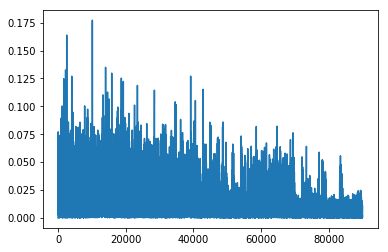

In [60]:
plt.plot(speed)

In [24]:
np.sum(brain)

1.0985960585685461e-08

In [19]:
np.sum(scores)

1092.0466369842895

In [33]:
'{:.2f}'.format(0.234543)

'0.23'

In [36]:
func_str = ''
for func in function_durations:
    func_str += '{} ===== {} min\n'.format(func['name'], func['duration'])

In [23]:
func_str

'load_timestamps ===== 6.319681803385417e-05 min\nload_fictrac ===== 0.04818158547083537 min\nprep_fictrac ===== 0.00031706889470418297 min\nget_motcorr_brain ===== 0.22416276534398397 min\n'

In [28]:
folder = root_path + fly_folders[0]

In [34]:
%%error_handler

timestamps = load_timestamps(folder)
send_email('blah', 'blah')

Loading timestamps.
loading timestamp data from hdf5 file... done
Elapsed time: 4.8724810282389325e-05min


In [35]:
timestamps

array([[1.10426400e+02, 1.15684800e+02, 1.20943200e+02, ...,
        3.52312800e+02, 3.57571200e+02, 3.62829600e+02],
       [4.78514400e+02, 4.83772800e+02, 4.89031200e+02, ...,
        7.20400800e+02, 7.25659200e+02, 7.30917600e+02],
       [8.46602400e+02, 8.51860800e+02, 8.57119200e+02, ...,
        1.08848880e+03, 1.09374720e+03, 1.09900560e+03],
       ...,
       [1.79932457e+06, 1.79932983e+06, 1.79933509e+06, ...,
        1.79956646e+06, 1.79957172e+06, 1.79957697e+06],
       [1.79969266e+06, 1.79969792e+06, 1.79970318e+06, ...,
        1.79993454e+06, 1.79993980e+06, 1.79994506e+06],
       [1.80006075e+06, 1.80006600e+06, 1.80007126e+06, ...,
        1.80030263e+06, 1.80030789e+06, 1.80031315e+06]])

In [25]:
function_durations

[{'duration': 0.0011307557423909506, 'name': 'load_timestamps'},
 {'duration': 0.05801321665445964, 'name': 'load_fictrac'},
 {'duration': 0.0005745530128479004, 'name': 'prep_fictrac'},
 {'duration': 0.3124087691307068, 'name': 'get_motcorr_brain'},
 {'duration': 13.520177125930786, 'name': 'bleaching_correction'},
 {'duration': 0.8288999994595846, 'name': 'z_score_brain'},
 {'duration': 52.38517024914424, 'name': 'fit_glm'},
 {'duration': 0.0006011764208475749, 'name': 'load_timestamps'},
 {'duration': 0.05848238865534464, 'name': 'load_fictrac'},
 {'duration': 0.00042768319447835285, 'name': 'prep_fictrac'},
 {'duration': 0.36055991649627683, 'name': 'get_motcorr_brain'},
 {'duration': 16.292068672180175, 'name': 'bleaching_correction'},
 {'duration': 0.975547730922699, 'name': 'z_score_brain'},
 {'duration': 67.27161696751912, 'name': 'fit_glm'}]

In [20]:
func_str

NameError: name 'func_str' is not defined

In [22]:
brain

NameError: name 'brain' is not defined

In [23]:
scores

NameError: name 'scores' is not defined

In [24]:
timestamps

NameError: name 'timestamps' is not defined

In [19]:
def timing(f):
    @wraps(f)
    def wrapper(*args, **kwargs):
        start = time()
        result = f(*args, **kwargs)
        end = time()
        duration = (end-start)/60
        save_duration(name=f.__name__, duration=duration)
        print('Elapsed time: {}{}'.format(duration,'min'))
        return result
    return wrapper

def save_duration(name, duration):
    function_durations.append({'name': name, 'duration': duration})

In [20]:
@timing
def test_function(val):
    val += 1
    val1 = 3
    return val, val1

In [22]:
function_durations = []

In [25]:
function_durations

[{'duration': 1.9868214925130207e-08, 'name': 'test_function'}]

In [78]:
func_str = ''
for func in function_durations:
    func_str += '{} ===== {} min\n'.format(func['name'], func['duration'])

In [79]:
func_str

'test_function took 1.5894571940104166e-08 min\ntest_function took 1.5894571940104166e-08 min\ntest_function took 1.1920928955078126e-08 min\n'

In [80]:
send_email('title',func_str)

In [24]:
test_function(5)

Elapsed time: 1.9868214925130207e-08min


(6, 3)

In [75]:
function_durations

[{'duration': 1.5894571940104166e-08, 'name': 'test_function'},
 {'duration': 1.5894571940104166e-08, 'name': 'test_function'},
 {'duration': 1.1920928955078126e-08, 'name': 'test_function'}]

In [56]:
c=1

In [46]:
test.__name__

'test'

In [45]:
dir(test)

['__annotations__',
 '__call__',
 '__class__',
 '__closure__',
 '__code__',
 '__defaults__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__get__',
 '__getattribute__',
 '__globals__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__kwdefaults__',
 '__le__',
 '__lt__',
 '__module__',
 '__name__',
 '__ne__',
 '__new__',
 '__qualname__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__']

In [ ]:
def load_numpy_brain(file, channel=None, flip=False):
    # If no channel specified, load all channels, else load specified channel
    brain = nib.load(file).get_data()
    if channel == 'red':
        brain = brain[:,:,:,:,0] # for red brain.
    if channel  == 'green':
        brain = brain[:,:,:,:,1] # for green brain.
    #brain = np.swapaxes(brain, 0, 1)
    if flip is True:
        brain = np.flip(brain, 2)
    brain = np.squeeze(brain)
    brain = np.asarray(brain, 'float64')
    #brain = ants.from_numpy(brain)
    return brain

In [16]:
brain_file = root_path+fly_folders[0]+'/motcorr.nii'
numpy_brain = load_numpy_brain(brain_file)

In [19]:
numpy_brain_downsampled.shape

(128, 73, 49, 490)

In [18]:
numpy_brain_downsampled = numpy_brain[:,:,:,::10]

In [28]:
t0 = time()
smoothed = scipy.ndimage.gaussian_filter1d(numpy_brain[::2,::2,::2,:],sigma=200,axis=3,truncate=1)
print(time() - t0)
numpy_brain = numpy_brain - smoothed
# took 80sec for 1/8 of data, so will probably take 640sec, or about 10min. thats fine by me.

81.59983348846436


In [25]:
smoothed.shape

(128, 73, 49, 490)

In [ ]:
plt.plot()

In [ ]:
### OLD POLY-BASED BLEACHING CORRECTION
# prep for bleaching correction
#     print('Preping data for slow correction.')
#     t0 = time()
#     flat_brain = numpy_brain.reshape(-1, t_dim)
#     flat_brain = flat_brain.swapaxes(0,1)
#     x_points = np.arange(t_dim)
#     print(time() - t0)

#     # fit polynomial
#     print('Fitting polynomials.')
#     t0 = time()
#     poly_coef = np.polyfit(x_points, flat_brain, 9)
    
#     polys = []
#     for i in range(poly_coef.shape[-1]):
#         poly_func = np.poly1d(poly_coef[:,i])
#         poly = poly_func(x_points)
#         polys.append(poly)

#     polys = np.asarray(polys)
#     polys = polys.reshape(y_dim, x_dim, z_dim, t_dim)
#     print(time() - t0)

#     # subtract polynomial
#     print('Subtracting poly.')
#     t0 = time()
#     numpy_brain = numpy_brain - polys
#     print(time() - t0)
#     motcorr_time = (time()-t0)/60

In [18]:
numpy_brain.nbytes

17914989568

In [19]:
out = numpy_brain.astype('int')

In [20]:
out.nbytes

17914989568

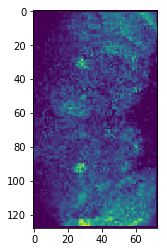

In [17]:
plt.imshow(numpy_brain[:,:,20,0])

In [ ]:
numpy_brain_int = np.asarray(numpy_brain, 'float64')

In [18]:
numpy_brain.shape

(128, 73, 49, 4891)

In [22]:
np.dtype(numpy_brain[0,0,0,0])

dtype('float64')

In [17]:
t0 = time()
flat_brain = numpy_brain.reshape(-1, 4891)
flat_brain = flat_brain.swapaxes(0,1)
x_points = np.arange(4891)
print(time() - t0)
#takes ~90sec

74.91596031188965


In [24]:
x_points.shape

(4891,)

In [23]:
flat_brain.shape

(4891, 457856)

In [40]:
457856/1000

457.856

In [32]:
print('Fitting polynomials.')
t0 = time()
poly_coef = np.polyfit(x_points, flat_brain[:,:1000], 9)
print(time() - t0)
#kernel died here!!!

Fitting polynomials.
0.19549918174743652


In [33]:
print('Fitting polynomials.')
t0 = time()
poly_coef = np.polyfit(x_points, flat_brain[:,:10000], 9)
print(time() - t0)
#kernel died here!!!

Fitting polynomials.
2.36099910736084


In [34]:
poly_coef.shape

(10, 10000)

In [ ]:
# will probably take 10min-ish
polys = []
t0 = time()
for i in range(flat_brain.shape[-1]):
    poly_coef = np.polyfit(x_points, flat_brain[:,i], 9)
    poly_func = np.poly1d(poly_coef)
    poly = poly_func(x_points)
    polys.append(poly)
print(time()-t0)

In [ ]:
y_dim = numpy_brain.shape[0]
x_dim = numpy_brain.shape[1]
z_dim = numpy_brain.shape[2]
t_dim = numpy_brain.shape[3]

t0 = time()
polys = np.asarray(polys)
polys = polys.reshape(y_dim, x_dim, z_dim, t_dim)
numpy_brain = numpy_brain - polys
print(time() - t0)

In [ ]:
polys = []
for i in range(poly_coef.shape[-1]):
    poly_func = np.poly1d(poly_coef[:,i])
    poly = poly_func(x_points)
    polys.append(poly)

In [21]:
brain = nib.load(brain_file).get_data()
#brain = brain[:,:,:,:,1]

In [24]:
np.shape(brain)

(128, 75, 60, 4076)

In [123]:
timeit np.mean(np.arange(1000))

14.1 µs ± 52.2 ns per loop (mean ± std. dev. of 7 runs, 100000 loops each)


In [121]:
%lsmagic

Available line magics:
%alias  %alias_magic  %autocall  %automagic  %autosave  %bookmark  %cat  %cd  %clear  %colors  %config  %connect_info  %cp  %debug  %dhist  %dirs  %doctest_mode  %ed  %edit  %env  %gui  %hist  %history  %killbgscripts  %ldir  %less  %lf  %lk  %ll  %load  %load_ext  %loadpy  %logoff  %logon  %logstart  %logstate  %logstop  %ls  %lsmagic  %lx  %macro  %magic  %man  %matplotlib  %mkdir  %more  %mv  %notebook  %page  %pastebin  %pdb  %pdef  %pdoc  %pfile  %pinfo  %pinfo2  %popd  %pprint  %precision  %profile  %prun  %psearch  %psource  %pushd  %pwd  %pycat  %pylab  %qtconsole  %quickref  %recall  %rehashx  %reload_ext  %rep  %rerun  %reset  %reset_selective  %rm  %rmdir  %run  %save  %sc  %set_env  %store  %sx  %system  %tb  %time  %timeit  %unalias  %unload_ext  %who  %who_ls  %whos  %xdel  %xmode

Available cell magics:
%%!  %%HTML  %%SVG  %%bash  %%capture  %%debug  %%file  %%html  %%javascript  %%js  %%latex  %%markdown  %%perl  %%prun  %%pypy  %%python  %%python

##### Lasso adds some slowness - can we ge away with making maps by just using our model to predict?

In [89]:
for z in range(12,13):
    print(z)

12


In [93]:
beta_len = 21 #MUST BE ODD
middle = int((beta_len - 1) / 2)

models = []
scores = []
for z in range(12,13):
    print('~~ z:{} ~~ '.format(z), end = '')
    Y = fictrac_interp[:,z]
    for x in range(128):
        print('{}. '.format(x), end = '')
        for y in range(88):
            voxel_activity = brain_z[y,x,z,:]
            X = toeplitz(voxel_activity,np.zeros(beta_len))
            X = np.roll(X, middle)
            model = linear_model.LinearRegression()
            X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=0)
            model.fit(X_train, y_train)
            #models.append(model)
            scores.append(model.score(X_test,y_test))

~~ z:12 ~~ 0. 1. 2. 3. 4. 5. 6. 7. 8. 9. 10. 11. 12. 13. 14. 15. 16. 17. 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35. 36. 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50. 51. 52. 53. 54. 55. 56. 57. 58. 59. 60. 61. 62. 63. 64. 65. 66. 67. 68. 69. 70. 71. 72. 73. 74. 75. 76. 77. 78. 79. 80. 81. 82. 83. 84. 85. 86. 87. 88. 89. 90. 91. 92. 93. 94. 95. 96. 97. 98. 99. 100. 101. 102. 103. 104. 105. 106. 107. 108. 109. 110. 111. 112. 113. 114. 115. 116. 117. 118. 119. 120. 121. 122. 123. 124. 125. 126. 127. 

In [73]:
from sklearn.model_selection import train_test_split

In [74]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=0)

In [84]:
t0 = time()
out = linear_model.LinearRegression().fit(X, Y)
out.score(X, Y)
print(time()-t0)

0.006238222122192383


In [87]:
t0 = time()
out = LassoLarsIC(criterion='bic').fit(X, Y)
out.score(X, Y)
print(time()-t0)

0.011588096618652344


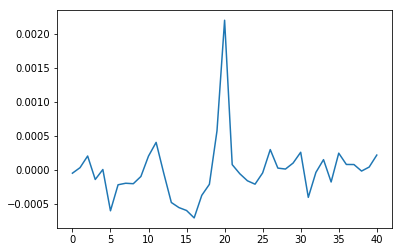

In [79]:
plt.plot(out.coef_)

In [53]:
from sklearn import datasets, linear_model
from sklearn.model_selection import cross_val_score

In [64]:
lasso = linear_model.Lasso()
print(cross_val_score(lasso, X, Y, cv=2))  

[-0.6559342  -0.25449258]


In [70]:
out = lasso.fit(X,Y)

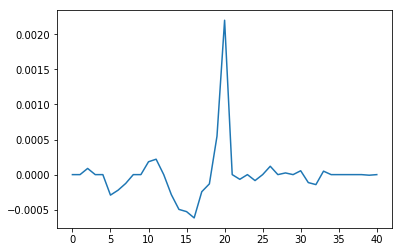

In [72]:
plt.plot(reg.coef_, label = 'CV')

In [ ]:
from sklearn.model_selection import KFold # import KFold
X = np.array([[1, 2], [3, 4], [1, 2], [3, 4]]) # create an array
y = np.array([1, 2, 3, 4]) # Create another array
kf = KFold(n_splits=2) # Define the split - into 2 folds 
kf.get_n_splits(X) # returns the number of splitting iterations in the cross-validator
print(kf) 
KFold(n_splits=2, random_state=None, shuffle=False)

In [68]:
reg = LassoCV(cv=5).fit(X, Y)

In [185]:
models2 = np.reshape(models, (128, 88))

In [94]:
scores = np.reshape(scores, (128, 88))

In [ ]:
save_file = os.path.join(root_path, fly_folders[0], 'multivariate_analysis.nii')
brain_to_save = np.swapaxes(scores, 0, 2)
ants.image_write(ants.from_numpy(brain_to_save), save_file)

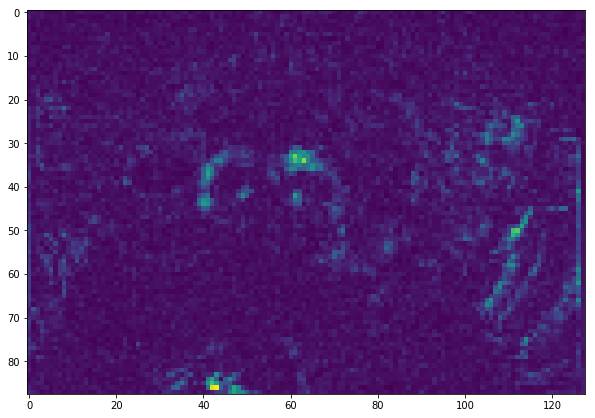

In [92]:
fig = plt.figure(figsize=(10,10))
plt.imshow(scores.swapaxes(0,1))

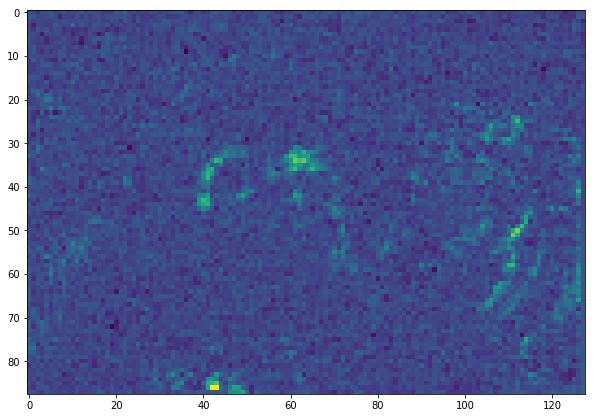

In [95]:
fig = plt.figure(figsize=(10,10))
plt.imshow(scores.swapaxes(0,1))

In [184]:
len(models)

11264

# Correlate voxel activity to fictrac outputs

### First, interpolate fictrac data to match imaging times ###

In [11]:
fps = 50
camera_rate = 1/fps * 1000 # camera frame rate in ms
dur = 30 * 60 * 1000 # experiment duration in ms


raw_fictrac_times = np.arange(0,dur,camera_rate)
# Warning: interp1d set to fill in out of bounds times
fictrac_interp_temp = interp1d(raw_fictrac_times, df['speed'], bounds_error = False)
fictrac_interp = fictrac_interp_temp(timestamps)

# Replace Nans with zeros (for later code)
np.nan_to_num(fictrac_interp, copy=False);

### Verify interpolation

Text(0.5, 1.0, 'zoomin')

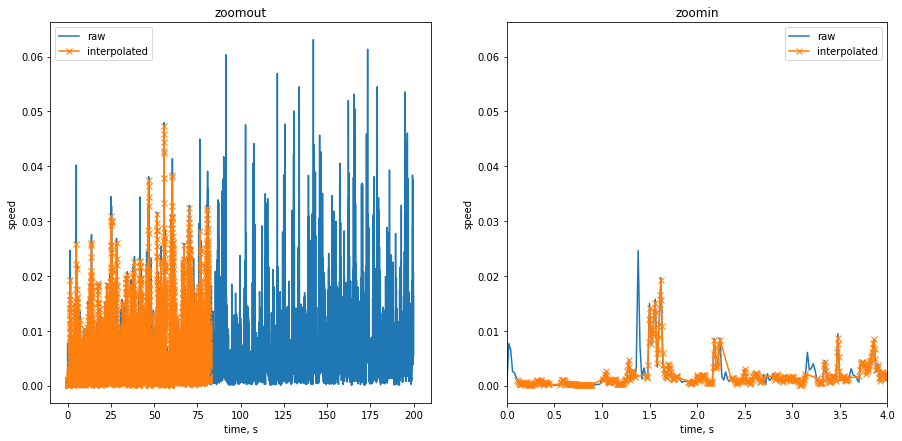

In [12]:
# Verify interpolation is working well, and visualize if "kind" is optimal:
fictrac_interp_flat = np.ndarray.flatten(fictrac_interp)
timestamps_flat = np.ndarray.flatten(timestamps)

fig = plt.figure(figsize=(15,7))

start = 0
end = 10000

plt.subplot(1,2,1)
plt.plot(raw_fictrac_times[start:end]/1000, df['speed'][start:end], label = 'raw')
plt.plot(timestamps_flat[start:end]/1000, fictrac_interp_flat[start:end], label = 'interpolated', marker='x')
plt.legend()
plt.title('zoomout')
plt.xlabel('time, s')
plt.ylabel('speed')

plt.subplot(1,2,2)
plt.plot(raw_fictrac_times[start:end]/1000, df['speed'][start:end], label = 'raw')
plt.plot(timestamps_flat[start:end]/1000, fictrac_interp_flat[start:end], label = 'interpolated', marker='x')
plt.xlim(0,4)
plt.legend()
plt.xlabel('time, s')
plt.ylabel('speed')
plt.title('zoomin')

##### looks good. note: sampling of fictrac data is in temporal bursts, representing one volume (z-stack). note: consider temporally smoothing fictrac data

### Correlate each voxel

In [18]:
np.shape(np.asarray(brain))

()

In [20]:
np.asarray(brain)

array(ANTsImage
	 Pixel Type : float
	 Components : 1
	 Dimensions : (88, 128, 55, 4006)
	 Spacing    : (1.0, 1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
, dtype=object)

In [29]:
cor_brain = correlate_brain(brain=brain, to_cor=fictrac_interp)

flattening...
brain_for_cor shape: (11264, 55, 4006)
done flattening.
correlating...
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
done correlating.
final touches...
cors shape:  (55, 11265)
after removal: (55, 11264)
done.


In [20]:
### Calculate z-scored brain

brain_array = np.asarray(nib_brain)
meanbrain = brain.mean(3)

brain_std = np.std(brain_array, axis=3)

brain_z = (brain_array-meanbrain[:,:,:,None])/brain_std[:,:,:,None]

In [75]:
z=20
test = (np.corrcoef(brain_for_cor[:,z,:], fictrac_interp[:,z]))

In [38]:
np.shape(cor_brain)

(55, 88, 128)

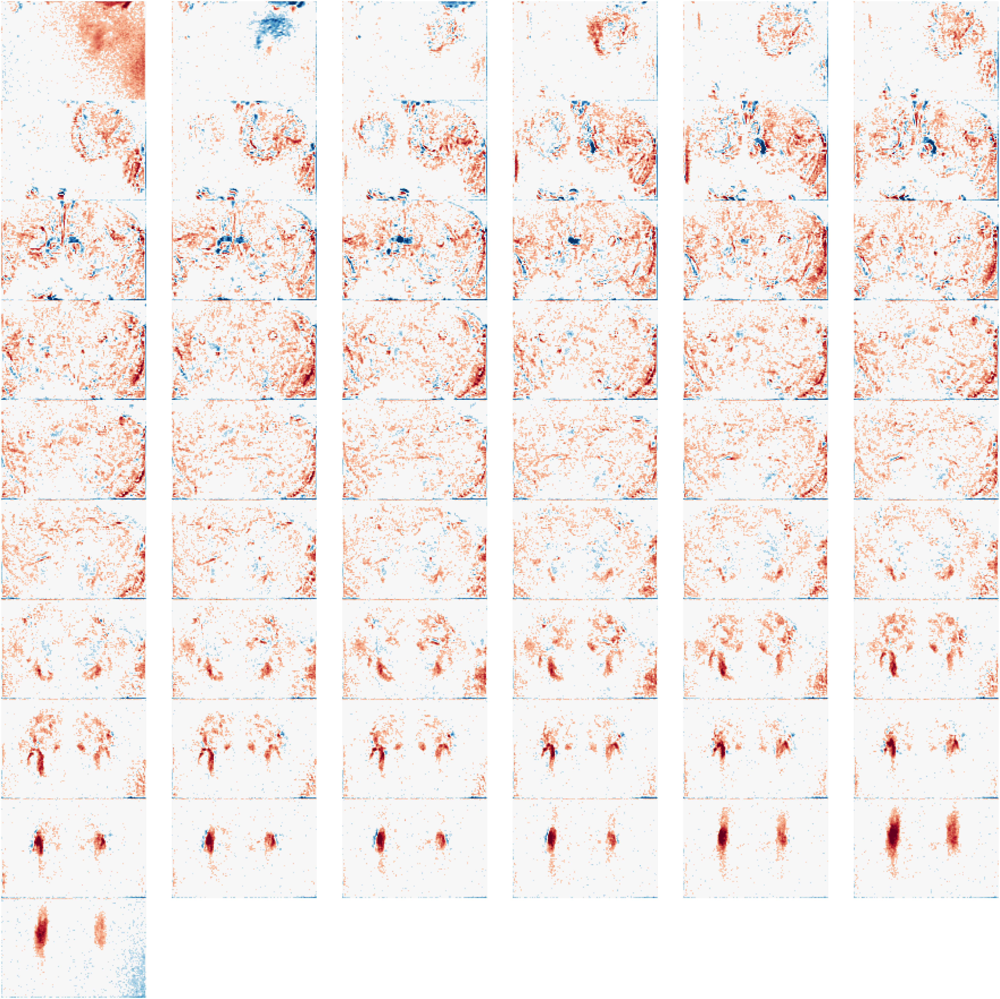

In [32]:
fig = plt.figure(figsize=(100,100))
threshold_high = 0.04
threshold_low = -0.04
plt.set_cmap('RdBu')
for z in range(55):
    plt.subplot(10,6,z+1)
    data = np.copy(cor_brain[z,:,:])
    data[np.where((data<threshold_high) & (data>threshold_low))]=0

    plt.imshow(data, vmin = -0.2, vmax = 0.2)
    
    cur_axes = plt.gca()
    cur_axes.axes.get_xaxis().set_visible(False)
    cur_axes.axes.get_yaxis().set_visible(False)
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.axis('off')

NameError: name 'cor_brain' is not defined

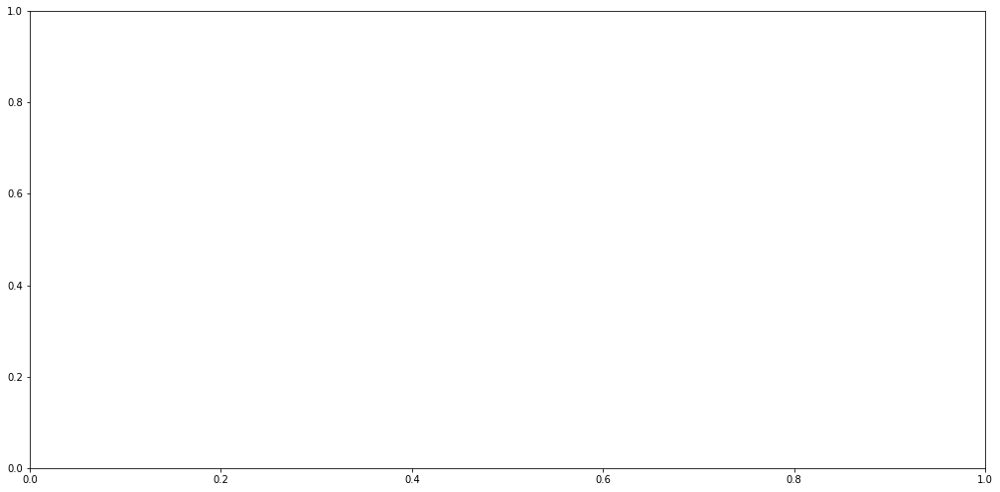

In [60]:
fig = plt.figure(figsize=(100,100))
threshold_high = 0.04
threshold_low = -0.04
plt.set_cmap('RdBu')
for z in range(41):
    plt.subplot(10,5,z+1)
    data = np.copy(cor_brain[:,:,z])
    data[np.where((data<threshold_high) & (data>threshold_low))]=0

    plt.imshow(data, vmin = -0.2, vmax = 0.2)
    
    cur_axes = plt.gca()
    cur_axes.axes.get_xaxis().set_visible(False)
    cur_axes.axes.get_yaxis().set_visible(False)
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.axis('off')

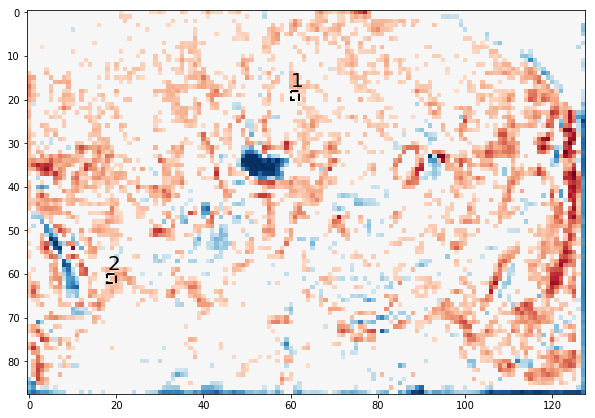

In [36]:
fig = plt.figure(figsize=(10,10))

threshold_high = 0.04
threshold_low = -0.04
plt.set_cmap('RdBu')
z = 15

data = np.copy(cor_brain[z,:,:])
data[np.where((data<threshold_high) & (data>threshold_low))]=0

ax = fig.add_subplot(111)
ax.imshow(data, vmin = -0.2, vmax = 0.2)

boxes = [(60,18),(18,60)]
for num, box in enumerate(boxes):
    rect = patches.Rectangle((box[0],box[1]),2,2,linewidth=2,edgecolor='black',facecolor='none',ls='--')
    ax.add_patch(rect)
    ax.annotate(num+1, fontsize=20, xy=(box[0], box[1]-1),xycoords='data')

In [13]:
cor_brain[12,18,60]

0.12787421837511093

In [14]:
cor_brain.shape

(41, 65, 129)

In [15]:
brain_z.shape

(65, 129, 41, 5805)

In [ ]:
# cor_brain is [z,y,x]
# brain_z is [y,x,z,t]

In [21]:
y = 18
x = 60
z= 12

smo = gaussian_filter(brain_z[y,x,z,:],sigma=2,mode='nearest')

In [26]:
z_fictrac = (fictrac_interp[:,12]-np.mean(fictrac_interp[:,12]))/np.std(fictrac_interp[:,12])

(5, 8)

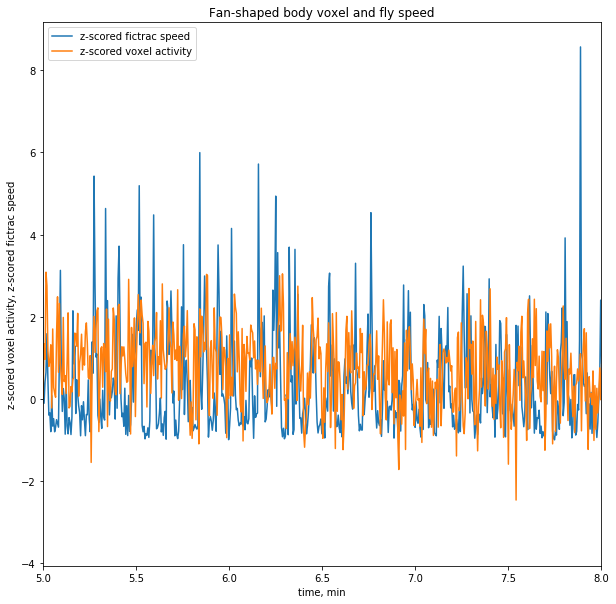

In [31]:
fig = plt.figure(figsize=(10,10))
#plt.plot(brain_z[60,18,12,:])
plt.plot(timestamps[:,12]/1000/60, z_fictrac, label = 'z-scored fictrac speed')
plt.plot(timestamps[:,12]/1000/60, brain_z[y,x,z,:], label = 'z-scored voxel activity')
plt.legend()
plt.ylabel('z-scored voxel activity, z-scored fictrac speed')
plt.xlabel('time, min')
plt.title('Fan-shaped body voxel and fly speed')
plt.xlim(5,8)

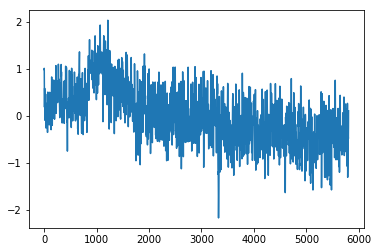

In [23]:
plt.plot(smo)

(array([  1.,   1.,   1.,   0.,   0.,   0.,   1.,   1.,   0.,   0.,   1.,
          1.,   2.,   3.,   4.,   3.,   7.,   4.,   6.,   8.,   9.,  13.,
         15.,  15.,  22.,  19.,  31.,  27.,  34.,  53.,  46.,  75.,  75.,
         76.,  90.,  84., 107., 118., 104., 126., 127., 144., 135., 161.,
        148., 166., 155., 146., 165., 157., 171., 179., 164., 147., 154.,
        170., 130., 147., 141., 131., 113., 109., 117., 117., 104.,  86.,
         88.,  95.,  93.,  70.,  54.,  42.,  61.,  70.,  55.,  54.,  42.,
         44.,  24.,  25.,  18.,  28.,  18.,   8.,  15.,   3.,   3.,   6.,
          4.,   2.,   2.,   2.,   3.,   3.,   0.,   0.,   2.,   1.,   2.,
          1.]),
 array([-2.17531872, -2.13327974, -2.09124077, -2.04920179, -2.00716282,
        -1.96512384, -1.92308487, -1.88104589, -1.83900692, -1.79696795,
        -1.75492897, -1.71289   , -1.67085102, -1.62881205, -1.58677307,
        -1.5447341 , -1.50269512, -1.46065615, -1.41861717, -1.3765782 ,
        -1.33453922, -1.29

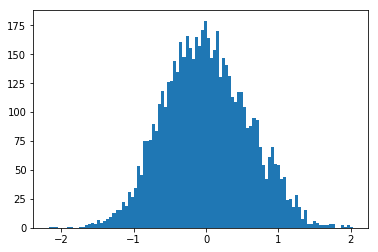

In [25]:
plt.hist(smo, bins = 100)

### Try cross-correlation

Text(0.5, 0, 'time, s')

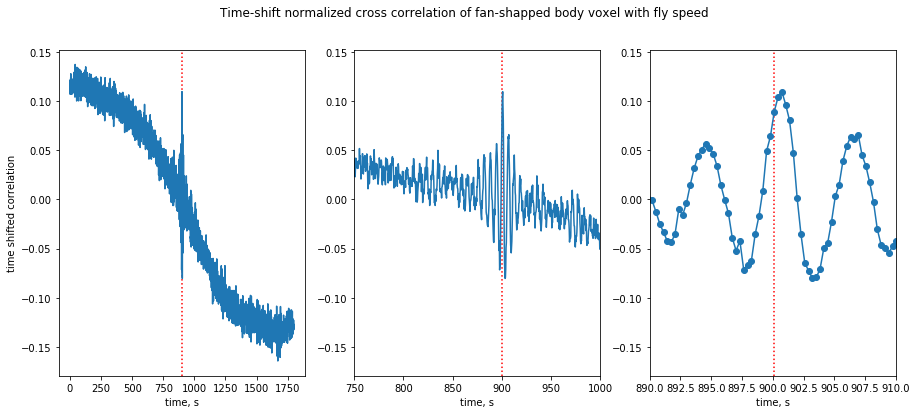

In [34]:
fig = plt.figure(figsize=(15,6))
plt.suptitle('Time-shift normalized cross correlation of fan-shapped body voxel with fly speed')

a = brain_z[18,60,12,:]
b = fictrac_interp[:,12]
cross_cor = signal.correlate(a, b,'same')/np.sqrt(np.sum(np.square(a))*np.sum(np.square(b)))

zero_shift = int(np.floor(len(cross_cor)/2))
plt.subplot(131)
plt.axvline(timestamps[zero_shift,12]/1000, color='r', linestyle=':')
plt.plot(timestamps[:,12]/1000, cross_cor)
plt.xlabel('time, s')
plt.ylabel('time shifted correlation')

plt.subplot(132)
plt.axvline(timestamps[zero_shift,12]/1000, color='r', linestyle=':')
plt.plot(timestamps[:,12]/1000, cross_cor)
plt.xlim(750,1000)
plt.xlabel('time, s')

plt.subplot(133)
plt.axvline(timestamps[zero_shift,12]/1000, color='r', linestyle=':')
plt.plot(timestamps[:,12]/1000, cross_cor, marker='o')
plt.xlim(890,910)
plt.xlabel('time, s')

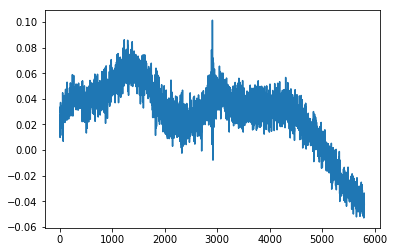

In [157]:
a = brain_z[60,18,12,:]
b = fictrac_interp[:,12]
cor = signal.correlate(a, b,'same')/np.sqrt(np.sum(np.square(a))*np.sum(np.square(b)))
plt.plot(cor)

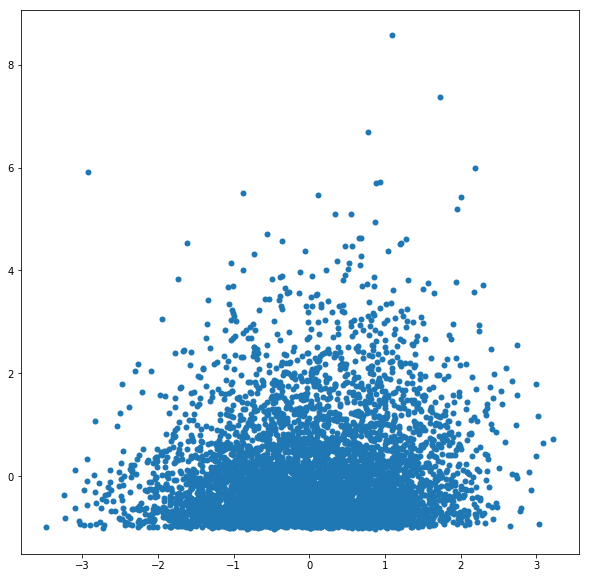

In [47]:
fig = plt.figure(figsize=(10,10))
plt.scatter(brain_z[18,60,12,:], z_fictrac, linewidths=0.0002)

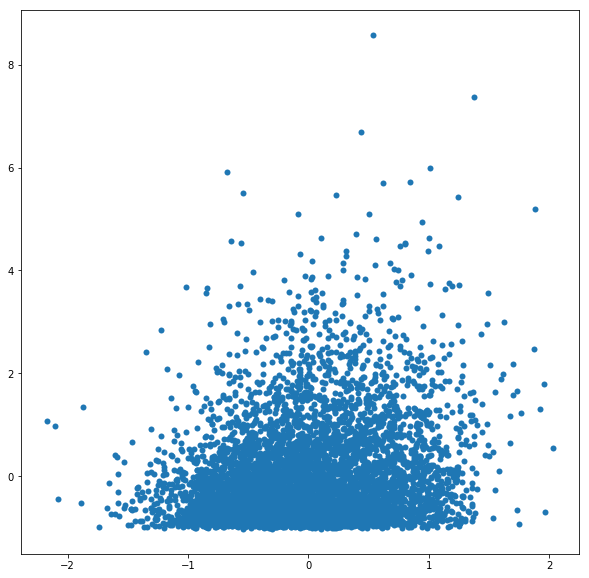

In [48]:
fig = plt.figure(figsize=(10,10))
plt.scatter(smo, z_fictrac, linewidths=0.0002)

In [46]:
timestamps[np.argmax(cross_cor[2000:])+2000,12] - timestamps[zero_shift,12]

620.2332439998863

In [41]:
timestamps[np.argmax(cross_cor[2000:]),12]

280510.488361

In [44]:
zero_shift

2902

In [43]:
timestamps[zero_shift,12]

900123.499117

In [45]:
timestamps.shape

(5805, 41)

In [40]:
np.argmax(cross_cor[2000:])

904

In [38]:
len(cross_cor)

5805

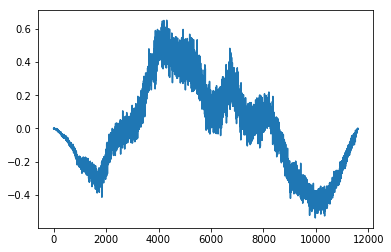

In [150]:
cross_cor = np.convolve(brain_z[60,18,12,:], fictrac_interp[:,12])
plt.plot(cross_cor)

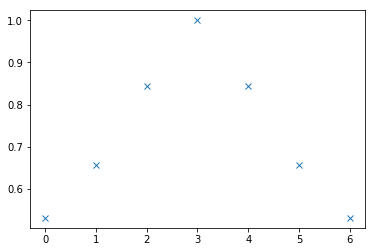

In [156]:
a = [1,2,3,2,2,3,1]
b = [1,2,3,2,2,3,1]
c = signal.correlate(a,b,'same')/np.sqrt(np.sum(np.square(a))*np.sum(np.square(b)))
plt.plot(c,'x')

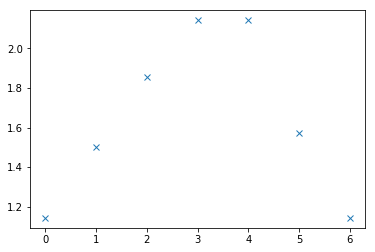

In [155]:
a = [1,2,3,2,2,3,1]
b = [1,2,3,2,2,3,1]
c = np.convolve(a,b,'same')/np.sqrt(np.sum(a)*np.sum(b))
plt.plot(c,'x')

In [100]:
int(np.floor(len(a)/2))

3

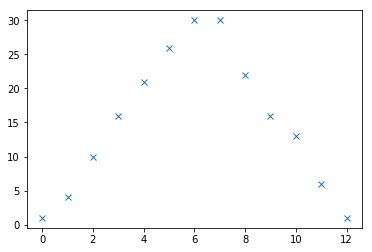

In [94]:
a = [1,2,3,2,2,3,1]
b = [1,2,3,2,2,3,1]
c = np.convolve(a,b)
plt.plot(c,'x')

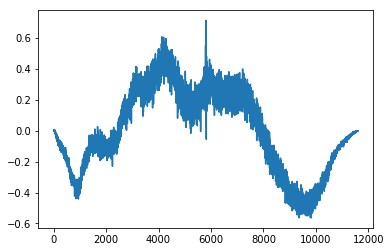

In [79]:
plt.plot(cross_cor)

In [86]:
len(cross_cor)

5805

In [82]:
len(brain_z[60,18,12,:])

5805

In [68]:
fictrac_interp.shape

(5805, 41)

Text(0, 0.5, '|Y(freq)|')

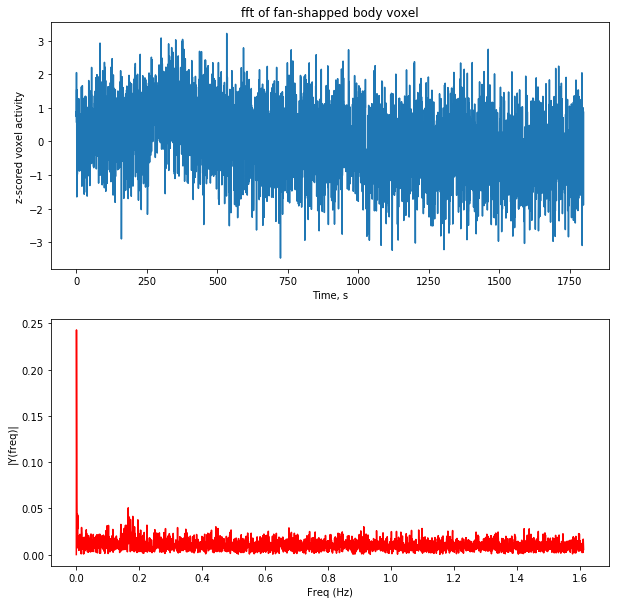

In [33]:
Fs = 3.225;  # sampling rate
Ts = 1.0/Fs; # sampling interval
t = np.arange(0,1800,Ts) # time vector

y = brain_z[18,60,12,:]

n = len(y) # length of the signal
k = np.arange(n)
T = n/Fs
frq = k/T # two sides frequency range
frq = frq[range(int(n/2))] # one side frequency range

Y = np.fft.fft(y)/n # fft computing and normalization
Y = Y[range(int(n/2))]


fig = plt.figure(figsize=(10,10))
plt.subplot(211)
plt.plot(t,y)
plt.xlabel('Time, s')
plt.ylabel('z-scored voxel activity')
plt.title('fft of fan-shapped body voxel')

plt.subplot(212)
plt.plot(frq,abs(Y),'r') # plotting the spectrum
plt.xlabel('Freq (Hz)')
plt.ylabel('|Y(freq)|')
#plt.ylim(0,.002)
#plt.xlim(-.1,.5)

(0, 0.002)

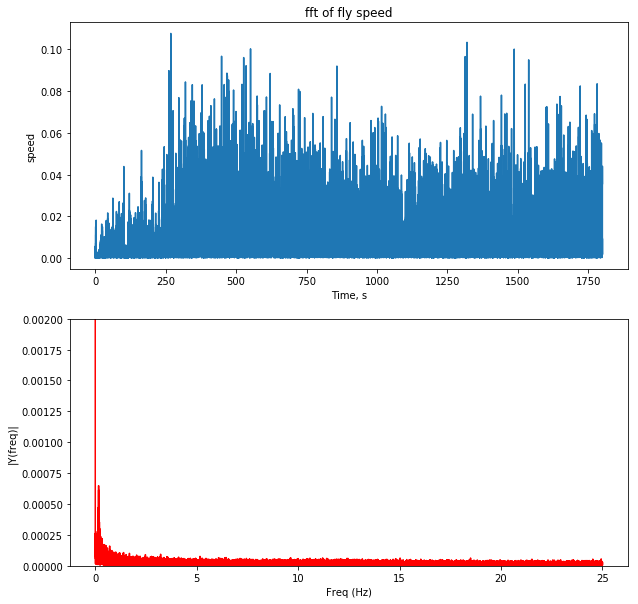

In [59]:
Fs = 50;  # sampling rate
Ts = 1.0/Fs; # sampling interval
t = np.arange(0,1800,Ts) # time vector

y = df['speed']

n = len(y) # length of the signal
k = np.arange(n)
T = n/Fs
frq = k/T # two sides frequency range
frq = frq[range(int(n/2))] # one side frequency range

Y = np.fft.fft(y)/n # fft computing and normalization
Y = Y[range(int(n/2))]


fig = plt.figure(figsize=(10,10))
plt.subplot(211)
plt.plot(t,y)
plt.xlabel('Time, s')
plt.ylabel('speed')
plt.title('fft of fly speed')

plt.subplot(212)
plt.plot(frq,abs(Y),'r') # plotting the spectrum
plt.xlabel('Freq (Hz)')
plt.ylabel('|Y(freq)|')
plt.ylim(0,.002)

In [55]:
1/6

0.16666666666666666

In [43]:
len(df['speed'])

90000

Text(0, 0.5, '|Y(freq)|')

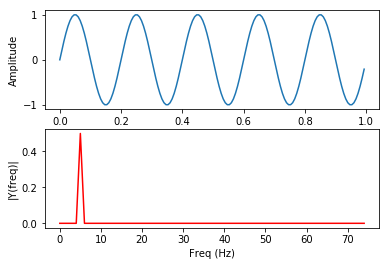

In [193]:
Fs = 150.0;  # sampling rate
Ts = 1.0/Fs; # sampling interval
t = np.arange(0,1,Ts) # time vector

ff = 5;   # frequency of the signal
y = np.sin(2*np.pi*ff*t)

n = len(y) # length of the signal
k = np.arange(n)
T = n/Fs
frq = k/T # two sides frequency range
frq = frq[range(int(n/2))] # one side frequency range

Y = np.fft.fft(y)/n # fft computing and normalization
Y = Y[range(int(n/2))]

fig, ax = plt.subplots(2, 1)
ax[0].plot(t,y)
ax[0].set_xlabel('Time')
ax[0].set_ylabel('Amplitude')
ax[1].plot(frq,abs(Y),'r') # plotting the spectrum
ax[1].set_xlabel('Freq (Hz)')
ax[1].set_ylabel('|Y(freq)|')

In [187]:
range(150/2)

TypeError: 'float' object cannot be interpreted as an integer

In [64]:
np.shape(cors)

(41, 8386)

In [67]:
cors.shape

(41, 8385)

In [30]:
np.shape(brain)

(65, 129, 41, 5805)

In [42]:
65*129

8385

In [36]:
np.shape(cors[0])

()

In [19]:
fictrac_interp.shape

(5805, 41)

In [23]:
cors.shape

(8386, 8386)

In [33]:
y = [1,2,3]
y[:-1]

[1, 2]

In [20]:
brain_for_cor.shape

(343785, 5805)

In [24]:
65*129

8385

In [15]:
brain_array

array([[[[   0.      ,    0.      ,   15.898038, ...,    0.      ,
             0.      ,    0.      ],
         [  20.850292,   37.836582,   23.153685, ...,    0.      ,
             0.      ,    0.      ],
         [  29.60851 ,   42.07411 ,   27.051884, ...,    0.      ,
             0.      ,    0.      ],
         ...,
         [  25.429787,   25.042442,   27.32122 , ...,    0.      ,
             0.      ,    0.      ],
         [  38.540665,   28.238676,   25.288399, ...,    0.      ,
             0.      ,    0.      ],
         [  26.020334,   24.632544,   27.372276, ...,    0.      ,
             0.      ,    0.      ]],

        [[   0.      ,    0.      ,   20.415384, ...,    0.      ,
             0.      ,    0.      ],
         [  22.61609 ,   23.320646,   22.29129 , ...,    0.      ,
             0.      ,    0.      ],
         [  24.072344,   24.845766,   22.256298, ...,    0.      ,
             0.      ,    0.      ],
         ...,
         [  29.051365,   22.14195 

In [97]:
from scipy.signal import correlate

In [98]:
correlate(a,b)

array([ 6, 13, 20, 11,  4])

In [92]:
np.nan_to_num(y)

array([1., 2., 0.])

In [91]:
x = [[1,2,1],[1,3,3],[1,1,2],[1,2,3]]
y = [1,2,np.nan]
output=np.corrcoef(x,y)
output
#output[0,3]
#lets say x is a 2d matrix of all brain responses, while y is the fictrac data

array([[ 1.       ,  0.5      , -0.5      ,  0.       ,        nan],
       [ 0.5      ,  1.       ,  0.5      ,  0.8660254,        nan],
       [-0.5      ,  0.5      ,  1.       ,  0.8660254,        nan],
       [ 0.       ,  0.8660254,  0.8660254,  1.       ,        nan],
       [       nan,        nan,        nan,        nan,        nan]])

In [58]:
output[-1,3]

1.0

In [59]:
x = [[1,2,3],[1,2,3],[1,2,3],[1,1,0]]
y = [1,2,3]
output=np.corrcoef(x,y)
output
#output[:,0]
#lets say x is a 2d matrix of all brain responses, while y is the fictrac data

array([[ 1.       ,  1.       ,  1.       , -0.8660254,  1.       ],
       [ 1.       ,  1.       ,  1.       , -0.8660254,  1.       ],
       [ 1.       ,  1.       ,  1.       , -0.8660254,  1.       ],
       [-0.8660254, -0.8660254, -0.8660254,  1.       , -0.8660254],
       [ 1.       ,  1.       ,  1.       , -0.8660254,  1.       ]])

In [62]:
print(output[-1,3]) # gives corr with x[3]
print(output[-1,2]) # gives corr with x[2]

1.0
0.8660254037844387


In [99]:
from scipy.stats.stats import pearsonr

In [95]:
np.shape(fictrac_interp)

(5805, 41)

In [103]:
pearsonr(a,b)[0]

0.8660254037844387

In [104]:
np.corrcoef(a,b)

array([[1.       , 0.8660254],
       [0.8660254, 1.       ]])

In [80]:
np.shape(brain)

(65, 129, 41, 5805)

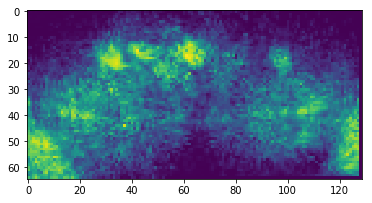

In [82]:
plt.imshow(brain[:,:,20,10])

(array([2.0784e+04, 1.6473e+04, 1.1695e+04, 8.6490e+03, 6.9580e+03,
        5.2450e+03, 4.0950e+03, 3.0920e+03, 2.5230e+03, 2.0560e+03,
        1.6180e+03, 1.2940e+03, 1.1040e+03, 8.9500e+02, 7.6100e+02,
        5.7400e+02, 4.6800e+02, 3.0300e+02, 2.8200e+02, 2.5100e+02,
        1.6500e+02, 1.3600e+02, 1.1900e+02, 9.2000e+01, 9.1000e+01,
        4.2000e+01, 4.4000e+01, 3.2000e+01, 2.1000e+01, 2.5000e+01,
        2.3000e+01, 1.4000e+01, 1.4000e+01, 8.0000e+00, 7.0000e+00,
        1.0000e+01, 5.0000e+00, 5.0000e+00, 9.0000e+00, 3.0000e+00,
        1.0000e+00, 3.0000e+00, 2.0000e+00, 0.0000e+00, 4.0000e+00,
        1.0000e+00, 2.0000e+00, 0.0000e+00, 1.0000e+00, 1.0000e+00]),
 array([0.        , 0.00215328, 0.00430656, 0.00645984, 0.00861312,
        0.0107664 , 0.01291968, 0.01507296, 0.01722624, 0.01937952,
        0.0215328 , 0.02368608, 0.02583936, 0.02799264, 0.03014592,
        0.0322992 , 0.03445248, 0.03660576, 0.03875904, 0.04091232,
        0.0430656 , 0.04521888, 0.04737216, 0.

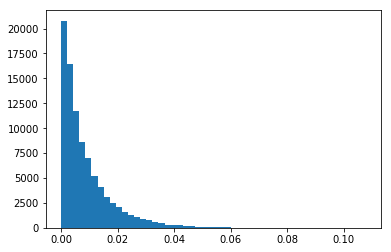

In [62]:
plt.hist(df['speed'], bins = 50)

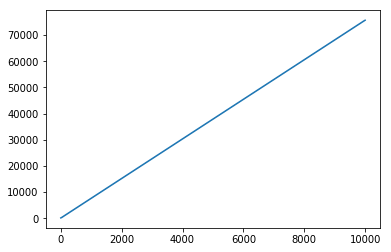

In [58]:
plt.plot(timestamps_flat[:10000])

In [34]:
raw_fictrac_times

array([0.00000e+00, 2.00000e+01, 4.00000e+01, ..., 1.79994e+06,
       1.79996e+06, 1.79998e+06])

In [45]:
fictrac_interp[:100]

array([[0.00133964, 0.00219922, 0.00305879, ..., 0.00074376, 0.00085409,
        0.00074002],
       [0.00129615, 0.00133133, 0.00108424, ..., 0.00103048, 0.00080689,
        0.0005833 ],
       [0.00039315, 0.00043029, 0.00046743, ..., 0.00042507, 0.00046505,
        0.00037247],
       ...,
       [0.000792  , 0.00075597, 0.00071995, ..., 0.00049251, 0.00042764,
        0.00050514],
       [0.00074059, 0.00066095, 0.00082974, ..., 0.00338834, 0.00350128,
        0.00361422],
       [0.00122621, 0.00120313, 0.00118005, ..., 0.00600691, 0.00570944,
        0.00483739]])

In [21]:
raw_fictrac_times[-1]

1799980.0

In [26]:
np.shape(timestamps)

(5805, 41)

In [25]:
np.shape(fictrac_interp)

(5805, 41)

In [30]:
np.shape(nib_brain)

(65, 129, 41, 5805)

In [98]:
t1s = []
t2s = []
t3s = []
t4s = []
t5s = [time()]
motCorr_brain = []
#for i in range(np.shape(nib_brain)[3]):
t0 = time()
for i in range(10):
    print(i)
    t1s.append(time())
    brain_slice = ants.from_numpy(nib_brain[:,:,:,i])
    t2s.append(time())
    motCorr_slice = ants.registration(meanbrain, brain_slice, type_of_transform='SyN')
    t3s.append(time())
    motCorr_slice = motCorr_slice['warpedmovout'].numpy()[:,:,z]
    t4s.append(time())
    motCorr_brain.append(motCorr_slice)
    if len(t5s)<10:
        t5s.append(time())

        
t1s = np.asarray(t1s)
t2s = np.asarray(t2s)
t3s = np.asarray(t3s)
t4s = np.asarray(t4s)
t5s = np.asarray(t5s)

print('t1:', np.mean(t1s-t5s))
print('t2:', np.mean(t2s-t1s))
print('t3:', np.mean(t3s-t2s))
print('t4:', np.mean(t4s-t3s))
print('t5:', np.mean(t5s-t4s))

0
1
2
3
4
5
6
7
8
9
t1: 0.0001726388931274414
t2: 0.0018339872360229493
t3: 2.993111252784729
t4: 0.0004848957061767578
t5: -2.995602774620056


In [68]:
nib_brain_slice = nib_brain[:,:,:,0]
brain_slice = ants.from_numpy(nib_brain_slice)

In [100]:
(3*5000)/60/60

4.166666666666667

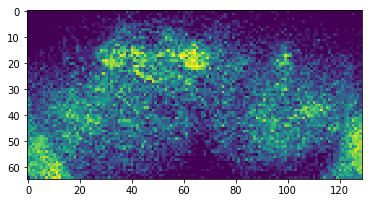

In [21]:
plt.imshow(nib_brain[:,:,20,1000])

In [54]:
np.shape(meanbrain)

(65, 129, 41)

In [67]:
ants.viz.surface(meanbrain)

TypeError: 'module' object is not callable

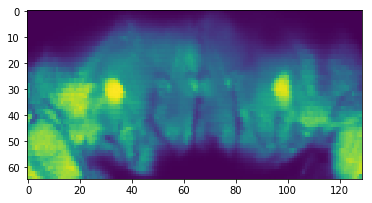

In [31]:
plt.imshow(meanbrain[:,:,10])

In [ ]:
'matrix_to_images',

In [69]:
motCorr_brain = ants.registration(meanbrain, brain_slice, type_of_transform='SyN', verbose=True)

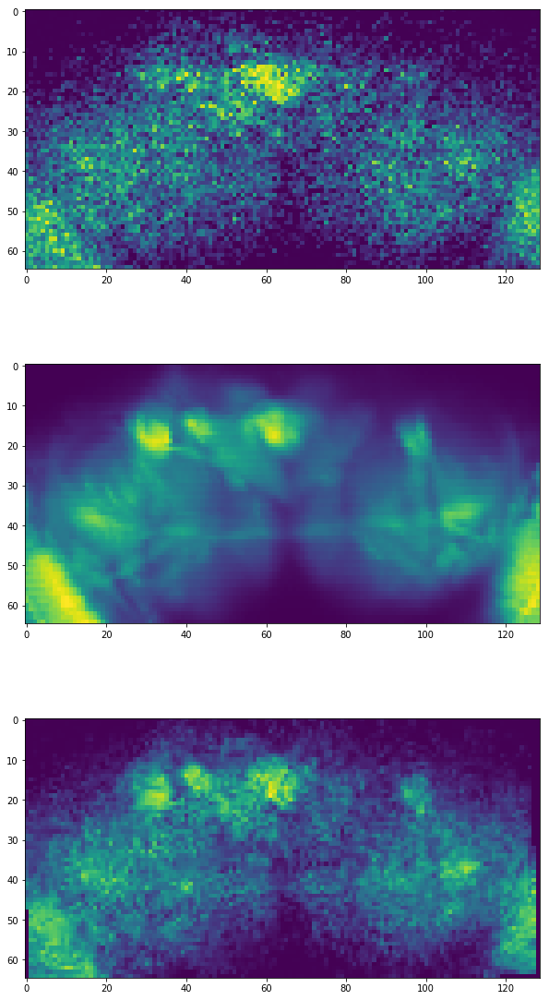

In [90]:
z=20
fig = plt.figure(figsize=(10,20))

plt.subplot(3,1,1)
plt.imshow(brain_slice[:,:,z])

plt.subplot(3,1,2)
plt.imshow(meanbrain[:,:,z])

plt.subplot(3,1,3)
plt.imshow(motCorr_brain['warpedmovout'].numpy()[:,:,z])

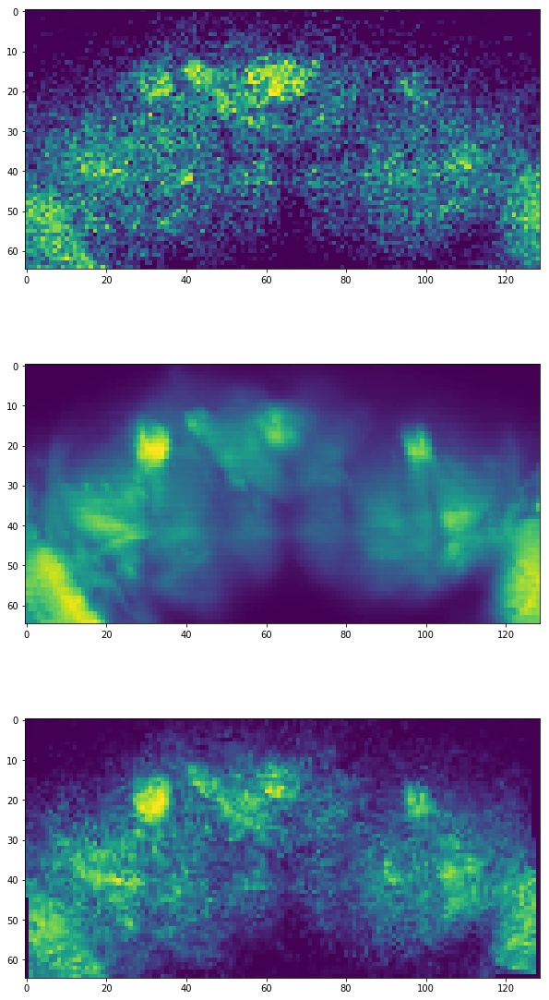

In [93]:
z=18
fig = plt.figure(figsize=(10,20))

plt.subplot(3,1,1)
plt.imshow(brain_slice[:,:,z])

plt.subplot(3,1,2)
plt.imshow(meanbrain[:,:,z])

plt.subplot(3,1,3)
plt.imshow(motCorr_brain['warpedmovout'].numpy()[:,:,z])

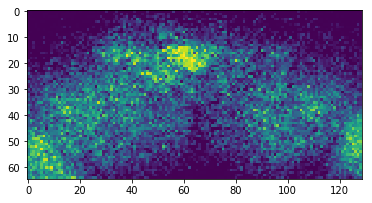

In [80]:
plt.imshow(brain_slice[:,:,20])

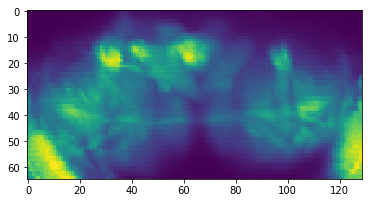

In [81]:
plt.imshow(meanbrain[:,:,20])

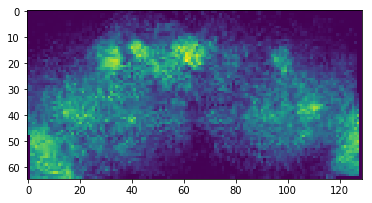

In [79]:
plt.imshow(motCorr_brain['warpedmovout'].numpy()[:,:,20])

In [76]:
dir(ants.viz.plot)

['__annotations__',
 '__call__',
 '__class__',
 '__closure__',
 '__code__',
 '__defaults__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__get__',
 '__getattribute__',
 '__globals__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__kwdefaults__',
 '__le__',
 '__lt__',
 '__module__',
 '__name__',
 '__ne__',
 '__new__',
 '__qualname__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__']

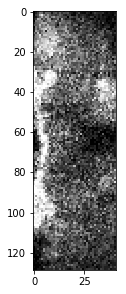

In [73]:
brain_slice.plot()

In [ ]:
motCorr_brain

In [46]:
motCorr_brain['warpedfixout']

ANTsImage
	 Pixel Type : float
	 Components : 1
	 Dimensions : (65, 129, 41, 5805)
	 Spacing    : (1.0, 1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]

In [24]:
dir(ants)

['__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 'abp_n4',
 'affine_initializer',
 'allclose',
 'ants_image',
 'ants_image_io',
 'ants_metric',
 'ants_metric_io',
 'ants_transform',
 'ants_transform_io',
 'apply_ants_transform',
 'apply_ants_transform_to_image',
 'apply_ants_transform_to_point',
 'apply_ants_transform_to_vector',
 'apply_transforms',
 'atropos',
 'bias_correction',
 'channels',
 'compose_ants_transforms',
 'convolve_image',
 'copy_image_info',
 'core',
 'create_ants_metric',
 'create_ants_transform',
 'create_jacobian_determinant_image',
 'create_tiled_mosaic',
 'create_warped_grid',
 'crop_image',
 'crop_indices',
 'decomposition',
 'decrop_image',
 'denoise_image',
 'eig_seg',
 'from_numpy',
 'fsl2antstransform',
 'get_ants_data',
 'get_ants_data_files',
 'get_ants_transform_fixed_parameters',
 'get_ants_transform_parameters',
 'get_center_of_mass',
 'get_centroids',
 'get_

In [5]:
ants.plot(brain)

Exception: Unable to show 3D-vector Image

In [6]:
brain = ants.image_read(brain_file, pixeltype='float')

ValueError: unsupported pixeltype short

In [4]:
brain = ants.image_read(ants.get_ants_data(brain_file))

ValueError: ('File doesnt exist. Options: ', ['r16slice.jpg', 'softwareVersions.csv', 'mni.nii.gz', 'surface.nii.gz', 'mnia.nii.gz', 'r62slice.jpg', 'oasis_mni.nii.gz', 'r64slice.jpg', 'simple.jpg', 'r27slice.jpg', 'powers_mni_itk.csv', 'surf.nii.gz', 'r30slice.jpg', 'function.nii.gz', 'ch2.nii.gz', 'r85slice.jpg'])

In [3]:
fname1 = ants.get_ants_data('r16')
fname2 = ants.get_ants_data('r64')
print(fname1)

/home/users/brezovec/.antspy/r16slice.jpg


In [4]:
img1 = ants.image_read(fname1)
img2 = ants.image_read(fname2)
print(img1)

ANTsImage
	 Pixel Type : float
	 Components : 1
	 Dimensions : (256, 256)
	 Spacing    : (1.0, 1.0)
	 Origin     : (0.0, 0.0)
	 Direction  : [1. 0. 0. 1.]



In [5]:
arr_4d = np.random.randn(70,70,70,10).astype('float32')
img_fmri = ants.from_numpy(arr_4d, has_components=True)
print(img_fmri)

ANTsImage
	 Pixel Type : float
	 Components : 10
	 Dimensions : (70, 70, 70)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]



In [6]:
# clone
img = ants.image_read(fname1)
img2 = img.clone()

# convert to numpy
img_arr = img.numpy()

# create another image with same properties but different data
img2 = img.new_image_like(img_arr*2)

# save to file
# img.to_file(...)

# many useful things:
img.median()
img.std()
img.argmin()
img.argmax()
img.flatten()
img.nonzero()
img.unique()

# do any operations directly on ANTsImage types
img3 = img2 - img
img3 = img2 > img
img3 = img2 / img
img3 = img2 == img


# change any physical properties
img4 = img.clone()
print(img4.spacing)
img4.set_spacing((1,1))
print(img4.spacing)

# test if two images are allclose in values
issame = ants.allclose(img,img2)

# test if two images have same physical space
issame_phys = ants.image_physical_space_consistency(img,img2)

(1.0, 1.0)
(1.0, 1.0)


/home/users/brezovec/.local/lib/python3.6/site-packages/ants/core/ants_image.py:404: RuntimeWarning: invalid value encountered in true_divide
  new_array = this_array / other


dict_keys(['segmentation', 'probabilityimages'])


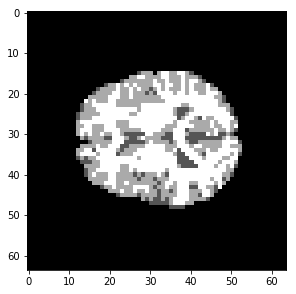

In [7]:
img = ants.image_read(ants.get_ants_data('r16'))
img = ants.resample_image(img, (64,64), 1, 0)
mask = ants.get_mask(img)
img_seg = ants.atropos(a=img, m='[0.2,1x1]', c='[2,0]', 
                       i='kmeans[3]', x=mask)
print(img_seg.keys())
ants.plot(img_seg['segmentation'])

In [8]:
brain_file = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20181217/fly2/anatomy/TSeries-12172018-1322-002.nii'

In [9]:
t1 = time()
nib_brain = nib.load(brain_file).get_data()
nib_brain = np.swapaxes(nib_brain, 0, 1)
brain = ants.from_numpy(nib_brain)
t2 = time()
print('time:', t2-t1)

time: 15.185147285461426


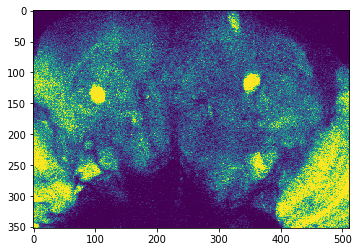

In [11]:
plt.imshow(nib_brain[:,:,100,0])

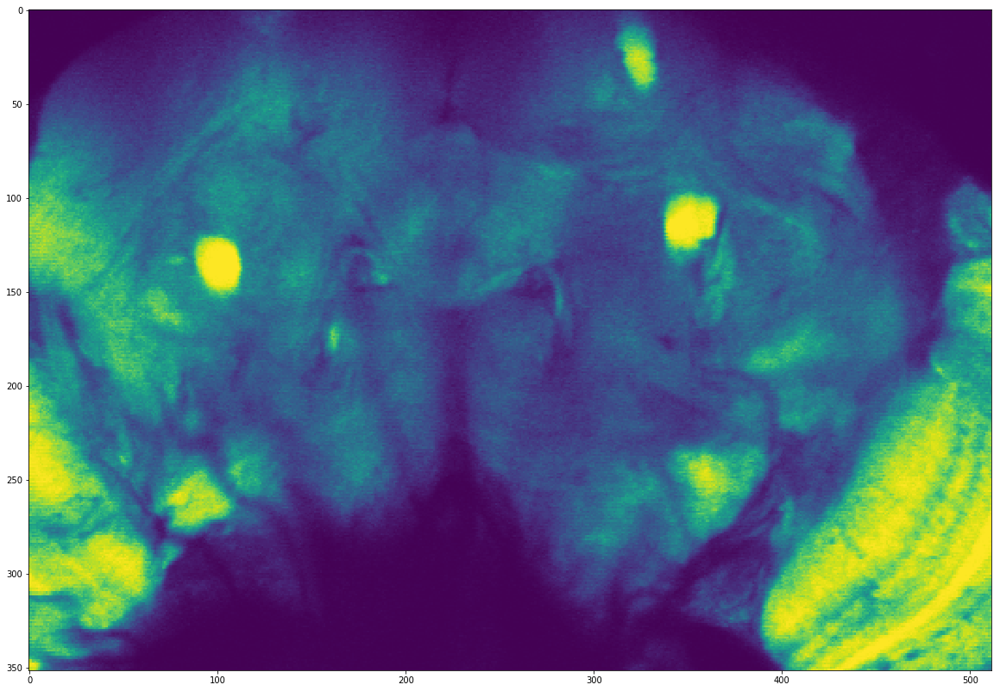

In [17]:
fig = plt.figure(figsize=(20,20))
plt.imshow(meanbrain[:,:,100])

In [10]:
nib_brain.shape

(352, 512, 271, 29)

In [18]:
meanbrain = brain.mean(3)
meanbrain = ants.from_numpy(meanbrain)

In [53]:
motCorr_brain = []
t0 = time()
for i in range(np.shape(nib_brain)[3]):
    print(i)
    brain_slice = ants.from_numpy(nib_brain[:,:,:,i])
    motCorr_slice = ants.registration(meanbrain, brain_slice, type_of_transform='QuickRigid')
    motCorr_slice = motCorr_slice['warpedmovout'].numpy()
    motCorr_brain.append(motCorr_slice)
    
#np.save(save_file, motCorr_brain)
print(time()-t0)

0
0.0003190040588378906
0.5601434707641602
25.19920778274536
25.41342544555664
25.41380262374878
1
25.413887977600098
25.98303198814392


KeyboardInterrupt: 

In [56]:
brain_slice.dtype

'float32'

In [57]:
brain_slice

ANTsImage
	 Pixel Type : float
	 Components : 1
	 Dimensions : (352, 512, 271)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

In [52]:
t0 = time()
motCorr_slice = motCorr_slice['warpedmovout'].numpy()
print(time()-t0)

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [48]:
os.environ[ "ITK_GLOBAL_DEFAULT_NUMBER_OF_THREADS" ] = "2"

In [40]:
threading.active_count()

6

In [29]:
print(os.environ.get("ITK_GLOBAL_DEFAULT_NUMBER_OF_THREADS"))

None


In [35]:
%env ITK_GLOBAL_DEFAULT_NUMBER_OF_THREADS=1

env: ITK_GLOBAL_DEFAULT_NUMBER_OF_THREADS=1


In [25]:
ITK_GLOBAL_DEFAULT_NUMBER_OF_THREADS = 1

In [ ]:
motCorr_brain = np.moveaxis(np.asarray(motCorr_brain),0,3)
motCorr_brain_ants = ants.from_numpy(motCorr_brain)

In [ ]:
### Get fictrac timing info ###

# probably just 0 (defines the start of whole imaging session)

xml_file = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20181217/fly2/TSeries-12172018-1322-001.xml'

tree = ET.parse(xml_file)
root = tree.getroot()

sequence = int(root.find('Sequence').find('VoltageOutput').get('relativeTime'))